# Case Study 1

#### Predicting Central Neuropathic Pain (CNP) in people with Spinal Cord Injury (SCI) from Electroencephalogram (EEG) data.

* CNP is pain in response to non-painful stimuli, episodic (electric shock), “pins and needles”, numbness
* There is currently no treatment, only prevention
* Preventative medications have strong side-effects
* Predicting whether a patient is likely to develop pain is useful for selective treatment

#### Task
Your task is to devise a feature engineering strategy which, in combination with a classifier of your choice, optizimes prediction accuracy.

#### Data
The data is preprocessed brain EEG data from SCI patients recorded while resting with eyes closed (EC) and eyes opened (EO).
* 48 electrodes recording electrical activity of the brain at 250 Hz 
* 2 classes: subject will / will not develop neuropathic pain within 6 months
* 18 subjects: 10 developed pain and 8 didn’t develop pain
* the data has already undergone some preprocessing
  * Signal denoising and normalization
  * Temporal segmentation
  * Frequency band power estimation
  * Normalization with respect to total band power
  * Features include normalized alpha, beta, theta band power while eyes closed, eyes opened, and taking the ratio of eo/ec.
* the data is provided in a single table ('data.csv') consisting of 
  * 180 rows (18 subjects x 10 repetitions), each containing
  * 432 columns (9 features x 48 electrodes)
  * rows are in subject major order, i.e. rows 0-9 are all samples from subject 0, rows 10-19 all samples from subject 1, etc.
  * columns are in feature_type major order, i.e. columns 0-47 are alpha band power, eyes closed, electrodes 0-48
  * feature identifiers for all columns are stored in 'feature_names.csv'
  * 'labels.csv' defines the corresponding class (0 or 1) to each row in data.csv

#### Objective Measure
Leave one subject out cross-validation accuracy, sensitivity and specificity.

#### Report
Report on your feature engineering pipeline, the classifier used to evaluate performance, and the performance as mean and standard deviation of accuracy, sensitivity and specificity across folds. Give evidence for why your strategy is better than others.




In [2]:
import csv
import numpy as np

from matplotlib import pyplot as plt

In [3]:
# load data
# rows in X are subject major order, i.e. rows 0-9 are all samples from subject 0, rows 10-19 all samples from subject 1, etc.
# columns in X are in feature_type major order, i.e. columns 0-47 are alpha band power, eyes closed, electrodes 0-48
# feature identifiers for all columns in X are stored in feature_names.csv
X = np.loadtxt('data.csv', delimiter=',') 
y = np.loadtxt('labels.csv', delimiter=',')
with open('feature_names.csv') as f:
    csvreader = csv.reader(f, delimiter=',')
    feature_names = [row for row in csvreader][0]

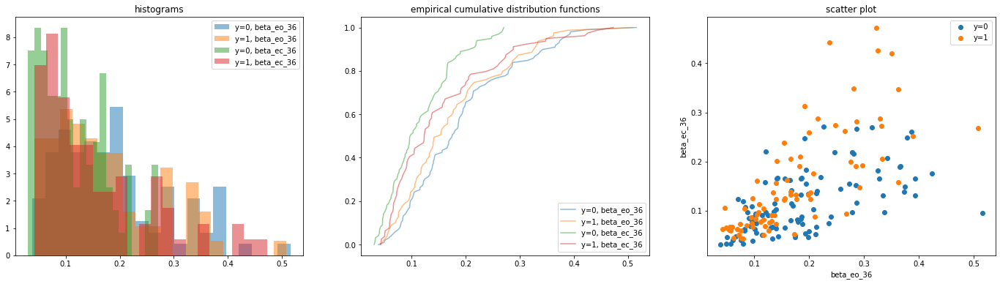

In [4]:
# plotting data in 2D with axes sampled 
# a) at random 
# b) from same electrode
# c) from same feature type
num_features = 9
num_electrodes = 48

# a) indices drawn at random
i0, i1 = np.random.randint(0, X.shape[1], size=2)

# b) same electrode, different feature (uncomment lines below)
#f0, f1 = np.random.randint(0, num_features, size=2)
#e = np.random.randint(0, num_electrodes)
#i0, i1 = f0*num_electrodes + e, f1*num_electrodes + e

# b) same feature, different electrode (uncomment lines below)
#f = np.random.randint(0, num_features)
#e0, e1 = np.random.randint(0, num_electrodes, size=2)
#i0, i1 = f*num_electrodes + e0, f*num_electrodes + e1

fig, axes = plt.subplots(1, 3, figsize=(24, 6))
colors = ['blue', 'red']

# select features i0, i1 and separate by class
X00, X01 = X[y==0][:,i0], X[y==1][:,i0]
X10, X11 = X[y==0][:,i1], X[y==1][:,i1]
# plot cumulative distribution of feature i0 separate for each class
axes[0].hist(X00, bins=20, label='y=0, '+ feature_names[i0], density=True, alpha=0.5)
axes[0].hist(X01, bins=20, label='y=1, '+ feature_names[i0], density=True, alpha=0.5)
axes[0].hist(X10, bins=20, label='y=0, '+ feature_names[i1], density=True, alpha=0.5)
axes[0].hist(X11, bins=20, label='y=1, '+ feature_names[i1], density=True, alpha=0.5)
axes[0].set_title('histograms')
axes[0].legend()
axes[1].plot(np.sort(X00), np.linspace(0,1,X00.shape[0]), label='y=0, '+ feature_names[i0], alpha=0.5)
axes[1].plot(np.sort(X01), np.linspace(0,1,X01.shape[0]), label='y=1, '+ feature_names[i0], alpha=0.5)
axes[1].plot(np.sort(X10), np.linspace(0,1,X10.shape[0]), label='y=0, '+ feature_names[i1], alpha=0.5)
axes[1].plot(np.sort(X11), np.linspace(0,1,X11.shape[0]), label='y=1, '+ feature_names[i1], alpha=0.5)
axes[1].set_title('empirical cumulative distribution functions')
axes[1].legend()
axes[2].scatter(X00, X10, label='y=0')
axes[2].scatter(X01, X11, label='y=1')
axes[2].set_xlabel(feature_names[i0])
axes[2].set_ylabel(feature_names[i1])
axes[2].set_title('scatter plot')
axes[2].legend()

In [58]:
import sys
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score, KFold, train_test_split
from sklearn.metrics import accuracy_score, roc_curve, roc_auc_score

# Use KNearest Neighbor to see performance with all features
c_v = KFold(n_splits = 10)
n_n = 11

# uses knn on a given set of data and returns the accuracy
def get_acc(data, labels, cv, nn):
    model = KNeighborsClassifier(nn)
    fold_accuracy = []
    for X_train_i, X_test_i in cv.split(data):
        X_train_cv, X_test_cv = data[X_train_i], data[X_test_i]
        t_train_cv, t_test_cv = labels[X_train_i], labels[X_test_i]
        model.fit(X_train_cv, t_train_cv)
        #fold_loss.append(np.mean((t_test_cv - model.predict(X_test_cv)) ** 2))
        fold_accuracy.append(accuracy_score(t_test_cv, model.predict(X_test_cv)))
    return np.mean(fold_accuracy)

# uses knn on a given set of data and returns the AUC score
def Get_Auc(data, name, nn):
    X_train, X_test, y_train, y_test = train_test_split(data,y,test_size=0.20, random_state=123)
    reg= KNeighborsClassifier(nn)
    clf1 = reg.fit(X_train, y_train)
    y_pred1 = clf1.predict(X_test)
    y_pred_proba1 = clf1.predict_proba(X_test)[:,1]
    fpr1, tpr1, _ = roc_curve(y_test,  y_pred_proba1)
    auc1 = roc_auc_score(y_test, y_pred_proba1)
    return auc1

# Removes the first feature that increases or maintains the AUC score of the new data set
def KNN_Remove_One_Equal_AUC(data, cv, nn):
    base_acc = Get_Auc(data, cv, nn)
    removed_acc = []
    for i in range(len(data[0])):
        new_data = np.delete(data, i, axis=1)
        rem_acc = Get_Auc(new_data, cv, nn)
        print('Base AUC: {0}, New AUC: {1} at index {2}'.format(base_acc, rem_acc, i))
        if (rem_acc >= base_acc):
            print('Removing feature at index:{0}'.format(i))
            return new_data, True
    return data, False

# Removes the first feature that increases the AUC score of the new data set
def KNN_Remove_One_Greater_AUC(data, cv, nn):
    base_acc = Get_Auc(data, cv, nn)
    removed_acc = []
    for i in range(len(data[0])):
        new_data = np.delete(data, i, axis=1)
        rem_acc = Get_Auc(new_data, cv, nn)
        print('Base AUC: {0}, New AUC: {1} at index {2}'.format(base_acc, rem_acc, i))
        if (rem_acc > base_acc):
            print('Removing feature at index:{0}'.format(i))
            return new_data, True
    return data, False

# Removes the first feature that increases or maintains the accuracy of the new data set
def KNN_Remove_One_Equal(data, labels, cv, nn):
    base_acc = get_acc(data, labels, cv, nn)
    removed_acc = []
    for i in range(len(data[0])):
        new_data = np.delete(data, i, axis=1)
        rem_acc = get_acc(new_data, y, cv, nn)
        print('Base Accuracy: {0}, New Accuracy: {1} at index {2}'.format(base_acc, rem_acc, i))
        if (rem_acc >= base_acc):
            print('Removing feature at index:{0}'.format(i))
            return new_data, True
    return data, False

# Removes the first feature that increases the accuracy of the new data set
def KNN_Remove_One_Greater(data, labels, cv, nn):
    base_acc = get_acc(data, labels, cv, nn)
    removed_acc = []
    for i in range(len(data[0])):
        new_data = np.delete(data, i, axis=1)
        rem_acc = get_acc(new_data, y, cv, nn)
        print('Base Accuracy: {0}, New Accuracy: {1} at index {2}'.format(base_acc, rem_acc, i))
        if (rem_acc > base_acc):
            print('Removing feature at index:{0}'.format(i))
            return new_data, True
    return data, False

# Removes the first feature that increases the accuracy of the new data set
#    If none are found, it removes the first feature that maintains the accuracy of the new data set
def KNN_Remove_One_Greater_Then_Equal(data, labels, cv, nn):
    base_acc = get_acc(data, labels, cv, nn)
    removed_acc = []
    for i in range(len(data[0])):
        new_data = np.delete(data, i, axis=1)
        rem_acc = get_acc(new_data, y, cv, nn)
        removed_acc.append(rem_acc)
        print('Base Accuracy: {0}, New Accuracy: {1} at index {2}'.format(base_acc, rem_acc, i))
        if (rem_acc > base_acc):
            print('Removing feature at index:{0}'.format(i))
            print('New Shape: {}'.format(new_data.shape))
            return new_data, True
    max_acc = np.max(removed_acc)
    if (max_acc >= base_acc):
        print('No Greater than found, so removing the first equal')
        return np.delete(data, np.argmax(removed_acc), axis=1), True
    else: 
        return data, False

# Removes the feature that increases the accuracy the most of the new data set
def KNN_Remove_One_Max(data, labels, cv, nn):
    base_acc = get_acc(data, labels, cv, nn)
    removed_acc = []
    for i in range(len(data[0])):
        new_data = np.delete(data, i, axis=1)
        rem_acc = get_acc(new_data, y, cv, nn)
        removed_acc.append(rem_acc)
    max_acc = np.max(removed_acc)
    max_acc_index = np.argmax(removed_acc)
    print('Base Accuracy: {0}, New Accuracy: {1} at index {2}'.format(base_acc, max_acc, max_acc_index))
    if (max_acc > base_acc):
        return np.delete(data, max_acc_index, axis=1), True
    else: 
        return data, False

# Removes the feature that increases the accuracy the most of the new data set
#    If none are found, removes a feature that maintains the accuracy of the new data set
def KNN_Remove_One_Max_Equal(data, labels, cv, nn):
    base_acc = get_acc(data, labels, cv, nn)
    removed_acc = []
    for i in range(len(data[0])):
        new_data = np.delete(data, i, axis=1)
        rem_acc = get_acc(new_data, y, cv, nn)
        removed_acc.append(rem_acc)
    max_acc = np.max(removed_acc)
    max_acc_index = np.argmax(removed_acc)
    print('Base Accuracy: {0}, New Accuracy: {1} at index {2}'.format(base_acc, max_acc, max_acc_index))
    if (max_acc >= base_acc):
        return np.delete(data, max_acc_index, axis=1), True
    else: 
        return data, False
    
# Uses knn on a given data set and displays the Roc Curve graph
def Display_Roc_Auc(data, name, nn):
    X_train, X_test, y_train, y_test = train_test_split(data,y,test_size=0.20, random_state=123)
    reg= KNeighborsClassifier(nn)
    clf1 = reg.fit(X_train, y_train)
    y_pred1 = clf1.predict(X_test)
    y_pred_proba1 = clf1.predict_proba(X_test)[:,1]
    fpr1, tpr1, _ = roc_curve(y_test,  y_pred_proba1)
    auc1 = roc_auc_score(y_test, y_pred_proba1)
    plt.plot(fpr1,tpr1,'ro-',label=" auc="+str(auc1))
    plt.legend(loc=4)
    plt.title(name)
    plt.show()



In [13]:
from time import process_time

# Get results for remove one where we prioritize greater then, but also remove equals
start = process_time()
cur_data, removed = KNN_Remove_One_Greater_Then_Equal(X, y, c_v, n_n)
while (removed):
    cur_data, removed = KNN_Remove_One_Greater_Then_Equal(cur_data, y, c_v, n_n)
end = process_time()

data_greater_equal = cur_data
data_greater_equal_time = end - start
print(data_greater_equal_time)

Base Accuracy: 0.65, New Accuracy: 0.65 at index 0
Base Accuracy: 0.65, New Accuracy: 0.65 at index 1
Base Accuracy: 0.65, New Accuracy: 0.65 at index 2
Base Accuracy: 0.65, New Accuracy: 0.65 at index 3
Base Accuracy: 0.65, New Accuracy: 0.65 at index 4
Base Accuracy: 0.65, New Accuracy: 0.65 at index 5
Base Accuracy: 0.65, New Accuracy: 0.65 at index 6
Base Accuracy: 0.65, New Accuracy: 0.65 at index 7
Base Accuracy: 0.65, New Accuracy: 0.65 at index 8
Base Accuracy: 0.65, New Accuracy: 0.65 at index 9
Base Accuracy: 0.65, New Accuracy: 0.65 at index 10
Base Accuracy: 0.65, New Accuracy: 0.65 at index 11
Base Accuracy: 0.65, New Accuracy: 0.65 at index 12
Base Accuracy: 0.65, New Accuracy: 0.65 at index 13
Base Accuracy: 0.65, New Accuracy: 0.65 at index 14
Base Accuracy: 0.65, New Accuracy: 0.65 at index 15
Base Accuracy: 0.65, New Accuracy: 0.6444444444444445 at index 16
Base Accuracy: 0.65, New Accuracy: 0.65 at index 17
Base Accuracy: 0.65, New Accuracy: 0.65 at index 18
Base Acc

Base Accuracy: 0.65, New Accuracy: 0.65 at index 158
Base Accuracy: 0.65, New Accuracy: 0.65 at index 159
Base Accuracy: 0.65, New Accuracy: 0.65 at index 160
Base Accuracy: 0.65, New Accuracy: 0.65 at index 161
Base Accuracy: 0.65, New Accuracy: 0.65 at index 162
Base Accuracy: 0.65, New Accuracy: 0.65 at index 163
Base Accuracy: 0.65, New Accuracy: 0.65 at index 164
Base Accuracy: 0.65, New Accuracy: 0.65 at index 165
Base Accuracy: 0.65, New Accuracy: 0.65 at index 166
Base Accuracy: 0.65, New Accuracy: 0.65 at index 167
Base Accuracy: 0.65, New Accuracy: 0.65 at index 168
Base Accuracy: 0.65, New Accuracy: 0.65 at index 169
Base Accuracy: 0.65, New Accuracy: 0.65 at index 170
Base Accuracy: 0.65, New Accuracy: 0.6444444444444445 at index 171
Base Accuracy: 0.65, New Accuracy: 0.65 at index 172
Base Accuracy: 0.65, New Accuracy: 0.65 at index 173
Base Accuracy: 0.65, New Accuracy: 0.65 at index 174
Base Accuracy: 0.65, New Accuracy: 0.65 at index 175
Base Accuracy: 0.65, New Accurac

Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 16
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 17
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 18
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 19
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 20
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 21
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 22
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 23
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 24
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 25
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 26
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 27
Base Accuracy: 0.6555555555555556, New A

Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 121
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 122
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 123
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 124
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 125
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 126
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 127
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 128
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 129
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 130
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 131
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 132
Base Accuracy: 0.65555555555

Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 224
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 225
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 226
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 227
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 228
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 229
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 230
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 231
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 232
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 233
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 234
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 235
Base Accuracy: 0.65555555555

Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 31
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 32
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 33
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 34
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 35
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 36
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 37
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 38
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 39
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 40
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 41
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 42
Base Accuracy: 0.6666666666666667, New A

Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 136
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 137
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 138
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 139
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 140
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 141
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 142
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 143
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 144
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 145
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 146
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 147
Base Accuracy: 0.66666666666

Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 238
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 239
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 240
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 241
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 242
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 243
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 244
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 245
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 246
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 247
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 248
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 249
Base Accuracy: 0.66666666666

Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 33
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 36
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 39
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 40
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 41
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 42
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 43
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 44
Base Accuracy: 0.6777777777777778, New A

Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 135
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 136
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 137
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 138
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 139
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 140
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 141
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 142
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 143
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 144
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 145
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 146
Base Accuracy: 0.67777777777

Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 237
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 238
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 239
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 240
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 241
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 242
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 243
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 244
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 245
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 246
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 247
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 248
Base Accuracy: 0.67777777777

Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 340
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 341
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 342
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 343
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 344
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 345
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 346
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 347
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 348
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 349
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 350
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6666666666666667 at index 351
Base Accuracy: 0.67777777777

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 64
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 67
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 68
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 69
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 70
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 71
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 72
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 73
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 74
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 75
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 168
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 169
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 170
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 171
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 172
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 173
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 174
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 175
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 176
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 177
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 178
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 179
Base Accuracy: 0.68333333333

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 270
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 271
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 272
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 273
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 274
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 275
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 276
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 277
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 278
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 279
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 280
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 281
Base Accuracy: 0.68333333333

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 6
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 7
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 9
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 11
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 12
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 13
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 14
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 15
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 16
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 17
Base Accuracy: 0.6888888888888889, New Accur

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 110
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 111
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 112
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 113
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 114
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 115
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 116
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 117
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 118
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 119
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 120
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 121
Base Accuracy: 0.68888888888

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 212
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 213
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 214
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 215
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 216
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 217
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 218
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 219
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 220
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 221
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 222
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.68888888888

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 316
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 317
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 318
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 319
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 320
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 321
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 322
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 323
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6666666666666667 at index 324
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 325
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 326
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6666666666666667 at index 327
Base Accuracy: 0.68888888888

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 418
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 419
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6666666666666667 at index 420
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 421
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6944444444444444 at index 422
Removing feature at index:422
New Shape: (180, 424)
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 a

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 99
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 100
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 104
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 105
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 106
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 107
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 108
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 109
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 110
Base Accuracy: 0.694444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 201
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 202
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 203
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 204
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 205
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 206
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 207
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 208
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 209
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 210
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 211
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 212
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 304
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 305
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 306
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 307
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 308
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 309
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 310
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 311
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 312
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 313
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 314
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 315
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 408
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 409
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 410
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 411
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 412
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 413
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 414
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 415
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 416
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 417
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 418
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 419
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 93
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 95
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 97
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 191
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 192
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 193
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 194
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 195
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 196
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 197
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 198
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 199
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 200
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 201
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 202
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 294
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 295
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 296
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 297
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 298
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 299
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 300
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 301
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 302
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 303
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 304
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 305
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 399
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 400
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 401
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 402
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 403
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 404
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 405
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 406
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 407
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 408
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 409
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 410
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 89
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 181
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 182
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 183
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 184
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 185
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 186
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 187
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 188
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 189
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 190
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 191
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 192
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 286
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 287
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 288
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 289
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 290
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 291
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 292
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 293
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 294
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 295
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 296
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 297
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 388
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 389
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 390
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 391
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 392
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 393
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 394
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 395
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 396
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 397
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 398
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 399
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 77
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 81
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 172
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 173
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 174
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 175
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 176
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 177
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 178
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 179
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 180
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 181
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 182
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 183
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 275
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 276
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 277
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 278
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 279
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 280
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 281
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 282
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 283
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 284
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 285
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 286
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 378
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 379
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 380
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 381
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 382
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 383
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 384
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 385
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 386
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 387
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 388
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 389
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 72
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 163
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 164
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 165
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 166
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 167
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 168
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 169
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 170
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 171
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 172
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 173
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 174
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 265
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 266
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 267
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 268
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 269
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 270
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 271
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 272
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 273
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 274
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 275
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 276
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 367
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 368
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 369
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 370
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 371
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 372
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 373
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 374
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 375
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 376
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 377
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 378
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 60
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 153
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 155
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 156
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 157
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 158
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 159
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 160
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 161
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 162
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 163
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 254
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 255
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 256
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 257
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 258
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 259
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 260
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 261
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 262
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 263
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 264
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 265
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 356
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 357
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 358
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 359
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 360
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 361
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 362
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 363
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 364
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 365
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 366
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 367
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 50
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 142
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 143
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 144
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 145
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 146
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 147
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 148
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 149
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 150
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 151
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 153
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 244
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 245
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 246
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 247
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 248
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 249
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 250
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 251
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 252
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 253
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 254
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 255
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 347
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 348
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 349
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 350
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 351
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 352
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 353
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 354
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 355
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 356
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 357
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 358
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 44
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 135
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 136
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 137
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 138
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 139
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 140
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 141
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 142
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 143
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 144
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 145
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 146
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 237
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 239
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 240
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 241
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 242
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 243
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 244
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 245
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 246
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 247
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 248
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 341
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 342
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 343
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 344
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 345
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 346
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 347
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 348
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 349
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 350
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 351
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 352
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 133
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 134
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 135
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 136
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 137
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 138
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 139
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 140
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 141
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 236
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 237
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 239
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 240
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 241
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 242
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 243
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 244
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 338
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 339
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 340
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 341
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 342
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 343
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 344
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 345
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 346
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 129
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 133
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 134
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 225
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 226
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 230
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 231
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 236
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 327
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 328
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 329
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 330
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 332
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 333
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 338
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 118
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 119
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 120
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 121
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 129
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 224
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 225
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 226
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 230
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 231
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 327
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 328
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 329
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 330
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 332
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 333
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 338
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 25
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 118
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 119
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 120
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 121
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 129
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 222
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 223
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 224
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 225
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 229
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 230
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 231
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 233
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 324
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 325
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 326
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 327
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 328
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 329
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 330
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 332
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 333
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 335
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 25
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 119
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 120
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 121
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 129
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 130
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 224
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 225
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 230
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 231
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 235
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 327
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 328
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 329
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 330
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 332
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 333
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 338
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 129
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 133
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 225
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 230
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 231
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 236
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 328
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 329
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 330
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 332
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 333
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 338
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 339
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 129
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 133
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 134
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 230
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 231
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 236
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 237
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 332
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 333
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 338
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 339
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 340
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 341
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 342
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 35
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 129
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 133
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 134
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 135
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 136
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 137
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 138
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 139
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 140
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 236
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 237
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 239
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 240
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 241
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 242
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 243
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 338
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 339
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 340
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 341
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 342
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 343
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 344
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 345
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 38
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 133
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 134
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 135
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 136
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 137
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 138
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 139
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 140
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 141
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 142
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 236
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 237
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 239
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 240
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 241
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 242
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 243
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 244
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 338
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 339
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 340
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 341
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 342
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 343
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 344
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 345
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 346
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 347
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 348
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 43
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 137
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 138
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 139
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 140
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 141
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 142
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 143
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 144
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 145
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 146
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 147
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 148
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 239
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 240
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 241
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 242
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 243
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 244
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 245
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 246
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 247
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 248
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 249
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 250
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 342
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 343
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 344
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 345
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 346
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 347
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 348
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 349
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 350
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 351
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 352
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 353
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 51
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 142
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 143
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 144
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 145
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 146
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 147
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 148
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 149
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 150
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 151
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 153
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 245
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 246
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 247
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 248
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 249
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 250
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 251
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 252
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 253
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 254
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 255
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 256
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 349
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 350
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 351
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 352
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 353
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 354
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 355
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 356
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 357
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 358
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 359
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 360
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 57
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 148
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 149
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 150
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 151
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 153
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 155
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 156
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 157
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 158
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 159
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 252
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 253
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 254
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 255
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 256
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 257
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 258
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 259
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 260
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 261
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 262
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 263
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 356
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 357
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 358
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 359
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 360
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 361
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 362
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 363
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 364
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 365
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 366
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 367
Base Accuracy: 0.6944444444444444, New Acc

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 158
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 159
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 160
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 161
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 162
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 163
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 164
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 165
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 166
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 167
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 168
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 169
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 261
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 262
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 263
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 264
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 265
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 266
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 267
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 268
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 269
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 270
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 271
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 272
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 364
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 365
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 366
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 367
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 368
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 369
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 370
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 371
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 372
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 373
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 374
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 375
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 75
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 168
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 169
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 170
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 171
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 172
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 173
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 174
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 175
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 176
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 177
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 178
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 179
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 270
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 271
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 272
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 273
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 274
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 275
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 276
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 277
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 278
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 279
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 280
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 281
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 372
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 373
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 374
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 375
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 376
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 377
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 378
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 379
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 380
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 381
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 382
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 383
Base Accuracy: 0.6944444444444444, New Acc

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 77
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 84
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 175
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 176
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 177
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 178
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 179
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 180
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 181
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 182
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 183
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 184
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 185
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 186
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 279
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 280
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 281
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 282
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 283
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 284
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 285
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 286
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 287
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 288
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 289
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 290
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 384
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 385
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 386
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 387
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 388
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 389
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 390
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 391
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 392
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 393
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 394
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 395
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 93
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 95
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 96
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 189
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 190
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 191
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 192
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 193
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 194
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 195
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 196
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 197
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 198
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 199
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 200
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 293
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 294
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 295
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 296
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 297
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 298
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 299
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 300
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 301
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 302
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 303
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 304
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 396
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 397
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 398
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 399
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 400
No Greater than found, so removing the first equal
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 6
Base 

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 100
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 104
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 105
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 106
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 107
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 108
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 109
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 110
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 111
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 203
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 204
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 205
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 206
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 207
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 208
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 209
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 210
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 211
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 212
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 213
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 214
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 305
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 306
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 307
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 308
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 309
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 310
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 311
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 312
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 313
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 314
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 315
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 316
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Ac

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 114
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 115
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 116
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 117
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 118
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 119
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 120
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 121
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 125
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 216
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 217
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 218
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 219
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 220
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 221
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 222
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 224
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 225
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 320
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 321
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 322
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 323
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 324
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 325
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 326
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 327
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 328
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 329
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 330
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 331
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 34
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 129
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 133
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 134
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 135
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 136
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 137
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 138
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 236
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 237
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 239
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 240
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 241
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 242
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 243
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 338
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 339
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 340
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 341
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 342
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 343
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 344
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 345
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 144
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 145
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 146
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 147
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 148
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 149
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 150
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 151
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 153
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 155
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 247
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 248
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 249
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 250
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 251
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 252
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 253
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 254
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 255
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 256
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 257
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 258
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 350
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 351
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 352
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 353
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 354
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 355
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 356
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 357
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 358
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 359
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 360
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 361
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 69
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 161
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 162
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 163
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 164
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 165
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 166
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 167
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 168
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 169
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 170
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 171
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 172
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 264
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 265
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 266
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 267
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 268
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 269
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 270
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 271
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 272
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 273
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 274
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 275
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 369
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 370
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 371
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 372
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 373
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 374
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 375
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 376
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 377
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 378
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 379
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 380
Base Accuracy: 0.6944444444444444, New Acc

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 77
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 86
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 180
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 181
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 182
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 183
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 184
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 185
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 186
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 187
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 188
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 189
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 190
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 191
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 282
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 283
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 284
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 285
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 286
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 287
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 288
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 289
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 290
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 291
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 292
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 293
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 386
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 387
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 388
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 389
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 390
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 391
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 392
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555557 at index 393
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 394
No Greater than found, so removing the first equal
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.68333333333

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 95
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 97
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 98
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 99
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 100
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 104
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 105
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 106
Base Accuracy: 0.6944444444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 199
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 200
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 201
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 202
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 203
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 204
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 205
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 206
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 207
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 208
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 209
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 210
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 302
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 303
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 304
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 305
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 306
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 307
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 308
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 309
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 310
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 311
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 312
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 313
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 22
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 114
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 115
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 116
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 117
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 118
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 119
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 120
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 121
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 125
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 217
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 218
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 219
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 220
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 221
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 222
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 224
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 225
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 226
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 319
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 320
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 321
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 322
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 323
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 324
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 325
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 326
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 327
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 328
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 329
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 330
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 133
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 134
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 135
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 136
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 137
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 138
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 139
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 140
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 141
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 142
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 143
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 236
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 237
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 239
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 240
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 241
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 242
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 243
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 244
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 245
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 338
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 339
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 340
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 341
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 342
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 343
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 344
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 345
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 346
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 347
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 348
Base Accuracy: 0.6944444444444444, New Acc

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 61
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 153
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 155
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 156
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 157
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 158
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 159
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 160
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 161
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 162
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 163
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 256
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 257
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 258
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 259
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 260
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 261
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 262
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 263
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 264
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 265
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 266
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 267
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 360
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 361
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 362
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 363
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 364
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 365
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 366
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 367
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 368
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 369
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 370
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 371
Base Accuracy: 0.6944444444444444, New Acc

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 77
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 83
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 174
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 175
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 176
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 177
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 178
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 179
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 180
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 181
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 182
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 183
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 184
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 185
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 277
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 278
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 279
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 280
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 281
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 282
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 283
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 284
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 285
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 286
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 287
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 288
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 379
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 380
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 381
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 382
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 383
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 384
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 385
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 386
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 387
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555557 at index 388
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 389
No Greater than found, so removing the first equal
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 93
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 95
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 97
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 98
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 99
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 100
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 103
Base Accuracy: 0.6944444444444444, N

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 197
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 198
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 199
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 200
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 201
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 202
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 203
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 204
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 205
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 206
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 207
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 208
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 300
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 301
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 302
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 303
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 304
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 305
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 306
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 307
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 308
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 309
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 310
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 311
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 121
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 129
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 132
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 228
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 229
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 230
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 231
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 236
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 237
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 328
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 329
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 330
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 332
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 333
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 338
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 339
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 56
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 147
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 148
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 149
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 150
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 151
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 153
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 155
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 156
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 157
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 158
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 251
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 252
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 253
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 254
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 255
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 256
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 257
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 258
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 259
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 260
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 261
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 262
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 354
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 355
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 356
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 357
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 358
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 359
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 360
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 361
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 362
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 363
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 364
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 365
Base Accuracy: 0.6944444444444444, New Acc

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 77
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 81
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 174
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 175
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 176
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 177
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 178
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 179
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 180
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 181
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 182
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 183
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 184
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 185
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 276
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 277
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 278
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 279
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 280
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 281
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 282
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 283
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 284
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 285
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 286
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 287
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 379
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 380
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 381
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 382
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 383
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555557 at index 384
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 385
No Greater than found, so removing the first equal
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.683333333333333

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 97
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 98
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 99
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 100
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 104
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 105
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 106
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 107
Base Accuracy: 0.694444444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 198
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 199
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 200
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 201
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 202
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 203
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 204
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 205
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 206
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 207
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 208
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 209
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 302
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 303
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 304
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 305
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 306
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 307
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 308
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 309
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 310
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 311
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 312
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 313
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 129
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 133
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 134
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 135
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 228
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 230
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 231
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 236
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 237
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 238
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 332
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 333
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 338
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 339
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 340
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 341
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 342
Base Accuracy: 0.6944444444444444, New Acc

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 61
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 155
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 156
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 157
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 158
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 159
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 160
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 161
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 162
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 163
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 164
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 165
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 258
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 259
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 260
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 261
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 262
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 263
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 264
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 265
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 266
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 267
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 268
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 269
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 363
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 364
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 365
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 366
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 367
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 368
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 369
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 370
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 371
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 372
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 373
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 374
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 93
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 95
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 187
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 188
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 189
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 190
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 191
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 192
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 193
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 194
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 195
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 196
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 197
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 198
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 291
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 292
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 293
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 294
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 295
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 296
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 297
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 298
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 299
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 300
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 301
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 302
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 116
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 117
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 118
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 119
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 120
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 121
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 127
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 219
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 220
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 221
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 222
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 224
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 225
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 228
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 230
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 323
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 324
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 325
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 326
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 327
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 328
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 329
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 330
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 332
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 333
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 334
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 56
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 149
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 150
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 151
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 153
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 155
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 156
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 157
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 158
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 159
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 160
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 253
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 254
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 255
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 256
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 257
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 258
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 259
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 260
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 261
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 262
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 263
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 264
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 357
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 358
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 359
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 360
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 361
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 362
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 363
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 364
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 365
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 366
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 367
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 368
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 91
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 184
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 185
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 186
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 187
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 188
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 189
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 190
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 191
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 192
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 193
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 194
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 195
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 288
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 289
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 290
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 291
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 292
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 293
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 294
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 295
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 296
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 297
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 298
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 299
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 115
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 116
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 117
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 118
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 119
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 120
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 121
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 126
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 217
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 218
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 219
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 220
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 221
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 222
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 224
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 225
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 226
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 228
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 321
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 322
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 323
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 324
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 325
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 326
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 327
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 328
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 329
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 330
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 332
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 57
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 150
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 151
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 153
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 155
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 156
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 157
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 158
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 159
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 160
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 161
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 254
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 255
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 256
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 257
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 258
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 259
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 260
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 261
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 262
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 263
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 264
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 265
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 358
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 359
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 360
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 361
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 362
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 363
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 364
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 365
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 366
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 367
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 368
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 369
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 93
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 95
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 188
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 189
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 190
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 191
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 192
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 193
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 194
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 195
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 196
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 197
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 198
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 199
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 292
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 293
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 294
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 295
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 296
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 297
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 298
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 299
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 300
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 301
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 302
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 303
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 31
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 129
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 133
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 134
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 135
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 230
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 231
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 236
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 237
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 238
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 239
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 330
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 332
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 333
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6444444444444445 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 338
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 339
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 340
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 341
Base Accuracy: 0.6944444444444444, New Accuracy: 0.67222

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 69
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 162
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 163
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 164
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 165
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 166
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 167
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 168
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 169
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 170
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 171
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 172
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 173
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 266
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 267
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 268
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 269
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 270
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 271
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 272
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 273
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 274
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 275
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 276
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 277
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 370
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 371
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555557 at index 372
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 373
No Greater than found, so removing the first equal
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at i

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 100
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 104
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 105
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 106
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 107
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 108
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 109
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 110
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 111
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 204
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 205
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 206
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 207
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 208
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 209
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 210
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 211
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 212
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 213
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 214
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 215
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 308
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 309
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 310
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 311
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 312
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 313
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 314
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 315
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 316
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 317
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 318
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 319
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 140
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 141
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 142
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 143
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 144
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 145
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 146
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 147
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 148
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 149
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 150
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 151
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 245
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 246
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 247
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 248
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 249
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 250
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 251
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 252
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 253
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 254
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 255
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 256
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 347
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 348
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 349
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 350
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 351
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 352
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 353
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 354
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 355
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 356
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 357
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 358
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 89
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 181
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 182
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 183
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 184
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 185
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 186
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 187
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 188
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 189
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 190
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 191
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 192
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 286
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 287
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 288
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 289
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 290
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 291
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 292
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 293
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 294
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 295
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 296
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 297
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 129
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 133
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 226
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 227
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 228
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 229
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 230
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 231
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 232
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 233
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 234
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 235
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 236
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 237
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 330
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6444444444444445 at index 331
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 332
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 333
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 334
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 335
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 336
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 337
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 338
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 339
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 340
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222222 at index 341
Base Accuracy: 0.6944444444444444, New Acc

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 75
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 168
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 169
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 170
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 171
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 172
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 173
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 174
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 175
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 176
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 177
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 178
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 179
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 272
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 273
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 274
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 275
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 276
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 277
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 278
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 279
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 280
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 281
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 282
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 283
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 17
Base Accuracy: 0.6944444444444444, New Accur

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 110
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 111
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 112
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 113
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 114
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 115
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 116
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 117
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 118
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 119
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 120
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 121
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 214
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 215
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 216
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 217
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 218
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 219
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 220
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 221
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 222
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 224
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 225
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 318
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 319
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 320
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 321
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 322
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 323
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 324
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 325
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 326
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 327
Base Accuracy: 0.6944444444444444, New Accuracy: 0.65 at index 328
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6444444444444445 at index 329
Base Accuracy: 0.6944444444444444, New Accuracy: 0.66666

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 64
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 157
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 158
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 159
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 160
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 161
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 162
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 163
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 164
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 165
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 166
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 167
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 168
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 261
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 262
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 263
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 264
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 265
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 266
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 267
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 268
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 269
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 270
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 271
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 272
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555557 at index 365
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 366
No Greater than found, so removing the first equal
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 104
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 105
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 106
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 107
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 108
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 109
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 110
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 111
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 112
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 205
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 206
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 207
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 208
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 209
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 210
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 211
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 212
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 213
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 214
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 215
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 216
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 309
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 310
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 311
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 312
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 313
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 314
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 315
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 316
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 317
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 318
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 319
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 320
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 56
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 149
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 150
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 151
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 153
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 155
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 156
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 157
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 158
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 159
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 160
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 253
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 254
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 255
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 256
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 257
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 258
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 259
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 260
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 261
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 262
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 263
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 264
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 357
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 358
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 359
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 360
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 361
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 362
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555557 at index 363
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 364
No Greater than found, so removing the first equal
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 97
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 98
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 99
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 100
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 104
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 105
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 106
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 107
Base Accuracy: 0.694444444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 200
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 201
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 202
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 203
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 204
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 205
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 206
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 207
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 208
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 209
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 210
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 211
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 303
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 304
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 305
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 306
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 307
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 308
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 309
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 310
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 311
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 312
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 313
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 314
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 53
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 146
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 147
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 148
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 149
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 150
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 151
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 153
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 155
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 156
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 157
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 250
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 251
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 252
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 253
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 254
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 255
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 256
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 257
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 258
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 259
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 260
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 261
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 354
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 355
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 356
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 357
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 358
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 359
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 360
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555557 at index 361
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 362
No Greater than found, so removing the first equal
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.68333333333

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 95
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 97
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 98
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 99
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 100
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 104
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 105
Base Accuracy: 0.6944444444444444,

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 198
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 199
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 200
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 201
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 202
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 203
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 204
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 205
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 206
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 207
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 208
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 209
Base Accuracy: 0.69444444444

Base Accuracy: 0.7, New Accuracy: 0.6944444444444444 at index 21
Base Accuracy: 0.7, New Accuracy: 0.6888888888888889 at index 22
Base Accuracy: 0.7, New Accuracy: 0.7 at index 23
Base Accuracy: 0.7, New Accuracy: 0.7 at index 24
Base Accuracy: 0.7, New Accuracy: 0.7 at index 25
Base Accuracy: 0.7, New Accuracy: 0.6944444444444444 at index 26
Base Accuracy: 0.7, New Accuracy: 0.6944444444444444 at index 27
Base Accuracy: 0.7, New Accuracy: 0.6944444444444444 at index 28
Base Accuracy: 0.7, New Accuracy: 0.6944444444444444 at index 29
Base Accuracy: 0.7, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.7, New Accuracy: 0.6944444444444444 at index 31
Base Accuracy: 0.7, New Accuracy: 0.6944444444444444 at index 32
Base Accuracy: 0.7, New Accuracy: 0.7 at index 33
Base Accuracy: 0.7, New Accuracy: 0.6888888888888889 at index 34
Base Accuracy: 0.7, New Accuracy: 0.6888888888888889 at index 35
Base Accuracy: 0.7, New Accuracy: 0.6888888888888889 at index 36
Base Accuracy: 0.7, 

Base Accuracy: 0.7, New Accuracy: 0.7 at index 181
Base Accuracy: 0.7, New Accuracy: 0.7 at index 182
Base Accuracy: 0.7, New Accuracy: 0.7 at index 183
Base Accuracy: 0.7, New Accuracy: 0.7 at index 184
Base Accuracy: 0.7, New Accuracy: 0.7 at index 185
Base Accuracy: 0.7, New Accuracy: 0.7 at index 186
Base Accuracy: 0.7, New Accuracy: 0.7 at index 187
Base Accuracy: 0.7, New Accuracy: 0.7 at index 188
Base Accuracy: 0.7, New Accuracy: 0.7 at index 189
Base Accuracy: 0.7, New Accuracy: 0.7 at index 190
Base Accuracy: 0.7, New Accuracy: 0.7 at index 191
Base Accuracy: 0.7, New Accuracy: 0.7 at index 192
Base Accuracy: 0.7, New Accuracy: 0.7 at index 193
Base Accuracy: 0.7, New Accuracy: 0.7 at index 194
Base Accuracy: 0.7, New Accuracy: 0.7 at index 195
Base Accuracy: 0.7, New Accuracy: 0.7 at index 196
Base Accuracy: 0.7, New Accuracy: 0.7 at index 197
Base Accuracy: 0.7, New Accuracy: 0.7 at index 198
Base Accuracy: 0.7, New Accuracy: 0.7 at index 199
Base Accuracy: 0.7, New Accurac

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 19
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 20
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 21
Base A

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 118
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 119
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 120
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 129
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 222
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 223
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 224
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 225
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 227
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777777 at index 229
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 230
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 231
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 232
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 330
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 331
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 332
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 333
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 334
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 335
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 336
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 337
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 338
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 339
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 340
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 341
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 81
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 82
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 83
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 84
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 85
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 86
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 87
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 88
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 89
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 90
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 91
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 92
Base Accuracy: 0.7055555555555555, New A

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 184
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 185
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 186
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 187
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 188
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 189
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 190
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 191
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 192
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 193
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 194
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 195
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 290
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 291
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 292
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 293
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 294
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 295
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 296
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 297
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 298
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 299
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 300
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 301
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 302
Base Ac

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 38
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 39
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 40
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 41
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 42
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 43
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 44
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 45
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 46
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 47
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 49
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 50
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 51


Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 148
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 149
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 150
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 151
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 152
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 153
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 154
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 155
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 156
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 157
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 158
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 159
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 251
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 252
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 253
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 254
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 255
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 256
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 257
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 258
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 259
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 260
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 261
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 262
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 357
No Greater than found, so removing the first equal
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 0
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 1
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 2
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 3
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 4
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 5
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 7
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at in

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 109
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 110
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 111
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 112
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 113
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 114
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 115
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 116
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 117
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 118
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 119
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 120
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 213
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 214
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 215
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 216
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 217
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 218
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 219
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 220
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 221
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 222
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 224
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 321
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 322
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 323
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 324
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 325
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 326
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 327
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 328
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 329
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 330
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 331
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 332
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 72
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 73
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 74
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 75
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 76
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 77
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 78
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 79
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 80
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 81
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 82
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 83
Base Accuracy: 0.7055555555555555, New A

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 180
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 181
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 182
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 183
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 184
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 185
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 186
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 187
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 188
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 189
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 190
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 191
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 284
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 285
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 286
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 287
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 288
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 289
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 290
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 291
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 292
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 293
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 294
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 295
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at in

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 36
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 37
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 38
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 39
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 40
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 41
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 42
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 43
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 44
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 45
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 46
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 47
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 49
Base Accuracy: 0.7055555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 148
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 149
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 150
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 151
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 152
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 153
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 154
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 155
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 156
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 157
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 158
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 159
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 252
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 253
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 254
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 255
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 256
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 257
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 258
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 259
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 260
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 261
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 262
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 263
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 0
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 1
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 2
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 3
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 4
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 5
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 6
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 7
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 112
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 113
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 114
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 115
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 116
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 117
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 118
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 119
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 120
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 125
B

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 220
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 221
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 222
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666666 at index 223
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 224
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 225
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 227
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 229
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 230
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 231
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 324
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 325
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 326
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 327
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 328
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 329
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 330
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 331
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 332
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 333
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 334
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 335
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 77
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 78
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 79
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 80
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 81
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 82
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 83
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 84
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 85
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 86
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 87
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 88
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 89
Base Accuracy: 0.7055555555555555, 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 192
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 193
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 194
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 195
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 196
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 197
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 198
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 199
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 200
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 201
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 202
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 203
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 300
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 301
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 302
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 303
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 304
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 305
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 306
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 307
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 308
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 309
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 310
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 311
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 54
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 55
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 56
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 57
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 58
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 59
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 60
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 61
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 62
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 63
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 64
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 65
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 66
Base Accuracy: 0.7055555555555555, New Accuracy: 0

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 166
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 167
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 168
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 169
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 170
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 171
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 172
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 173
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 174
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 175
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 176
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 177
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 178
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 179
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 278
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 279
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 280
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 281
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 282
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 283
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 284
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 285
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 286
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 287
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 288
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 289
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 29
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 31
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 32
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 33
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 34
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 35
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 36
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 37
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 38
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 39
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 40
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 41
Base 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 141
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 142
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 143
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 144
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 145
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 146
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 147
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 148
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 149
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 150
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 151
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 152
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 153
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 154
Base Accuracy: 0

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 257
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 258
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 259
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 260
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 261
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 262
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 263
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 264
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 265
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 266
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 267
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 268
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 19
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 20
Base Accuracy: 0.7055555555555555, New Ac

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 117
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 118
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 119
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 120
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 129
Base Accuracy: 0.70555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 244
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 337
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 338
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 339
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 340
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6611111111111111 at index 341
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 342
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 343
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 344
Base Accuracy: 0.7055555555555555, New Accuracy: 0.65 at index 345
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 346
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 347
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 348
Base Accuracy: 0.7055555555555555, New Acc

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 98
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 99
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 100
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 101
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 102
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 103
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 104
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 105
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 106
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 107
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 108
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 109
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 110
Base Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 214
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 215
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 216
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 217
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666666 at index 218
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 219
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 220
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 221
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 222
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 224
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 225
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 318
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 319
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 320
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 321
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 322
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 323
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 324
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 325
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 326
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 327
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 328
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 329
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 76
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 77
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 78
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 79
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 80
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 81
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 82
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 83
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 84
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 85
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 86
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 87
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 88
Base Accuracy: 0.705

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 192
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 193
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 194
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 195
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 196
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 197
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 198
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 199
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 200
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 201
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 202
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 203
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 204
Base Accuracy: 0.7055555555555555, Ne

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 300
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 301
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 302
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 303
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 304
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 305
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 306
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 307
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 308
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 309
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6555555555555556 at index 310
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777777 at index 311
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 60
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 61
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 62
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 63
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 64
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 65
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 66
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 67
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 68
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 69
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 70
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 71
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 72
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 73
Base Accuracy: 0.7055555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 176
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 177
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 178
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 179
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 180
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 181
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 182
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 183
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 184
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 185
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 186
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 187
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 188
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 189
Base Accuracy: 0.7055555555555555, New Accurac

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 284
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 285
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 286
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 287
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 288
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 289
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 290
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 291
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 292
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 293
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 294
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 295
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at in

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 40
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 41
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 42
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 43
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 44
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 45
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 46
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 47
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 48
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 49
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 50
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 51
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 52
Base 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 152
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 153
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 154
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 155
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 156
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 157
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 158
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 159
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 160
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 161
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 162
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 163
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 164
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 165
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 166
Base Accur

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 264
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 265
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 266
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 267
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 268
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 269
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 270
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 271
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 272
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 273
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 274
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 275
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 23
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 24
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 25
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 26
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 27
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 29
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 31
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 32
Base Accuracy: 0.7055555555555555, New A

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 133
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 134
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 135
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 136
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 137
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 138
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 139
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 140
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 141
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 142
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 143
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 144
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 145
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 146
Base Accuracy: 0.70555555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 249
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 250
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 251
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 252
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 253
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 254
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 255
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 256
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 257
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 258
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 259
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 260
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 19
Base Accuracy: 0.7055555555555555, New Acc

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 120
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 133
Base Accuracy: 0.70555555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 244
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 245
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 246
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 247
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 340
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 341
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 342
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 343
No Greater than found, so removing the first equal
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 0
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 1
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 3
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 4
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 5
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 6
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 7
Base Acc

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 108
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 109
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 110
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 111
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 112
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 113
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 114
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 115
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 116
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 117
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 118
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 119
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at in

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 224
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 225
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 226
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 227
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 228
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 229
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 230
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 231
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 232
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 235
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666666 at index 328
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 329
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 330
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 331
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 332
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 333
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6611111111111111 at index 334
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 335
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 336
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 337
Base Accuracy: 0.7055555555555555, New Accuracy: 0.65 at index 338
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 339
Base Accuracy: 0.7055555555555555, New Acc

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 95
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 96
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 97
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 98
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 99
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 100
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 101
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 102
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 103
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 104
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 105
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 106
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 107
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at i

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666666 at index 211
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 212
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 213
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 214
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 215
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 216
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 217
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 218
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 219
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 220
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 221
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 222
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 315
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 316
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 317
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 318
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 319
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 320
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 321
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 322
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 323
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 324
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 325
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 326
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 80
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 81
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 82
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 83
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 84
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 85
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 86
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 87
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 88
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 89
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 90
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 91
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 196
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 197
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 198
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 199
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 200
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 201
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 202
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 203
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 204
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 205
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 206
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 207
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 208
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 209
Base Accuracy: 0

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777777 at index 304
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 305
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 306
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 307
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 308
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 309
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 310
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 311
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 312
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 313
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 314
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 315
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 74
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 75
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 76
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 77
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 78
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 79
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 80
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 81
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 82
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 83
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 84
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 85
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 86
Base 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 190
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 191
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 192
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 193
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 194
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 195
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 196
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 197
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 198
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 199
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 200
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 201
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 202
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 203
Base Accuracy: 0.70555555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 297
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 298
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 299
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 300
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 301
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6555555555555556 at index 302
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777777 at index 303
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 304
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 305
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 306
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 307
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 308
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 64
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 65
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 66
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 67
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 68
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 69
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 70
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 71
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 72
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 73
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 74
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 75
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 76
Base Accuracy: 0.705

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 180
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 181
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 182
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 183
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 184
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 185
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 186
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 187
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 188
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 189
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 190
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 191
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 192
Base Accuracy: 0.7055555555555555, Ne

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 289
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 290
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 291
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 292
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 293
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 294
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 295
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 296
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 297
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 298
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 299
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 300
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 53
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 54
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 55
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 56
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 57
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 58
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 59
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 60
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 61
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 62
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 63
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 64
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 65
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 66
Base Accuracy: 0.7055555555555555, New Accura

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 169
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 170
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 171
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 172
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 173
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 174
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 175
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 176
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 177
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 178
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 179
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 180
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 181
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 182
Base Accuracy: 0

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 277
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 278
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 279
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 280
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 281
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 282
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 283
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 284
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 285
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 286
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 287
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 288
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 289
Base Ac

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 42
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 43
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 44
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 45
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 46
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 47
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 48
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 49
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 50
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 51
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 52
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 53
Base Accuracy: 0.7055555555555555, New A

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 151
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 152
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 153
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 154
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 155
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 156
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 157
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 158
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 159
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 160
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 161
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 162
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 163
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 164
B

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 259
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 260
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 261
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 262
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 263
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 264
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 265
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 266
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 267
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 268
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 269
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 270
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 25
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 26
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 28
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 29
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 31
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 32
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 33
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 34
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 35
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 36
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 138
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 139
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 140
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 141
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 142
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 143
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 144
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 145
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 146
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 147
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 148
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 149
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 150
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 151
B

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 251
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 252
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 253
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 254
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 255
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 256
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 257
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 258
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 259
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 260
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 261
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 262
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 20
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 23
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 24
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 25
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 26
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 28
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 29
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 31
Base Accuracy: 0.7055555555555555, New A

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 133
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 134
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 135
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 136
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 137
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 138
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 139
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 140
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 141
Base Accuracy: 0.7055555555555555, Ne

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 244
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 245
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 246
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 247
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 248
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 249
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 19
Base Accuracy: 0.7055555555555555, New Accuracy: 0.694444

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 133
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 134
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 135
B

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 244
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 4
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 5
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 6
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 7
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 119
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 120
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 132
Base Accuracy: 0.70555555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 244
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 5
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 6
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 7
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 17
Base Accuracy: 0.7055555555555555, New A

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 133
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 232
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777777 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 243
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 4
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 5
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 6
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 7
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 17
Base A

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 133
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 134
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 135
Base Accuracy: 0

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 244
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 245
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 246
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 247
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 19
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 20
Base Accuracy: 0.70555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 133
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 134
Base Accuracy: 0

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 244
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 245
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 246
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 19
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 20
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 21
Base Accuracy: 0.7055555555555555, New Accuracy: 0.

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 133
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 134
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 135
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 136
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 137
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 138
Base Accuracy: 0

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 244
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 245
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 246
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 247
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 248
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 249
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 250
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 19
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 20
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 21
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 22
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 23
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 24
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 133
Base Accuracy: 0.70555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 230
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 231
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 232
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 241
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 4
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 5
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 7
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 116
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 117
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 118
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 119
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 120
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 230
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 231
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 232
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 5
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 7
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 17
Base Accuracy: 0.7055555555555555, New A

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 119
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 120
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 131
Base Accuracy: 0.7055555555555555, Ne

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 226
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 230
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 231
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 232
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 237
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 4
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 5
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 6
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 7
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 16
Base Accura

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 120
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 132
Base Accuracy: 0.70555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 225
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222222 at index 229
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 230
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 231
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 232
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 236
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 7
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 8
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 19
Base Accuracy: 0.7055555555555555, New Accuracy: 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 124
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 133
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at in

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 226
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 227
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 228
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 230
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 231
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 232
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 11
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 12
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 19
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 20
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 21
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 22
B

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 125
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 126
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 133
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 134
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 135
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 136
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 137
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 244
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 19
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 20
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 21
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 22
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 23
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 24
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 25
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 26
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 27


Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 127
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 128
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 129
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 130
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 133
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 134
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 135
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 136
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 137
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 138
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 230
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 231
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 232
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 234
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 235
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at in

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 13
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 14
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 15
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 19
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 20
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 21
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 22
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 23
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 24
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 25
Base Accuracy: 0.7055555555555555, 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 131
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 132
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 133
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 134
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 135
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 136
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 137
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 138
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 139
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 140
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 141
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 142
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 143
Base Accuracy: 0.70555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 236
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 237
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 244
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 245
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 246
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 247
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 248
Base Ac

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 20
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 21
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 22
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 23
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 24
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 25
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 26
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 27
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 28
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 29
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 30
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 31
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 32
Base Accuracy: 0.705

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 136
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 137
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 138
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 139
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 140
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 141
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 142
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 143
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 144
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 145
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 146
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 147
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 148
Base Accuracy: 0.7055555555555555, Ne

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 244
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 245
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 246
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 247
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 248
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 249
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 250
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 251
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 252
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 253
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 254
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 31
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 32
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 33
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 34
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 35
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 36
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 37
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 38
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 39
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 40
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 41
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 42
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 43
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 44
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at inde

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 148
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 149
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 150
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 151
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 152
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 153
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 154
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 155
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 156
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 157
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 158
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 159
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 254
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 255
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 256
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 257
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 258
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 259
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 260
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 261
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 262
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 263
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 264
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 265
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 40
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 41
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 42
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 43
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 44
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 45
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 46
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 47
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 48
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 49
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 50
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 51
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 52
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 53
Base Accuracy: 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 159
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 160
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 161
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 162
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 163
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 164
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 165
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 166
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 167
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 168
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 169
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 170
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 171
Base Ac

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 264
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 265
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 266
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 267
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 268
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 269
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 270
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 271
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 272
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 273
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222222 at index 274
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 275
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 54
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 55
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 56
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 57
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 58
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 59
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 60
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 61
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 62
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 63
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 64
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 65
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 66
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 67
Base Accuracy: 0.7055555555555555, New Accura

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 166
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 167
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 168
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 169
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 170
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 171
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 172
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 173
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 174
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 175
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 176
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 177
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 178
Base Ac

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 272
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222222 at index 273
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 274
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 275
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 276
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 277
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 278
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 279
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 280
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 281
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 282
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 283
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 66
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 67
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 68
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 69
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 70
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 71
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 72
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 73
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 74
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 75
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 76
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 77
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 78
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 79
Base Accuracy: 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 174
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 175
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 176
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 177
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 178
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 179
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 180
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 181
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 182
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 183
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 184
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222222 at index 185
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 281
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 282
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 283
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 284
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 285
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 286
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 287
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 288
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 289
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 290
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 291
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 292
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 75
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 76
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 77
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 78
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 79
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 80
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 81
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 82
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 83
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 84
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 85
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 86
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 87
Base Accuracy: 0.7055555555555555, 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222222 at index 184
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 185
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 186
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 187
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 188
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 189
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 190
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 191
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 192
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 193
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 194
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 195
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 291
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 292
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 293
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 294
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 295
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 296
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 297
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 298
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 299
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222222 at index 300
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 301
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 302
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 83
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 84
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 85
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 86
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 87
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 88
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 89
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 90
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 91
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 92
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 93
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 94
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 95
Base 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 193
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 194
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 195
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 196
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 197
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 198
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 199
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 200
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 201
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 202
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 203
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 204
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 300
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 301
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 302
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 303
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 304
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 305
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 306
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 307
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 308
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 309
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 310
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 311
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 97
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 98
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 99
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 100
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 101
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 102
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 103
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 104
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 105
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 106
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 107
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 108
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 109
Base Accur

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 209
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 210
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 211
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 212
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 213
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 214
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 215
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 216
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 217
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 218
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 219
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 220
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 110
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 111
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 112
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 113
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 114
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 115
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 116
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 117
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 118
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 119
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 120
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 122
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 123
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 222
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 223
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 224
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 225
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 226
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 228
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 229
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 230
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 231
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 232
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 234
Base Accuracy: 0.70555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 16
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 17
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 18
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 19
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 20
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 21
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 22
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 23
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 24
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 25
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 26
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 27
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 28
Base 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 134
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 135
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 136
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 137
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 138
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 139
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 140
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 141
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 142
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 143
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 144
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 145
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 238
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 239
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 240
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 241
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 242
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222222 at index 243
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6666666666666667 at index 244
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 245
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 246
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 247
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 248
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 249
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 33
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 34
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 35
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 36
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 37
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 38
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 39
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 40
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 41
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 42
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 43
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 44
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 45
Base 

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 141
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 142
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 143
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 144
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 145
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 146
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 147
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 148
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 149
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 150
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 151
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 152
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at in

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 250
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 251
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 252
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 253
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 254
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 255
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 256
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 257
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 258
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 259
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 260
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 261
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 47
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 48
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 49
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 50
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 51
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 52
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 53
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 54
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 55
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 56
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 57
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 58
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 59
Base Accuracy: 0.7055555555555555, New Accuracy: 0.69444444444444

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 156
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 157
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 158
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 159
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 160
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 161
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 162
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 163
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 164
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 165
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 166
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 167
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 264
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 265
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 266
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222222 at index 267
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 268
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 269
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 270
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 271
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 272
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 273
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 274
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 275
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 65
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 66
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 67
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 68
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 69
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 70
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 71
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 72
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 73
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 74
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 75
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 76
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 77
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 78
Base Accuracy: 0.7055555555555555, New Accura

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 172
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 173
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 174
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 175
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 176
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777777 at index 177
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 178
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 179
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 180
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 181
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 182
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 183
Base Accuracy: 0.70555555555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 278
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 279
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 280
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 281
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 282
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 283
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 284
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 285
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 286
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 287
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 288
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 289
Base Accuracy: 0.7055555555555555, New Accu

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 81
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 82
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 83
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 84
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 85
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 86
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 87
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 88
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 89
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 90
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 91
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 92
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 93
Base Accuracy: 0.7055555555555555, New Accuracy: 0

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 193
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 194
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 195
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 196
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 197
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 198
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 199
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 200
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 201
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 202
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 203
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 204
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at in

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 300
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 301
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 302
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 303
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 304
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 305
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 306
No Greater than found, so removing the first equal
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 0
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 1
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 2
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 3
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 4
Base Accuracy: 0.

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 110
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 111
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 112
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 113
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 114
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 115
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 116
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 117
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 118
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 119
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 120
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 121
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 122
Base Accuracy: 0.70555

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 216
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 217
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 218
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 219
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 220
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 221
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7 at index 222
Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555555 at index 223
Base Accuracy: 0.7055555555555555, New Accuracy: 0.711111111111111 at index 224
Removing feature at index:224
New Shape: (180, 305)
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 0
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 1
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 2
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 3
Base Accuracy

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 100
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 101
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 102
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 103
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 104
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 105
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 106
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 107
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 108
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 109
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 110
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 111
Base Accuracy: 0.711111111111111, New Accuracy: 0.70555

Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 208
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 209
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 210
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 211
Base Accuracy: 0.711111111111111, New Accuracy: 0.6722222222222223 at index 212
Base Accuracy: 0.711111111111111, New Accuracy: 0.6722222222222222 at index 213
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 214
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 215
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 216
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 217
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 218
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 219
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 220
Base 

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 10
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 11
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 13
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 14
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 15
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 16
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 17
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 18
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 19
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 20
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 21
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 22
Base Accuracy: 0.711111111111111, New Accuracy: 

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 124
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 125
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 126
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 127
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 128
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 129
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 130
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 131
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 132
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 133
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 134
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 135
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 136
Base Accuracy: 0.71111111111

Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 232
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 233
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 234
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 235
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 236
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 237
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 238
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 239
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 240
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 241
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 242
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 243
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at 

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 35
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 36
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 37
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 38
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 39
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 40
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 41
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 42
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 43
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 44
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 45
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 46
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 47
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy:

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 151
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 152
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 153
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 154
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 155
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 156
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 157
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 158
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 159
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 160
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 161
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 162
Base Accuracy: 0.711111111111111, New Accuracy: 0.

Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 260
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 261
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 262
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 263
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 264
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 265
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 266
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 267
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 268
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 269
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 270
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 271
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at 

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 70
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 71
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 72
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 73
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 74
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 75
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 76
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 77
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 78
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 79
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 80
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 81
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 82
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 83

Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 186
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 187
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 188
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 189
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 190
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 191
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 192
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 193
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 194
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 195
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 196
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 197
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at 

Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 295
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 296
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 297
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 298
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 299
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 300
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 301
No Greater than found, so removing the first equal
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 0
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 1
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 2
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 3
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 4
Base Accuracy: 0.711111111111

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 110
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 111
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 112
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 113
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 114
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 115
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 116
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 117
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 118
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 119
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 120
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 121
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 122
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 123
Base Accuracy: 0.7111111111111

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 219
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 220
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 221
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 222
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 223
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 224
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 225
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 227
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 228
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 229
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 230
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 231
Base A

Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 29
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 30
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 31
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 32
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 33
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 34
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 35
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 36
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 37
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 38
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 39
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 40
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 41
Base Accuracy: 0.7

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 144
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 145
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 146
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 147
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 148
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 149
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 150
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 151
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 152
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 153
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 154
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 155
Base Accuracy: 0.711111111111111, New Accuracy

Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 250
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 251
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 252
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 253
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 254
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 255
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 256
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 257
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 258
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 259
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 260
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 261
Base Accuracy: 0.711111111111111, New Ac

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 59
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 60
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 61
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 62
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 63
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 64
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 65
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 66
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 67
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 68
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 69
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 70
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 71
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 171
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 172
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 173
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 174
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 175
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 176
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 177
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 178
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 179
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 180
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 181
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 182
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 183
Base Accuracy: 0.711

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 277
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 278
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 279
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 280
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 281
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 282
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 283
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 284
Base Accuracy: 0.711111111111111, New Accuracy: 0.6666666666666667 at index 285
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 286
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 287
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 288
Base Accuracy: 0.711111111111111, New Accuracy: 0.69444

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 92
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 93
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 94
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 95
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 96
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 97
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 98
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 99
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 100
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 101
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 102
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 103
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 104
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 105
Base Accuracy: 0.711111111111111, New 

Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 203
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 204
Base Accuracy: 0.711111111111111, New Accuracy: 0.6722222222222223 at index 205
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 206
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 207
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 208
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 209
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 210
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 211
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 212
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 213
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 214
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 215
Base Accuracy: 0.711

Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 13
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 14
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 15
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 16
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 17
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 18
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 19
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 20
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 21
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 22
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 23
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 24
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 25
Base Accuracy:

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 130
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 131
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 132
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 133
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 134
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 135
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 136
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 137
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 138
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 139
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 140
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 141
Base Accuracy: 0.711111111111111, New Accur

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 236
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 237
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 238
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 239
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 240
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 241
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 242
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 243
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 244
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 245
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 246
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 247
Base Accuracy: 0.711111111111111, New Accuracy: 0.68333

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 47
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 49
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 50
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 51
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 52
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 53
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 54
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 55
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 56
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 57
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 58
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 59
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 60
Base Accuracy: 0.711111111111

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 165
Base Accuracy: 0.711111111111111, New Accuracy: 0.6722222222222222 at index 166
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 167
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 168
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 169
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 170
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 171
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 172
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 173
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 174
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 175
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 176
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 177
Base Accuracy: 0.711

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 274
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 275
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 276
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 277
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 278
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 279
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 280
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 281
Base Accuracy: 0.711111111111111, New Accuracy: 0.6666666666666667 at index 282
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 283
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 284
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 285
Base Accuracy: 0.711111111111111, New Accuracy: 0.69444

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 93
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 94
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 95
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 96
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 97
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 98
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 99
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 100
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 101
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 102
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 103
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 104
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 105
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 106
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 107
Ba

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 207
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 208
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 209
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 210
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 211
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 212
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 213
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 214
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 215
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 216
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 217
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 218
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 219
Base Accuracy: 0.711111111111111, New Accuracy: 0.6

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 18
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 19
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 20
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 21
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 22
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 23
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 24
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 25
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 26
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 27
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 28
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 29
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 30
Base Accuracy: 0.711111111111111, New Accuracy: 

Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 137
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 138
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 139
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 140
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 141
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 142
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 143
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 144
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 145
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 146
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 147
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 148
Base Accuracy: 0.711111111111111, New Accuracy: 

Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 247
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 248
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 249
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 250
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 251
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 252
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 253
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 254
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 255
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 256
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 257
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 258
Base Accuracy: 0.711111111111111, New Accuracy: 0.71111

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 63
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 64
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 65
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 66
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 67
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 68
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 69
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 70
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 71
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 72
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 73
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 74
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 75
Base Accuracy: 0.7

Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 177
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 178
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 179
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 180
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 181
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 182
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 183
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 184
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 185
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 186
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 187
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 188
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 189
Base Accuracy: 0.711111111111111, New Accuracy: 0.

Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 284
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 285
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 286
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 287
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 288
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 289
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 290
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 291
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 292
No Greater than found, so removing the first equal
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 0
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 1
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at ind

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 107
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 108
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 109
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 110
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 111
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 112
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 113
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 114
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 115
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 116
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 117
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 118
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 119
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 120
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 121
Base Accur

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 220
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 221
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 222
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 223
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 224
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 225
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 226
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 228
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 230
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 231
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at 

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 36
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 37
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 38
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 39
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 40
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 41
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 42
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 43
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 44
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 45
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 46
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 47
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 49
Base Accuracy:

Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 152
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 153
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 154
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 155
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 156
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 157
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 158
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 159
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 160
Base Accuracy: 0.711111111111111, New Accuracy: 0.6722222222222222 at index 161
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 162
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 163
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index

Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 263
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 264
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 265
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 266
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 267
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 268
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 269
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 270
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 271
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 272
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 273
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 274
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at 

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 86
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 87
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 88
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 89
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 90
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 91
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 92
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 93
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 94
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 95
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 96
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 97
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 98
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 99
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 100
Base Accuracy: 0.7111111

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 201
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 202
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 203
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 204
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 205
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 206
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 207
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 208
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 209
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 210
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 211
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 212
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 213
Base Accuracy: 0.711111111111111, N

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 21
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 22
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 23
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 24
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 25
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 26
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 27
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 28
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 29
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 30
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 31
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 32
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 33
Base Accuracy: 0.711111111111111, New Accuracy: 

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 137
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 138
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 139
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 140
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 141
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 142
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 143
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 144
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 145
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 146
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 147
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 148
Base Accuracy: 0.711111111111111, New Accuracy: 0.

Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 245
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 246
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 247
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 248
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 249
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 250
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 251
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 252
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 253
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 254
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 255
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 256
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 257
Base A

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 67
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 68
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 69
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 70
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 71
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 72
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 73
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 74
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 75
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 76
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 77
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 78
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 79
Bas

Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 179
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 180
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 181
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 182
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 183
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 184
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 185
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 186
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 187
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 188
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 189
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 190
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 191
Base 

Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 0
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 1
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 2
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 3
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 4
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 5
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 6
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 7
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 8
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 9
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 10
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.711111111111111, New Accuracy: 0.69444444

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 117
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 118
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 119
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 120
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 121
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 122
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 123
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 124
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 125
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 126
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 127
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 128
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 129
Base Accuracy: 0.711111111111111, New Accuracy: 0.705555555555555

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 226
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 228
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 229
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 230
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 231
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 232
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 233
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 234
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 235
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 236
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 237
Base Accuracy: 0.711111111111111, New Accuracy: 0.69444

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 50
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 51
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 52
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 53
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 54
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 55
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 56
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 57
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 58
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 59
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 60
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 61
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 62
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555

Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 163
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 164
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 165
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 166
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 167
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 168
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 169
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 170
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 171
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 172
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 173
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 174
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 175
Base Accuracy: 0.711111111111111, Ne

Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 274
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 275
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 276
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 277
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 278
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 279
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 280
Base Accuracy: 0.711111111111111, New Accuracy: 0.6722222222222223 at index 281
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 282
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 283
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 284
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 285
No Greater than found, so removing the f

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 101
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 102
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 103
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 104
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 105
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 106
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 107
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 108
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 109
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 110
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 111
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 112
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 113
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 114
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 115
Base Accur

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 213
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 214
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 215
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 216
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 217
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 218
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 219
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 220
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 221
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 222
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 223
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 224
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 225
Base 

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 36
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 37
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 38
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 39
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 40
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 41
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 42
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 43
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 44
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 45
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 46
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 47
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 49
Base Accuracy:

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 152
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 153
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 154
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 155
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 156
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 157
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 158
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 159
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 160
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 161
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 162
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 163
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at 

Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 263
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 264
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 265
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 266
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 267
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 268
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 269
Base Accuracy: 0.711111111111111, New Accuracy: 0.6666666666666667 at index 270
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 271
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 272
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 273
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 274
Base Accuracy: 0.711111111111111, New Accuracy: 0.69444

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 96
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 97
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 98
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 99
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 100
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 101
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 102
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 103
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 104
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 105
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 106
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 107
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 108
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 109
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 110
Base Accuracy: 0.711111111111

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 207
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 208
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 209
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 210
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 211
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 212
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 213
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 214
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 215
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 216
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 217
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 218
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 219
Base Accuracy: 0.711111111111111, N

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 33
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 34
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 35
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 36
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 37
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 38
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 39
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 40
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 41
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 42
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 43
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 44
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 45
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 46
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 47
Base Accur

Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 151
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 152
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 153
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 154
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 155
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 156
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 157
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 158
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 159
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 160
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 161
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 162
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at i

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 263
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 264
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 265
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 266
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 267
Base Accuracy: 0.711111111111111, New Accuracy: 0.6666666666666667 at index 268
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 269
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 270
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 271
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 272
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 273
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 274
Base Accuracy: 0.711111111111111, New Accuracy: 0.68888

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 94
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 95
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 96
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 97
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 98
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 99
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 100
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 101
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 102
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 103
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 104
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 105
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 106
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 107
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 108
Base Accuracy: 0.71111111111111

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 209
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 210
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 211
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 212
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 213
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 214
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 215
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 216
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 217
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 218
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 219
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 220
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 221
Base 

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 36
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 37
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 38
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 39
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 40
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 41
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 42
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 43
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 44
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 45
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 46
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 47
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 49
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at inde

Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 151
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 152
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 153
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 154
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 155
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 156
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 157
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 158
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 159
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 160
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 161
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 162
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 163
Base A

Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 259
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 260
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 261
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 262
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 263
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 264
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 265
Base Accuracy: 0.711111111111111, New Accuracy: 0.6666666666666667 at index 266
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 267
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 268
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 269
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 270
Base Accuracy: 0.711111111111111, New Accuracy: 0.69444

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 93
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 94
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 95
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 96
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 97
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 98
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 99
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 100
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 101
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 102
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 103
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 104
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 105
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 106
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 107
Base Accuracy: 0.711111111111111

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 207
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 208
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 209
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 210
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 211
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 212
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 213
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 214
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 215
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 216
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 217
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 218
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 219
Base 

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 35
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 36
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 37
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 38
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 39
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 40
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 41
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 42
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 43
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 44
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 45
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 46
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 47
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at inde

Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 152
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 153
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 154
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 155
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 156
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 157
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 158
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 159
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 160
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 161
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 162
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 163
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 164
Base Accuracy: 0.7111

Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 262
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 263
Base Accuracy: 0.711111111111111, New Accuracy: 0.6666666666666667 at index 264
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 265
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 266
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 267
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 268
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 269
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 270
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 271
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 272
Base Accuracy: 0.711111111111111, New Accuracy: 0.6722222222222223 at index 273
Base Accuracy: 0.711111111111111, New Ac

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 101
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 102
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 103
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 104
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 105
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 106
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 107
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 108
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 109
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 110
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 111
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 112
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 113
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 114
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 115
Base Accur

Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 212
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 213
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 214
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 215
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 216
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 217
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 218
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 219
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 220
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 221
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 222
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 223
Base Accuracy: 0.711111111111111, New Ac

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 46
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 47
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 49
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 50
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 51
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 52
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 53
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 54
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 55
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 56
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 57
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 58
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 59

Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 161
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 162
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 163
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 164
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 165
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 166
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 167
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 168
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 169
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 170
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 171
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 172
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 173
Base Accuracy: 0.711111111111111, N

Base Accuracy: 0.711111111111111, New Accuracy: 0.6722222222222223 at index 271
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 272
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 273
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 274
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 275
No Greater than found, so removing the first equal
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 0
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 1
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 2
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 3
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 4
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 5
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 6
Base Accuracy: 0.711111111111111, New Accuracy: 

Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 114
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 115
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 116
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 117
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 118
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 119
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 120
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 121
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 122
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 123
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 124
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 125
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 126
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 127


Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 224
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 225
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 226
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 228
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 229
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 230
Base Accuracy: 0.711111111111111, New Accuracy: 0.6833333333333333 at index 231
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at index 232
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 233
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 234
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 235
Base Accuracy: 0.711111111111111, New Accuracy: 0.6777777777777778 at 

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 58
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 59
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 60
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 61
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 62
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 63
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 64
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 65
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 66
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 67
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 68
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 69
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055

Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 167
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 168
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 169
Base Accuracy: 0.711111111111111, New Accuracy: 0.711111111111111 at index 170
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 171
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 172
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 173
Base Accuracy: 0.711111111111111, New Accuracy: 0.6944444444444444 at index 174
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 175
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 176
Base Accuracy: 0.711111111111111, New Accuracy: 0.7055555555555555 at index 177
Base Accuracy: 0.711111111111111, New Accuracy: 0.6888888888888889 at index 178
Base Accuracy: 0.711111111111111, New Accuracy: 0.7 at index 179
Base A

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 76
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 77
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 78
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 79
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 80
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 81
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 82
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 83
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 84
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 85
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 86
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 87
Base Accuracy: 0.7166666666666667, New A

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 180
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 181
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 182
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 183
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 184
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 185
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 186
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 187
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 188
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 189
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 190
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 191
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 12
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 13
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 14
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 15
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 16
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 17
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 18
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 19
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 20
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 21
Base Accuracy: 0.7166666666666667, New Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 115
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 116
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 117
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 118
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 119
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 120
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 121
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 122
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 123
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 124
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 125
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 126
Base Accuracy: 0.71666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 224
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 225
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 227
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 228
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7000000000000001 at index 229
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 230
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 231
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 232
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 233
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 234
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 235
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at in

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 61
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 62
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 63
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 64
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 65
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 66
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 67
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 68
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 69
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 70
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 71
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 72
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 166
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 167
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 168
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 169
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 170
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 171
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 172
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 173
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 174
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 175
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 176
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 177
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 178
Base Accuracy: 0.7166666666666667, New

Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 2
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 3
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 4
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 5
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 7
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 8
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 9
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 12
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 13
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 14
Base Accuracy: 0.7166666666666667, New Accurac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 107
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 108
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 109
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 110
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 111
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 112
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 113
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 114
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 115
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 116
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 117
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 118
Base Accuracy: 0.716666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 216
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 217
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 218
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 219
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 220
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 221
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 222
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 223
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 224
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 225
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7000000000000001 at index 227
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 228
Base Accuracy: 0.71666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 55
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 56
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 57
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 58
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 59
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 60
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 61
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 62
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 63
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 64
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 65
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 66
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 159
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 160
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 161
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 162
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 163
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 164
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 165
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 166
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 167
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 168
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 169
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 170
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 171
Base Accuracy: 0.7166666666666667, Ne

No Greater than found, so removing the first equal
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 0
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 1
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 2
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 3
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 4
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 5
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 7
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 8
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 9
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at ind

Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 108
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 109
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 110
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 111
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 112
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 113
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 114
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 115
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 116
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 117
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 118
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 119
Base Accuracy: 0.7166666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 217
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 218
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 219
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 220
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 221
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 222
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 223
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 224
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 225
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 226
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 228
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6666666666666666 at in

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 58
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 59
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 60
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 61
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 62
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 63
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 64
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 65
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 66
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 67
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 68
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 69
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at ind

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 163
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 164
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 165
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 166
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 167
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 168
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 169
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 170
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 171
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 172
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 173
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 174
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 175
Base Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 0
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 1
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 2
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 3
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 4
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 5
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 7
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 8
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 9
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.7166666666666667, New Accura

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 109
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 110
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 111
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 112
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 113
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 114
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 115
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 116
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 117
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 118
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 119
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 120
Base Accuracy: 0.71666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 218
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 219
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 220
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 221
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 222
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 224
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 225
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6722222222222222 at index 227
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 228
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.7166666666666667, New Accu

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 61
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 62
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 63
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 64
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 65
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 66
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 67
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 68
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 69
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 70
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 71
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 72
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 166
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 167
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 168
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 169
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 170
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 171
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 172
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 173
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 174
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 175
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 176
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 177
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 178
Base Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 5
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 7
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 8
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 9
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 13
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 14
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 15
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 16
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 17
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 110
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 111
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 112
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 113
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 114
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 115
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 116
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 117
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 118
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 119
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 120
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 121
Base Accuracy: 0.71666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 220
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 221
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 222
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 224
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6722222222222222 at index 225
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 226
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 227
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 228
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 229
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 230
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 231
Base Accuracy: 0.7166666666666667, New Accuracy: 0.68333333

Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 60
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 61
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 62
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 63
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 64
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 65
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 66
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 67
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 68
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 69
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 70
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 71
Base Accuracy: 0.7166666666666667, New Accuracy: 0.71666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 165
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 166
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 167
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 168
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 169
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 170
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 171
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 172
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 173
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 174
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 175
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 176
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at in

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 12
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 13
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 14
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 15
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 16
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 17
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 18
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 19
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 20
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 21
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 22
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 23
Base Accuracy: 0.71666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 116
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 117
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 118
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 119
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 120
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 121
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 122
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 123
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 124
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 125
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 126
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 127
Base Accuracy: 0.71666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 227
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 228
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 229
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 230
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 231
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 232
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 233
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 234
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 235
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 236
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6611111111111111 at index 237
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at in

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 73
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 74
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 75
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 76
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 77
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 78
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 79
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 80
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 81
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 82
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 83
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 84
Base Accuracy: 0.7166666666666667, New A

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 177
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 178
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 179
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 180
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 181
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 182
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 183
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 184
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 185
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 186
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 187
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 188
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 25
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 26
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 27
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 28
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 29
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 30
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 31
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 32
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 33
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 34
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 35
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 36
Base Accuracy: 0.7166666666666667, New A

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 131
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 132
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 133
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 134
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 135
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 136
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 137
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 138
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 139
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 140
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 141
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 142
Base Accuracy: 0.7166666666666667, New Accuracy: 0.688888888

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 241
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 242
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 243
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 244
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 245
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 246
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 247
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 248
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 249
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 250
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 251
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 252
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 88
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 89
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 90
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 91
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 92
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 93
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 94
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 95
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 96
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 97
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 98
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 99
Base Accuracy: 0.7166666666666667, New A

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 196
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 197
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 198
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 199
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 200
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 201
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 202
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 203
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 204
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 205
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 206
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 207
Base Accuracy: 0.7166666666666667, New Accu

Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 42
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 43
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 44
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 45
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 46
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 47
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 49
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 50
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 51
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 52
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 53
Base Accuracy: 0.7166666666666667, New Acc

Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 146
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 147
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 148
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6722222222222223 at index 149
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 150
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 151
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 152
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666666 at index 153
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 154
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 155
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 156
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 157
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at ind

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 253
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 254
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 255
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 256
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 257
No Greater than found, so removing the first equal
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 0
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 1
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 2
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 3
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 4
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 5
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 6
Base Accuracy: 0.7166666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 100
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 101
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 102
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 103
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 104
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 105
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 106
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 107
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 108
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 109
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 110
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 111
Base Accuracy: 0.716666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 204
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 205
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 206
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 207
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 208
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 209
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 210
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 211
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 212
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 213
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 214
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 215
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 55
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 56
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 57
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 58
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 59
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 60
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 61
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 62
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 63
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 64
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 65
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 66
Base Accuracy: 0.7166666666666667, New Accuracy: 0.70555

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 160
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 161
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 162
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 163
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 164
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 165
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 166
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 167
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 168
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 169
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 170
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 171
Base Accuracy: 0.7166666666666667, New Accuracy: 0.71111111

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 9
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 12
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 13
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 14
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 15
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 16
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 17
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 18
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 19
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 20
Base Accuracy: 0.7166666666666667, New Accuracy: 0.70555555555

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 119
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 120
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 121
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 122
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 123
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 124
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 125
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 126
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 127
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 128
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 129
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 130
Base Accuracy: 0.7166666666666667, New Accuracy

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 224
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 225
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 227
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 228
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 229
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6666666666666667 at index 230
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 231
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 232
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 233
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 234
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 235
Base Accuracy: 0.7166666666666667, New Accuracy: 0.68888888

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 79
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 80
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 81
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 82
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 83
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 84
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 85
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 86
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 87
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 88
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 89
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 90
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 91
Base Accuracy: 0.7166

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 184
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 185
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 186
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 187
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 188
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 189
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 190
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 191
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 192
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 193
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 194
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 195
Base Accuracy: 0.7166666666666667, New Accur

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 40
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 41
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 42
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 43
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 44
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 45
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 46
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 47
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 49
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 50
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 51
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 52
Base Accuracy: 0.7166666666666667, New Accuracy: 0.

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 150
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 151
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 152
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 153
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 154
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 155
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 156
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 157
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 158
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 159
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 160
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 161
Base Accuracy: 0.7166666666666667, New Accu

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 1
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 2
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 3
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 4
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 5
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 7
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 8
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 9
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 12
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 13
Base Accuracy: 0.7166666666666667, New Accura

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 111
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 112
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 113
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 114
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 115
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 116
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 117
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 118
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 119
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 120
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 121
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 122
Base Accuracy: 0.716666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 216
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 217
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 218
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 219
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 220
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 221
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 222
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 224
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 225
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 226
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6611111111111111 at index 227
Base Accuracy: 0.716666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 73
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 74
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 75
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 76
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 77
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 78
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 79
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 80
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 81
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 82
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 83
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 84
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 182
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 183
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 184
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 185
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 186
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 187
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 188
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 189
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 190
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 191
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 192
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 193
Base Accuracy: 0.716666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 40
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 41
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 42
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 43
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 44
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 45
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 46
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 47
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 49
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 50
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 51
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 52
Base Accuracy: 0.7166

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 150
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 151
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 152
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 153
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 154
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 155
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 156
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 157
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 158
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 159
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 160
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 161
Base Accuracy: 0.71666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 5
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 7
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 8
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 9
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 12
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 13
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 14
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 15
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 16
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 17
Base Accuracy:

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 116
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 117
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 118
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 119
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 120
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 121
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 122
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 123
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 124
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 125
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 126
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 127
Base Accuracy: 0.7166666666666667, New Accurac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 221
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 222
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 223
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6611111111111111 at index 224
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 225
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 226
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 227
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 228
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 229
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 230
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 231
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 232
Base Accuracy: 0.7166666666666667, New Accuracy: 0.68333333

Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 82
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 83
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 84
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 85
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 86
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 87
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 88
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 89
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 90
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 91
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 92
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 93
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 94
Base Accuracy: 0.7166

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 188
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 189
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 190
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 191
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 192
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 193
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 194
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 195
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 196
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 197
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 198
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 199
Base Accuracy: 0.7166666666666667, New Accu

Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 50
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 51
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 52
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 53
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 54
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 55
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 56
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 57
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 58
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 59
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 60
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 61
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 62
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 160
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 161
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 162
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 163
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 164
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 165
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 166
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 167
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 168
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 169
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 170
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 171
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 172
Base Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 22
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 23
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 24
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 25
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 26
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 27
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 28
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 29
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 30
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 31
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 32
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 33
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 34
Base Accuracy: 0.7166666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 132
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 133
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 134
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 135
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 136
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 137
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 138
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 139
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 140
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 141
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 142
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 143
Base Accuracy: 0.7166666666666667, New Accuracy: 0.69444444

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 237
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 238
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 239
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 240
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 241
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 242
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 243
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 244
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 245
No Greater than found, so removing the first equal
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 0
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 1
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 2
Base Accuracy:

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 100
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 101
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 102
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 103
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 104
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 105
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 106
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 107
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 108
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 109
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 110
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 111
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 205
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 206
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 207
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 208
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 209
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 210
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 211
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 212
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 213
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 214
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 215
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 216
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 70
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 71
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 72
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 73
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 74
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 75
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 76
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 77
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 78
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 79
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 80
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 81
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 82
Base Accuracy: 0.7166666666666667, N

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 180
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 181
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 182
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 183
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 184
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 185
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 186
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 187
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 188
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 189
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 190
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 191
Base Accuracy: 0.7166666666666667, New Accu

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 45
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 46
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 47
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 48
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 49
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 50
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 51
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 52
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 53
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 54
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 55
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 56
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 57
Base Accu

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 155
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 156
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 157
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 158
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 159
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 160
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 161
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 162
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 163
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 164
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 165
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 166
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 167
Base Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 21
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 22
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 23
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 24
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 25
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 26
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 27
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 28
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 29
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 30
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 31
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 32
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 131
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 132
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 133
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 134
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 135
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 136
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 137
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 138
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 139
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 140
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6722222222222223 at index 141
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 142
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 236
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 237
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 238
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 239
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 240
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 241
No Greater than found, so removing the first equal
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 0
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 1
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 2
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 3
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 4
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 5
Base Accuracy: 0.7166666666666667,

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 103
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 104
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 105
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 106
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 107
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 108
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 109
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 110
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6722222222222223 at index 111
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 112
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 113
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 114
Base Accuracy: 0.7166666666666667, New Accura

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 209
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 210
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 211
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 212
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 213
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 214
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 215
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6611111111111111 at index 216
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 217
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 218
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 219
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 220
Base Accuracy: 0.7166666666666667, New Accur

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 74
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 75
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 76
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 77
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 78
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 79
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 80
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 81
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 82
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 83
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 84
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 85
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 86
Base Accuracy: 0.7166666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 183
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 184
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 185
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 186
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 187
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 188
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 189
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 190
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 191
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 192
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 193
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 194
Base Accuracy: 0.7166666666666667, New Accu

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 48
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 49
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 50
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 51
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 52
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 53
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 55
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 56
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 57
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 58
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 59
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 60
Base 

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 158
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 159
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 160
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 161
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 162
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 163
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 164
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 165
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 166
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 167
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 168
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 169
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 170
Base Accuracy: 0.7166666666666667, Ne

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 28
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 29
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 30
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 31
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 32
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 33
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 34
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 35
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 36
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 37
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 38
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 39
Base Accuracy: 0.7166666666666667, New Accura

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 137
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6722222222222223 at index 138
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 139
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 140
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 141
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 142
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 143
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 144
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 145
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 146
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6666666666666667 at index 147
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 148
Base Accuracy: 0.7166666666666667, New Accu

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 5
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 7
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 8
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 9
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 12
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 13
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 14
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 15
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 16
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 17
Base Accuracy: 0.7166666666666667, New Accuracy: 0.69444

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 117
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 118
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 119
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 120
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 121
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 122
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 123
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 124
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 125
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 126
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 127
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 128
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at in

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 221
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 222
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 223
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 224
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 225
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 226
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 227
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 228
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 229
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 230
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 231
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 232
Base Accuracy: 0.7166666666666667, New Accu

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 94
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 95
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 96
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 97
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 98
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 99
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 100
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 101
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 102
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 103
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 104
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 105
Base Accuracy: 0.7166666666666667, N

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 200
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 201
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 202
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 203
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 204
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 205
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6722222222222223 at index 206
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 207
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 208
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 209
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 210
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6666666666666667 at index 211
Base Accuracy: 0.716666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 74
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 75
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 76
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 77
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 78
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 79
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 80
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 81
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 82
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 83
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 84
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 85
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 86
Base Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 184
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 185
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 186
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 187
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 188
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 189
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 190
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 191
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 192
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 193
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 194
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 195
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at in

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 53
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 54
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 55
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 56
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 57
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 58
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 59
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 60
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 61
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 62
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 63
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 64
Base Accuracy: 0.7166666666666667, New A

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 157
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 158
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 159
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 160
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 161
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 162
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 163
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 164
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 165
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 166
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 167
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 168
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 27
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 28
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 29
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 30
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 31
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 32
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 33
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 34
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 35
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 36
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 37
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 38
Base Accuracy: 0.7166666666666667, New A

Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 132
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 133
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 134
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6722222222222223 at index 135
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 136
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 137
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 138
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 139
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 140
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 141
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 142
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 143
Base Accuracy: 0.7166666666666667, New Accuracy: 0.683333333

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 6
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 7
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 8
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 9
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 12
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 13
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 14
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 15
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 16
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 17
Base Accuracy: 0.7166666666666667, New Accur

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6722222222222223 at index 111
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 112
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 113
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 114
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 115
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 116
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 117
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6722222222222223 at index 118
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 119
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 120
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 121
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 122
Base Accuracy: 0.7166666666666667, New Accu

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 220
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 221
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 222
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 224
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 225
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 227
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 228
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 229
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 230
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 231
No Greater than found, so removing the first equal
Base Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 95
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 96
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 97
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 98
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 99
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 100
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 101
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 102
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 103
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 104
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 105
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 106
Base Accuracy: 0.7166666666666667, New Accuracy:

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 200
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 201
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6722222222222223 at index 202
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 203
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 204
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 205
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 206
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 207
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 208
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 209
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 210
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 211
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 212
Base Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 74
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 75
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 76
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 77
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 78
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 79
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 80
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 81
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 82
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 83
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 84
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 85
Base Accuracy: 0.7166666666666667, New A

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 179
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 180
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 181
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 182
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 183
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 184
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 185
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 186
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 187
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 188
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 189
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 190
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 191
Base Accuracy: 0.7166666666666667, Ne

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 58
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 59
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 60
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 61
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 62
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 63
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666666 at index 64
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 65
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 66
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 67
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 68
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 69
Base Accuracy: 0.7166666666666667, New Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 163
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 164
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 165
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 166
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 167
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 168
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 169
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 170
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 171
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 172
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 173
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 174
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 175
Base Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 43
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 44
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 45
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 46
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 47
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 48
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 49
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 50
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 51
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 52
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 53
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 54
Base Accuracy: 0.7166666666666667, New Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 151
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 152
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 153
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 154
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 155
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 156
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 157
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666666 at index 158
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444445 at index 159
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 160
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 161
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 162
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 163
Base Accuracy: 0.71666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 30
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 31
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 32
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 33
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 34
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 35
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 36
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 37
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 38
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 39
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 40
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 41
Base Accuracy: 0.7166666666666667, New Acc

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 137
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 138
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 139
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 140
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 141
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 142
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 143
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 144
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 145
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 146
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 147
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 148
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at in

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 17
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 18
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 19
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 20
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 21
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 22
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 23
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 24
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 25
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 26
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 27
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 28
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111

Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 123
Base Accuracy: 0.7166666666666667, New Accuracy: 0.711111111111111 at index 124
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 125
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 126
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 127
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6666666666666667 at index 128
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 129
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 130
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 131
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 132
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 133
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 134
Base Accuracy: 0.7166666666666

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 3
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 4
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 5
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 6
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 7
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 8
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 9
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 12
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 13
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 14
Base Accuracy: 0.7166666666666667, New Accuracy: 0.71111111111

Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 110
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6666666666666667 at index 111
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 112
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 113
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 114
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 115
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 116
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 117
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555555 at index 118
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 119
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7 at index 120
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 121
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111

Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 27
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 28
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 29
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 30
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 31
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 32
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 33
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 34
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 35
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 36
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 37
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 38
Base Accuracy: 0.7222222222222222, New Ac

Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 132
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at index 133
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 134
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 135
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 136
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 137
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 138
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 139
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 140
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 141
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 142
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 143
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 

Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 12
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 13
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7111111111111111 at index 14
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7111111111111111 at index 15
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 16
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 17
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 18
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 19
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 20
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 21
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 22
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 23
Base Accuracy: 0.7222222222222222, New Accu

Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 118
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555556 at index 119
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 120
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 121
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 122
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 123
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 124
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 125
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at index 126
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7000000000000001 at index 127
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 128
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 129
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 130
Base Accu

Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 3
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 4
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 5
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 6
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 7
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 8
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 9
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 10
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 11
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 12
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 13
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7111111111111111 at index 14
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111

Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 108
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 109
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 110
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 111
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 112
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 113
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 114
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 115
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7111111111111111 at index 116
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 117
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555556 at index 118
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 119
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at ind

Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 214
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 215
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 216
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 217
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 218
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 219
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 220
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7000000000000001 at index 221
No Greater than found, so removing the first equal
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 0
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 1
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 2
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 3
Ba

Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 95
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 96
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 97
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 98
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 99
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 100
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at index 101
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 102
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 103
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 104
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 105
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 106
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 107
Base Accuracy: 0.7222222222

Base Accuracy: 0.7222222222222222, New Accuracy: 0.6666666666666667 at index 201
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 202
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 203
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 204
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 205
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at index 206
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 207
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 208
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 209
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 210
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 211
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 212
Base Accuracy: 0.72222222222

Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 88
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 89
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 90
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 91
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 92
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 93
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 94
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 95
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 96
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 97
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 98
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 99
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at

Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 196
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 197
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 198
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 199
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6666666666666667 at index 200
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 201
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 202
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 203
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 204
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at index 205
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 206
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 207
Base Accuracy: 0.72222222222

Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 80
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 81
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 82
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 83
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 84
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 85
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 86
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 87
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 88
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 89
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 90
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 91
Base Accuracy: 0.7222222222222222, New Acc

Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at index 190
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 191
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 192
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 193
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6722222222222223 at index 194
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 195
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 196
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 197
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 198
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6666666666666667 at index 199
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 200
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 201
Base Accuracy: 0.7222222222222222, New Accu

Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 76
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 77
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 78
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 79
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 80
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 81
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 82
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 83
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 84
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 85
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 86
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 87
Base Accuracy: 0.7222222222222222, New Ac

Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 183
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 184
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 185
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 186
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 187
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 188
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at index 189
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 190
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 191
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 192
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6722222222222223 at index 193
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 194
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444

Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 72
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 73
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 74
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 75
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 76
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 77
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 78
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 79
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 80
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 81
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 82
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 83
Base Accuracy: 0.7222222222222222, New Acc

Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 182
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 183
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 184
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 185
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 186
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 187
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at index 188
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 189
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 190
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 191
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6722222222222223 at index 192
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at index 193
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444

Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 71
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 72
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 73
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 74
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 75
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 76
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 77
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 78
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 79
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 80
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 81
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 82
Base Accuracy: 0.7222222222222222, New Accu

Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 180
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 181
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 182
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 183
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at index 184
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 185
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 186
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777778 at index 187
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 188
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 189
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 190
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6666666666666667 at index 191
Base Accuracy: 0.7222222222222222, New Accu

Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 73
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 74
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 75
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 76
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 77
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 78
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 79
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 80
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 81
Base Accuracy: 0.7222222222222222, New Accuracy: 0.711111111111111 at index 82
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666667 at index 83
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7166666666666666 at index 84
Base Accuracy: 0.7222222222222222, New Accuracy

Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 178
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 179
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 180
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 181
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 182
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6833333333333333 at index 183
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 184
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 185
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6722222222222223 at index 186
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 187
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 188
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 189
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6722222222222223 at in

In [14]:
# Get results for remove one where we prioritize greater then, but also remove equals
start = process_time()
cur_data, removed = KNN_Remove_One_Equal(X, y, c_v, n_n)
while (removed):
    cur_data, removed = KNN_Remove_One_Equal(cur_data, y, c_v, n_n)
end = process_time()

data_equal = cur_data
data_equal_time = end - start
print(data_greater_equal_time)

Base Accuracy: 0.65, New Accuracy: 0.65 at index 0
Removing feature at index:0
Base Accuracy: 0.65, New Accuracy: 0.65 at index 0
Removing feature at index:0
Base Accuracy: 0.65, New Accuracy: 0.65 at index 0
Removing feature at index:0
Base Accuracy: 0.65, New Accuracy: 0.6555555555555556 at index 0
Removing feature at index:0
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 0
Removing feature at index:0
Base Accuracy: 0.6555555555555556, New Accuracy: 0.65 at index 0
Base Accuracy: 0.6555555555555556, New Accuracy: 0.65 at index 1
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 2
Removing feature at index:2
Base Accuracy: 0.6555555555555556, New Accuracy: 0.65 at index 0
Base Accuracy: 0.6555555555555556, New Accuracy: 0.65 at index 1
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 2
Removing feature at index:2
Base Accuracy: 0.6555555555555556, New Accuracy: 0.65 at index 0
Base Accuracy: 0.6555555

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 51
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 53
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 55
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 56
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 57
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 58
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 59
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 60
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 70
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444444 at index 71
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 72
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 73
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 74
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 76
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 77
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 78
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 79
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 80
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 81
Base Accuracy: 0.6611111111111112, New Accuracy: 0.661

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 21
Base Accuracy: 0.6611111111111112, New Accuracy: 0.655

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 40
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 41
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 42
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 43
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 45
Ba

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 55
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 56
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 57
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 58
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 59
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 60
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 61
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 62
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 63
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 64
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 65
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 66
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 74
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 76
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 77
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 78
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 79
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 80
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 81
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 82
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 83
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 84
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 85
Removing feature at index:85
Base Accura

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at ind

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 21
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 22
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 23
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 24
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 25
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 26
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 27
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 40
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 41
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 42
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 43
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.655

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 55
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 56
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 57
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 58
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 59
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 60
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 61
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 62
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 63
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 64
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 65
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 70
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 71
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 72
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 73
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 74
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 76
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 77
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 78
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 79
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 80
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 81
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 85
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 86
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 87
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 88
Removing feature at index:88
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 7
Base Accuracy: 0.6611111111111112

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 21
Base Accuracy: 0.6611111111111112, New Accuracy: 0.655

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 24
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 25
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 26
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 27
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 35
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 40
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 41
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 42
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 43
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 47
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 59
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 60
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 61
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 62
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 63
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 64
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 65
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 66
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 67
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 68
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 69
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 70
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 74
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 76
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 77
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 78
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 79
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 80
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 81
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 82
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 83
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 84
Removing feature at index:84
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accurac

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 1

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 21
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 22
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 23
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 24
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 22
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 23
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 24
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 25
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 26
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 27
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 40
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 41
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 42
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 43
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 45
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 51
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 53
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 55
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 53
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 55
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 56
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 57
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 58
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 59
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 60
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 61
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 62
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 63
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 58
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 59
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 60
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 61
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 62
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 63
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 64
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 65
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 66
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 67
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 68
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 69
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 64
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 65
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 66
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 67
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 68
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 69
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 70
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 71
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 72
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 73
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 74
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.655

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 171
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 172
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 173
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 174
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 175
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 176
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 177
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 178
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 179
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 180
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 181
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 182
Base Accuracy: 0.66111111111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 74
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 76
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 77
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 78
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 79
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 80
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 81
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 82
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 83
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 84
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 85
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 179
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 180
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 181
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 182
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 183
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 184
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 185
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 186
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 187
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 188
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 189
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 190
Base Accuracy: 0.66111111111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 73
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 74
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 76
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 77
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 78
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 79
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 80
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 81
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 82
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 83
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 84
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 76
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 77
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 78
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 79
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 80
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 81
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 82
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 83
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 84
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 85
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 86
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 183
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 184
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 185
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 186
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 187
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 188
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 189
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 190
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 191
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 192
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 193
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 194
Base Accuracy: 0.66111111111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 76
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 77
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 78
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 79
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 80
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 81
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 82
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 83
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 84
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 85
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 86
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 182
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 183
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 184
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 185
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 186
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 187
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 188
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 189
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 190
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 191
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 192
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 193
Base Accuracy: 0.66111111111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 68
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 69
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 70
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 71
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 72
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 73
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 74
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 76
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 77
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 78
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 79
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 70
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 71
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 72
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 73
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 74
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 76
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 77
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 78
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 79
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 80
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 81
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 176
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 177
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 178
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 179
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 180
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 181
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 182
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 183
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 184
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 185
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 186
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 187
Base Accuracy: 0.66111111111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 82
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 83
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 84
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 85
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 86
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 87
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 88
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 89
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 90
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 91
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 92
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 93
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 186
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 187
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 188
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 189
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 190
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 191
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 192
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 193
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 194
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 195
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 196
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 197
Base Accuracy: 0.6611111111111112, New Acc

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 85
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 86
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 87
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 88
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 89
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 90
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 91
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 92
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 93
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 94
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 95
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 96
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 189
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 190
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 191
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 192
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 193
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 194
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 195
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 196
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 197
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 198
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 199
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 200
Base Accuracy: 0.6611111111111112, New Acc

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 64
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 65
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 66
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 67
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 68
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 69
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 70
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 71
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 72
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 73
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 74
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 75
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 172
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 173
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 174
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 175
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 176
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 177
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 178
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 179
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 180
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 181
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 182
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 183
Base Accuracy: 0.66111111111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 53
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 55
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 56
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 57
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 58
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 59
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 60
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 61
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 62
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 63
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 160
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 161
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 162
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 163
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 164
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 165
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 166
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 167
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 168
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 169
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 170
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 171
Base Accuracy: 0.66111111111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 40
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 41
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 42
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 43
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 47
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 42
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 43
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 51
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 53
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 150
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 151
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 152
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 153
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 154
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 155
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 156
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 157
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 158
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 159
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 160
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 161
Base Accuracy: 0.66111111111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 40
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 41
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 137
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444444 at index 138
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444444 at index 139
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 140
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 141
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 142
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 143
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 144
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 145
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 146
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 147
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 148
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 149
Base Accuracy: 0.

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 21
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 22
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 23
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 24
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 25
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 122
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 123
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 124
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 125
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444444 at index 126
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 127
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 128
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 129
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 130
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 131
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 132
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444444 at index 133
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444444 at

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 40
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 41
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 42
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 43
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 44
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 141
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 142
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 143
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 144
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 145
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 146
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 147
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 148
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 149
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 150
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 151
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 152
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 51
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 53
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 55
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 56
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 57
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 58
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 59
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 156
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 157
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 158
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 159
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 160
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 161
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 162
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 163
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 164
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 165
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 166
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 167
Base Accuracy: 0.66111111111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 40
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 137
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444444 at index 138
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444444 at index 139
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 140
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 141
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 142
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 143
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 144
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 145
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 146
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 147
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 148
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 149
Base Accuracy: 0.

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 3
Removing feature at index:3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 3
Removing feature at index:3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 0
Removing feature at index:0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 3
Base Accur

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 21
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 22
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 23
Removing feature at index:23
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 3
Base Accuracy: 

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 21
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 22
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 23
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 24
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 25
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 26
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 27
Removing feature at index:27
Base Accura

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 21
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 1
Removing feature at index:1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 9
Base Accuracy: 0.6611111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 23
Removing feature at index:23
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 10
Base Accuracy: 0.6611

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 37
Removing feature at index:37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 10
Base Accuracy: 0.6611

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 25
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 26
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 27
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 37
Ba

Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 21
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 22
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 23
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 24
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 25
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 26
Base Accuracy: 0.661

Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 40
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 41
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 42
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 43
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 51
Base Accuracy: 0.6611111111111112, New Accu

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 51
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 53
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 55
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 56
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 57
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 58
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 51
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 53
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 55
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 56
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 57
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 58
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 24
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 25
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 26
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 27
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 40
Base Accuracy: 0.6611111111111112, New Acc

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 24
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 25
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 26
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 27
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 35
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 110
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 111
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 112
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 113
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 114
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 115
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 116
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 117
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 118
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 119
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 120
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 121
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 122
Base Accuracy: 0.66111111111111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 57
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 58
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 59
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 60
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 61
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 62
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 63
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 64
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 65
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 66
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 67
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 68
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 40
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 41
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 42
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 43
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 50
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 47
Removing feature at index:47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 7
Base Accuracy: 0.66

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 101
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 102
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 103
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 104
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 105
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 106
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 107
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 108
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 109
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 110
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 111
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 112
Base Accuracy: 0.6611111111111112, New Acc

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 51
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 53
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 55
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 56
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 57
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 58
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 59
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 60
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 40
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 41
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 42
Base Accuracy: 0.6611111111111112, New Acc

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 45
Removing feature at index:45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 9
Base Accuracy: 0.6611

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 39
Base Accuracy: 0.6611111111111112, New Accuracy: 0.644444

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.638888888888889 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.644444444444

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 115
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 116
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 117
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 118
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 119
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 120
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 121
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 122
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 123
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 124
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 125
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 126
Base Accuracy: 0.6611111111111112, New Accuracy: 0.64444

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 78
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 79
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 80
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 81
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 82
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 83
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 84
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 85
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 86
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 87
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 88
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 89
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 90
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 91
Base Accuracy: 0.661

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 7
Removing feature at index:7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 7
Removing feature at inde

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 26
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 27
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 37
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 17
Base Accuracy: 0.6611111111111112, New Accur

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 39
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 80
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 81
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 82
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 83
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 84
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 85
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 86
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 87
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 88
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 89
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 90
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 91
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 41
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 42
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 43
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 51
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 52
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 42
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 43
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 51
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 53
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 51
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 53
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 55
Base Accuracy: 0.6611111111111112, New A

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444446 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 33
Removing feature at index:33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 10
Removing feature at i

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 9
Removing feature at index:9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 9
Base Accuracy: 0.6611111111111112, New

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 38
Removing feature at index:38
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.655

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 21
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 22
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 23
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 24
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at i

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 26
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 27
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 35
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 36
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 37
Removing feature at index:37
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 0
Base Accuracy: 0

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 33
Removing feature at index:33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 44
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 45
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 46
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 47
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 48
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 49
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 50
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 51
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 52
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 53
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 55
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 56
Base Accuracy: 0

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 21
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 22
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 23
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 24
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 25
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 26
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 27
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 30
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.661

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 61
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 62
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 63
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 64
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 65
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 66
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 67
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 68
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 69
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 70
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 71
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 72
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 20
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 21
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 22
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 23
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 24
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 25
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 26
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 27
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 28
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 29
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 30
Base Accuracy: 0.6611111111111112,

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 53
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 54
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 55
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 56
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 57
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 58
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 59
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 60
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 61
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 62
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 63
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 64
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 65
Base Accuracy: 0

Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 16
Removing feature at index:16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 3
Base Accuracy: 0

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 18
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 19
Removing feature at index:19
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 9
Base Accuracy: 0.6611

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 8
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 9
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 10
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 11
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 12
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6444444444444445 at index 13
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 14
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 15
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 16
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 17
Removing feature at index:17
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 0
Base Accuracy: 0.661111111111

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 31
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 32
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 33
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 34
Removing feature at index:34
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.65 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6500000000000001 at index 7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at inde

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 1
Removing feature at index:1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 1
Removing feature at index:1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 1
Removing feature at index:1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 1
Removing feature at index:1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555557 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 1
Removing feature at index:1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at

Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555556 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555556 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555556 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555556 at index 3
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555556 at index 4
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555556 at index 5
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555556 at index 6
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6611111111111112 at index 7
Removing feature at index:7
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555556 at index 0
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555556 at index 1
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555556 at index 2
Base Accuracy: 0.6611111111111112, New Accuracy: 0.6555555555555556 at index 3
Base Accuracy: 0.6611111

Base Accuracy: 0.6722222222222223, New Accuracy: 0.65 at index 4
Base Accuracy: 0.6722222222222223, New Accuracy: 0.6611111111111111 at index 5
Base Accuracy: 0.6722222222222223, New Accuracy: 0.6611111111111111 at index 6
Base Accuracy: 0.6722222222222223, New Accuracy: 0.6666666666666667 at index 7
Base Accuracy: 0.6722222222222223, New Accuracy: 0.6666666666666667 at index 8
Base Accuracy: 0.6722222222222223, New Accuracy: 0.6666666666666666 at index 9
Base Accuracy: 0.6722222222222223, New Accuracy: 0.6722222222222223 at index 10
Removing feature at index:10
Base Accuracy: 0.6722222222222223, New Accuracy: 0.6666666666666667 at index 0
Base Accuracy: 0.6722222222222223, New Accuracy: 0.6611111111111112 at index 1
Base Accuracy: 0.6722222222222223, New Accuracy: 0.6444444444444445 at index 2
Base Accuracy: 0.6722222222222223, New Accuracy: 0.65 at index 3
Base Accuracy: 0.6722222222222223, New Accuracy: 0.6500000000000001 at index 4
Base Accuracy: 0.6722222222222223, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 6
Removing feature at index:6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777777 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 4
Base Accuracy: 0.6944444

Base Accuracy: 0.7, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.7, New Accuracy: 0.6777777777777778 at index 3
Base Accuracy: 0.7, New Accuracy: 0.6611111111111112 at index 4
Base Accuracy: 0.7, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.7, New Accuracy: 0.6722222222222223 at index 6
Base Accuracy: 0.7, New Accuracy: 0.6722222222222223 at index 7
Base Accuracy: 0.7, New Accuracy: 0.6777777777777778 at index 8
Base Accuracy: 0.7, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.7, New Accuracy: 0.6888888888888889 at index 10
Base Accuracy: 0.7, New Accuracy: 0.6833333333333333 at index 11
Base Accuracy: 0.7, New Accuracy: 0.6722222222222223 at index 12
Base Accuracy: 0.7, New Accuracy: 0.6944444444444444 at index 13
Base Accuracy: 0.7, New Accuracy: 0.6833333333333333 at index 14
Base Accuracy: 0.7, New Accuracy: 0.6777777777777778 at index 15
Base Accuracy: 0.7, New Accuracy: 0.6777777777777778 at index 16
Base Accuracy: 0.7, New Accuracy:

Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 84
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6944444444444444 at index 85
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 86
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 87
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 88
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6722222222222223 at index 89
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 90
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6777777777777778 at index 91
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 92
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 93
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6888888888888889 at index 94
Base Accuracy: 0.7055555555555555, New Accuracy: 0.6833333333333333 at index 95
Base Accuracy: 0.7055555555555555, New A

Base Accuracy: 0.7055555555555555, New Accuracy: 0.7055555555555556 at index 21
Removing feature at index:21
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6444444444444445 at index 0
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6722222222222223 at index 2
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6611111111111112 at index 3
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6722222222222223 at index 4
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.7055555555555556, New Accuracy: 0.7055555555555556 at index 6
Removing feature at index:6
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6444444444444445 at index 0
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6888888888888889 at index 1
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6666666666666667 at in

Base Accuracy: 0.7055555555555556, New Accuracy: 0.6444444444444445 at index 0
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6722222222222223 at index 1
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6777777777777778 at index 2
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6666666666666667 at index 3
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.7055555555555556, New Accuracy: 0.7 at index 5
Base Accuracy: 0.7055555555555556, New Accuracy: 0.7 at index 6
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6888888888888889 at index 7
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6833333333333333 at index 8
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6833333333333333 at index 9
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6722222222222223 at index 10
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7055555555555556, New Accuracy: 0.6944444444444444 at index 12


Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 10
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 11
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 12
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 13
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 14
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 17
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 19
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 20
Base Accuracy: 0.7166666666666667, New Ac

Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 37
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7111111111111111 at index 38
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 39
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666667 at index 40
Removing feature at index:40
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6444444444444445 at index 0
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6666666666666667 at index 3
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 4
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7166666666666666 at index 5
Base Accuracy: 0.7166666666666667, New Accuracy: 0.7055555555555556 at index 6
Base Accuracy: 0.7166666666666667, New Accuracy: 0.6944444444444444 at index 7
Base Accuracy: 0.71

Base Accuracy: 0.7222222222222222, New Accuracy: 0.7111111111111111 at index 20
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 21
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7222222222222222 at index 22
Removing feature at index:22
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6555555555555556 at index 0
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6777777777777777 at index 1
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7 at index 2
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555556 at index 4
Base Accuracy: 0.7222222222222222, New Accuracy: 0.7055555555555555 at index 5
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 6
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6944444444444444 at index 7
Base Accuracy: 0.7222222222222222, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.7222222222222222, 

Base Accuracy: 0.7277777777777779, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.7277777777777779, New Accuracy: 0.6888888888888889 at index 31
Base Accuracy: 0.7277777777777779, New Accuracy: 0.7 at index 32
Base Accuracy: 0.7277777777777779, New Accuracy: 0.7 at index 33
Base Accuracy: 0.7277777777777779, New Accuracy: 0.6833333333333333 at index 34
Base Accuracy: 0.7277777777777779, New Accuracy: 0.7111111111111112 at index 35
Base Accuracy: 0.7277777777777779, New Accuracy: 0.7111111111111112 at index 36
Base Accuracy: 0.7277777777777779, New Accuracy: 0.7055555555555555 at index 37
Base Accuracy: 0.7277777777777779, New Accuracy: 0.7 at index 38
Base Accuracy: 0.7277777777777779, New Accuracy: 0.7 at index 39
Base Accuracy: 0.7277777777777779, New Accuracy: 0.7055555555555556 at index 40
Base Accuracy: 0.7277777777777779, New Accuracy: 0.711111111111111 at index 41
Base Accuracy: 0.7277777777777779, New Accuracy: 0.7111111111111111 at index 42
Base Accuracy: 0.7277

In [17]:
# Get results for remove one where we prioritize greater then, but also remove equals
start = process_time()
cur_data, removed = KNN_Remove_One_Greater(X, y, c_v, n_n)
while (removed):
    cur_data, removed = KNN_Remove_One_Greater(cur_data, y, c_v, n_n)

cur_data, removed = KNN_Remove_One_Equal(cur_data, y, c_v, n_n)
while (removed):
    cur_data, removed = KNN_Remove_One_Equal(cur_data, y, c_v, n_n)
end = process_time()

data_greater_data_equal = cur_data
data_greater_data_equal_time = end - start
print(data_greater_data_equal_time)

Base Accuracy: 0.65, New Accuracy: 0.65 at index 0
Base Accuracy: 0.65, New Accuracy: 0.65 at index 1
Base Accuracy: 0.65, New Accuracy: 0.65 at index 2
Base Accuracy: 0.65, New Accuracy: 0.65 at index 3
Base Accuracy: 0.65, New Accuracy: 0.65 at index 4
Base Accuracy: 0.65, New Accuracy: 0.65 at index 5
Base Accuracy: 0.65, New Accuracy: 0.65 at index 6
Base Accuracy: 0.65, New Accuracy: 0.65 at index 7
Base Accuracy: 0.65, New Accuracy: 0.65 at index 8
Base Accuracy: 0.65, New Accuracy: 0.65 at index 9
Base Accuracy: 0.65, New Accuracy: 0.65 at index 10
Base Accuracy: 0.65, New Accuracy: 0.65 at index 11
Base Accuracy: 0.65, New Accuracy: 0.65 at index 12
Base Accuracy: 0.65, New Accuracy: 0.65 at index 13
Base Accuracy: 0.65, New Accuracy: 0.65 at index 14
Base Accuracy: 0.65, New Accuracy: 0.65 at index 15
Base Accuracy: 0.65, New Accuracy: 0.6444444444444445 at index 16
Base Accuracy: 0.65, New Accuracy: 0.65 at index 17
Base Accuracy: 0.65, New Accuracy: 0.65 at index 18
Base Acc

Base Accuracy: 0.65, New Accuracy: 0.65 at index 157
Base Accuracy: 0.65, New Accuracy: 0.65 at index 158
Base Accuracy: 0.65, New Accuracy: 0.65 at index 159
Base Accuracy: 0.65, New Accuracy: 0.65 at index 160
Base Accuracy: 0.65, New Accuracy: 0.65 at index 161
Base Accuracy: 0.65, New Accuracy: 0.65 at index 162
Base Accuracy: 0.65, New Accuracy: 0.65 at index 163
Base Accuracy: 0.65, New Accuracy: 0.65 at index 164
Base Accuracy: 0.65, New Accuracy: 0.65 at index 165
Base Accuracy: 0.65, New Accuracy: 0.65 at index 166
Base Accuracy: 0.65, New Accuracy: 0.65 at index 167
Base Accuracy: 0.65, New Accuracy: 0.65 at index 168
Base Accuracy: 0.65, New Accuracy: 0.65 at index 169
Base Accuracy: 0.65, New Accuracy: 0.65 at index 170
Base Accuracy: 0.65, New Accuracy: 0.6444444444444445 at index 171
Base Accuracy: 0.65, New Accuracy: 0.65 at index 172
Base Accuracy: 0.65, New Accuracy: 0.65 at index 173
Base Accuracy: 0.65, New Accuracy: 0.65 at index 174
Base Accuracy: 0.65, New Accurac

Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 16
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 17
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 18
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 19
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 20
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 21
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 22
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 23
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 24
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 25
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 26
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 27
Base Accuracy: 0.6555555555555556, New A

Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 120
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 121
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 122
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 123
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 124
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 125
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 126
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 127
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 128
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 129
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 130
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 131
Base Accuracy: 0.65555555555

Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 224
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 225
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 226
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 227
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 228
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 229
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 230
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 231
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 232
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 233
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 234
Base Accuracy: 0.6555555555555556, New Accuracy: 0.6555555555555556 at index 235
Base Accuracy: 0.65555555555

Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 32
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 33
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 34
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 35
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 36
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 37
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 38
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 39
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 40
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 41
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 42
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 43
Base Accuracy: 0.6666666666666667, New A

Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 134
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 135
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 136
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 137
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 138
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 139
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 140
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 141
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 142
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 143
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 144
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 145
Base Accuracy: 0.66666666666

Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 237
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6611111111111112 at index 238
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 239
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 240
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 241
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 242
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 243
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 244
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 245
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 246
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 247
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6666666666666667 at index 248
Base Accuracy: 0.66666666666

Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 36
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 39
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 40
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 41
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 42
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 43
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 44
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 46
Base Accuracy: 0.6777777777777778, New A

Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 137
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 138
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 139
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 140
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 141
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 142
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 143
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 144
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 145
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 146
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 147
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 148
Base Accuracy: 0.67777777777

Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 241
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 242
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 243
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 244
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 245
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 246
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 247
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 248
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 249
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 250
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 251
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 252
Base Accuracy: 0.67777777777

Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 343
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 344
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 345
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 346
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 347
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 348
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6777777777777778 at index 349
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6722222222222223 at index 350
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6666666666666667 at index 351
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6666666666666667 at index 352
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6611111111111112 at index 353
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6666666666666667 at index 354
Base Accuracy: 0.67777777777

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 64
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 67
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 68
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 69
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 70
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 71
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 72
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 73
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 74
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 75
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 166
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 167
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 168
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 169
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 170
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 171
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 172
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 173
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 174
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 175
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 176
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 177
Base Accuracy: 0.68333333333

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 271
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 272
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 273
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 274
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 275
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 276
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 277
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 278
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 279
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 280
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 281
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 282
Base Accuracy: 0.68333333333

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 9
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 11
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 12
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 13
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 14
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 15
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 16
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 17
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 18
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 19
Base Accuracy: 0.6888888888888889, New Acc

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 113
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 114
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 115
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 116
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 117
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 118
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 119
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 120
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 121
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 122
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 123
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 124
Base Accuracy: 0.68888888888

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 215
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 216
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 217
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 218
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 219
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 220
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 221
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 222
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 223
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 224
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 225
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 226
Base Accuracy: 0.68888888888

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 318
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 319
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 320
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 321
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 322
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 323
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6666666666666667 at index 324
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 325
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 326
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6666666666666667 at index 327
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 328
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 329
Base Accuracy: 0.68888888888

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 421
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6944444444444444 at index 422
Removing feature at index:422
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.6

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 104
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 105
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 106
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 107
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 108
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 109
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 110
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 111
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 112
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 113
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 204
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 205
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 206
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 207
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 208
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 209
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 210
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 211
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 212
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 213
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 214
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 215
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 308
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 309
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 310
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 311
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 312
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 313
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 314
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 315
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 316
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 317
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 318
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 319
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 412
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 413
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 414
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 415
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 416
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 417
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 418
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 419
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 420
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 421
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 422
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 423
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 44
Removing feature at index:44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 9
Base Accuracy: 0.6944

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 18
Base Accuracy: 0.6944444444444444, New Accu

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 66
Removing feature at index:66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 6
Base Accuracy: 0.6

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 72
Removing feature at index:72
Base Accura

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 61
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accurac

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 41
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 50
Removing feature at index:50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 69
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 29
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 63
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 23
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 57
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accurac

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 46
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 73
Removing feature at index:73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 57
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 77
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 78
Removing feature at index:78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 6
Base Accuracy: 0.6

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 36
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 61
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 77
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 80
Removing feature at index:80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy:

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 17
Base Accuracy: 0.6944444444444444, New Accur

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 43
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 12
Removing feature at index:12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.694

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111112 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 24
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 148
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 149
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 150
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 151
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 153
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 155
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 156
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 157
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 158
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 159
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 73
Removing feature at index:73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 2
Base Accuracy:

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 95
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 97
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 98
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 99
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 100
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 104
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 105
Base Accuracy: 0.6944444444444444,

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 23
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 116
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 117
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 118
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 119
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 120
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 121
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 127
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 44
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 137
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 138
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 139
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 140
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 141
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 142
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 143
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 144
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 145
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 146
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 147
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 148
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 59
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 152
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 153
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 154
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 155
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 156
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 157
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 158
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 159
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 160
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 161
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 162
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 163
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 71
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 164
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 165
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 166
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 167
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 168
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 169
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 170
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 171
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 172
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 173
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 174
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 175
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 93
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 186
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 187
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 188
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 189
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 190
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 191
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 192
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 193
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 194
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 195
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 196
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 197
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 75
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 168
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 169
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 170
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 171
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 172
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 173
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 174
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 175
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 176
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 177
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 178
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 179
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 272
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 273
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 274
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 275
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 276
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 277
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 278
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 279
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 280
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 281
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 282
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 283
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 25
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy:

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 51
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Acc

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 56
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 60
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 31
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 65
Removing feature at index:65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy:

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 67
Removing feature at index:67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 8
Base Accuracy: 0.694

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 43
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 38
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 44
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 72
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 15
Base Accuracy: 0.6944444444444444, New Accurac

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 51
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 70
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 12
Removing feature at index:12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 9
Removing feature at index:9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at in

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 34
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 77
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 31
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 93
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 55
Removing feature at index:55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 0
Base Accurac

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 36
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 58
Removing feature at index:58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accurac

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 60
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 30
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 10
Removing feature at index:10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.69444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 77
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222222 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 87
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 65
Removing feature at index:65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222222 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222222 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 26
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 124
Removing feature at index:124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 8
Base Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 104
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 105
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 106
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 107
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 108
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 109
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 110
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 111
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 112
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 77
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 86
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222222 at index 34
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 36
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 38
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222222 at index 21
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 113
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 114
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 115
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 116
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 117
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 118
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 119
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 120
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 121
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 124
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 92
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 60
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 15
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 16
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 17
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222222 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 26
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 121
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 122
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 123
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 124
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 125
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 126
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 127
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 128
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 129
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 132
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 93
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 95
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 97
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 98
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 72
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222222 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 33
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222222 at index 34
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 130
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 131
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 132
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 133
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 134
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 135
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 136
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 137
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 138
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 139
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 140
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 141
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 8
Removing feature at index:8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 7
Base Accuracy: 0.6944444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 58
Removing feature at index:58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.694

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 57
Removing feature at index:57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.6944

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 77
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 86
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 91
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 93
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 95
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 93
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 95
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 97
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 98
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 99
Removing feature at index:99
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accurac

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 93
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 95
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 97
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 98
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 99
Removing feature at index:99
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 97
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 98
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 99
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 100
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 101
Removing feature at index:101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 0
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 106
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 107
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 108
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 109
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 110
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 111
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 112
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 113
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 114
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 115
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 116
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 117
Base Accuracy: 0.69444444444

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 57
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 59
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 92
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 93
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 76
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 77
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 83
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 93
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 89
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 90
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 91
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 92
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 93
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 95
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 97
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 188
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 189
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 190
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 191
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 192
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 193
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 194
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 195
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6555555555555556 at index 196
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 197
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 198
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 199
Removing feature at index:19

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 4
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 5
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 7
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 8
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 9
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 10
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 12
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 13
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 14
Base Accuracy: 0.6944444444444444, New Accuracy

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 23
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 26
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 27
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 28
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 29
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 30
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 31
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 32
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 33
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 39
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 40
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 41
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 42
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 43
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 44
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 45
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 50
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 58
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 61
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 62
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 63
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 64
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 69
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 78
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 79
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 80
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 81
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 82
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 83
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 84
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 85
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 86
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 87
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6944444444444444 at index 88
Removing feature at index:88
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 0
Base Accurac

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 93
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6611111111111111 at index 94
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 95
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666666 at index 96
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 97
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 98
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 99
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 100
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 101
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 102
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 103
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 104
Base Accuracy: 0.6944444444444444, 

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 46
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 47
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 48
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 49
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 50
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 51
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 52
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 53
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 54
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 55
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 56
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 57
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 65
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 67
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 68
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 69
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 70
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 71
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 72
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 73
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6888888888888889 at index 74
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 75
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 76
Base Accuracy: 0.6944444444444444, New A

Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 171
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 172
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6722222222222223 at index 173
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 174
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 175
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 176
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 177
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6833333333333333 at index 178
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6777777777777778 at index 179
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 180
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 181
Base Accuracy: 0.6944444444444444, New Accuracy: 0.6666666666666667 at index 182
Base Accuracy: 0.69444444444

In [20]:
# Get results for remove one where we prioritize greater then, but also remove equals
start = process_time()
cur_data, removed = KNN_Remove_One_Max(X, y, c_v, n_n)
while (removed):
    cur_data, removed = KNN_Remove_One_Max(cur_data, y, c_v, n_n)
end = process_time()

data_max = cur_data
data_max_time = end - start
print(data_max_time)

Base Accuracy: 0.65, New Accuracy: 0.6666666666666667 at index 294
Base Accuracy: 0.6666666666666667, New Accuracy: 0.6722222222222223 at index 305
Base Accuracy: 0.6722222222222223, New Accuracy: 0.6777777777777778 at index 322
Base Accuracy: 0.6777777777777778, New Accuracy: 0.6833333333333333 at index 35
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 0
4069.671875


In [32]:
start = process_time()
cur_data, removed = KNN_Remove_One_Equal(data_max, y, c_v, n_n)
while (removed):
    cur_data, removed = KNN_Remove_One_Equal(cur_data, y, c_v, n_n)
end = process_time()

data_max_then_equal = cur_data
data_max_then_equal_time = end - start
print(data_max_then_equal_time)

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 0
Removing feature at index:0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 0
Removing feature at index:0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 0
Removing feature at index:0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 0
Removing feature at index:0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 0
Removing feature at index:0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 0
Removing feature at index:0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 0
Removing feature at index:0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 0
Removing feature at index:0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 0
Removing feature at index:0
Base Accuracy: 0.6833333333333333, Ne

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 22
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 24
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 25
Removing feature at index:25
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 1
Base Accuracy

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 12
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 13
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 14
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 14
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 23
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 14
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 22
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 56
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 57
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 58
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 61
Removing feature at index:61
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 1
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 2
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 5
Base Accuracy: 0.

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 36
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 38
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 39
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 40
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 41
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 42
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 43
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 44
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 26
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 56
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 57
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 58
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 61
Removing feature at index:61
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 1
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 2
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 34
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 35
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 36
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 39
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 41
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 42
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 43
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 44
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 10
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 11
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 12
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 13
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 14
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 54
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 55
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 56
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 57
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 58
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 61
Removing feature at index:61
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 1
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 2
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 33
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 34
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 35
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 36
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 37
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 39
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 41
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 42
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 43
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 44
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 13
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 14
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 56
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 57
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 58
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 61
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 62
Removing feature at index:62
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 1
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 2
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 34
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 35
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 36
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 37
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 39
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 41
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 42
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 43
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 44
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 14
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 56
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 57
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 58
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 60
Removing feature at index:60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 1
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 2
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 6
Base Accuracy: 0.6

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 36
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 37
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 39
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 40
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 41
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 42
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 43
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 44
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 46
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 47
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 25
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 26
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 27
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 57
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 58
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 61
Removing feature at index:61
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 1
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 2
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 6
Base Accuracy: 0.6

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 36
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 37
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 39
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 40
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 41
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 42
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 43
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 44
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 46
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 47
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 14
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 56
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 57
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 58
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 61
Removing feature at index:61
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 1
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 2
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 39
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 40
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 41
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 42
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 43
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 44
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 46
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 47
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 48
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 24
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 25
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 26
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 27
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 57
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 58
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 59
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 60
Removing feature at index:60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 1
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 2
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 6
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 7
Base Accuracy: 0.68

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 36
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 39
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 40
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 41
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 42
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 43
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 44
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 6
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 7
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 8
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 9
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 10
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 11
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 12
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 13
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 14
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 16
Base Accuracy: 0.6833333333333333, New Accura

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 44
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 46
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 47
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 48
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 49
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 50
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 51
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 52
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 53
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 54
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 55
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 9
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 10
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 11
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 12
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 13
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 14
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 20
Base Accuracy: 0.6833333333333333, New Ac

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 36
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 38
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 39
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 40
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 41
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 42
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 43
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 44
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 45
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 46
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 47
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 6
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 7
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 8
Removing feature at index:8
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 1
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 2
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 5
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 6
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 7
Base Accuracy: 0.6833333

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 37
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 38
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 39
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 40
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 41
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 42
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 43
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 44
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 45
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 46
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 47
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 48
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 61
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 62
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 63
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 64
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 65
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 66
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 68
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 69
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 70
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 71
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 61
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 62
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 63
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 64
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 65
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 66
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 68
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 69
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 70
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 71
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 61
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 62
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 63
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 64
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 65
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 66
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 68
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 69
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 70
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 71
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 47
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 48
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 49
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 50
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 51
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 52
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 53
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 54
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 55
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 56
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 57
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 58
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 7
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 8
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 9
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 10
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 11
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 12
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 13
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 14
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accu

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 8
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 9
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 10
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 11
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 12
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 13
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 14
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 15
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 16
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 17
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 18
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 19
Base Accuracy: 0.6833333333333333, New Acc

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 112
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 113
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 114
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 115
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6833333333333333 at index 116
Removing feature at index:116
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 0
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 1
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 2
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 3
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 4
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 5
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 6
Base Accurac

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 24
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 25
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 26
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 27
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 29
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 30
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 31
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 124
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 125
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 126
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 127
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 128
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 129
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 130
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 131
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 132
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 133
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 134
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 135
Base Accuracy: 0.68333333333

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 77
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 78
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 79
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 80
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 81
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 82
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 83
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 84
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 85
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 86
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 87
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 88
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 59
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 60
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 61
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 62
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 63
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 64
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 65
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 66
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 68
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 69
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 70
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 19
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 20
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 21
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 22
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 23
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 24
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 25
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 26
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 27
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 29
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 30
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 122
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 123
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 124
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 125
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 126
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 127
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 128
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 129
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 130
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 131
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 132
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 133
Base Accuracy: 0.68333333333

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 77
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 78
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 79
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 80
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 81
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 82
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 83
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 84
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 85
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 86
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 87
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 88
Base Accuracy: 0.6833333333333333, New A

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 181
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 182
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 183
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 184
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 185
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 186
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 187
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 188
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 189
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 190
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 191
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 192
Base Accuracy: 0.68333333333

Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 285
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 286
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 287
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 288
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 289
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 290
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 291
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6777777777777778 at index 292
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 293
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6722222222222223 at index 294
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6666666666666667 at index 295
Base Accuracy: 0.6833333333333333, New Accuracy: 0.6611111111111112 at index 296
Base Accuracy: 0.68333333333

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 17
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 18
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 19
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6888888888888889 at index 21
Removing feature at index:21
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 0
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 1
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 6
Base Accuracy: 0.6

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 25
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 27
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 29
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 31
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 32
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 33
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 36
Base Accuracy: 0.6888888888888889, New A

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 18
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 19
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 20
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 21
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 22
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 23
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 24
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 25
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 26
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 27
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 28
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 29
Base Accuracy: 0.6888888888888889, New A

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 73
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 74
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 75
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 76
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 77
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 78
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 79
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 80
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 81
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 82
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 83
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 84
Base Accuracy: 0.6888888888888889, New A

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 72
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 73
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 74
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 75
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 76
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 77
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 78
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 79
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 80
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 81
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 82
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 83
Base Accuracy: 0.6888888888888889, New A

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 68
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 69
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 70
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 71
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 72
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 73
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 74
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 75
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 76
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 77
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 78
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 79
Base Accuracy: 0.6888888888888889, New A

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 68
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 69
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 70
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 71
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 72
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 73
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 74
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 75
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 76
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 77
Base Accuracy: 0.6888888888888889, New A

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 62
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 63
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 64
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 65
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 68
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 69
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 70
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 71
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 72
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 73
Base Accuracy: 0.6888888888888889, New A

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 29
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 30
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 31
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 32
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 33
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 34
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 35
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 36
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 37
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 38
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 39
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 40
Base Accuracy: 0.6888888888888889, New A

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 135
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 136
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 137
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 138
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 139
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 140
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 141
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 142
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 143
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 144
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 145
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 146
Base Accuracy: 0.68888888888

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 69
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 70
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 71
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 72
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 73
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 74
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 75
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 76
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 77
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 78
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 79
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 80
Base Accuracy: 0.6888888888888889, New A

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 2
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 3
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 4
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 5
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 6
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 7
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 8
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 9
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 10
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 11
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 12
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 13
Base Accuracy: 0.6888888888888889, New Accuracy:

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 106
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 107
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 108
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 109
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 110
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 111
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 112
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 113
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 114
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 115
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 116
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 117
Base Accuracy: 0.68888888888

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 66
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 67
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 68
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 69
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 70
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 71
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 72
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 73
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 74
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 75
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 76
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 77
Base Accuracy: 0.6888888888888889, New A

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6666666666666667 at index 171
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6666666666666667 at index 172
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 173
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 174
Base Accuracy: 0.6888888888888889, New Accuracy: 0.65 at index 175
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 176
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 177
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6611111111111112 at index 178
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 179
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 180
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6666666666666667 at index 181
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 182
Base Accuracy: 0.6888888888888889, New Acc

Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 276
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6833333333333333 at index 277
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 278
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 279
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 280
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6666666666666667 at index 281
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 282
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 283
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6611111111111112 at index 284
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6777777777777778 at index 285
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6722222222222223 at index 286
Base Accuracy: 0.6888888888888889, New Accuracy: 0.6666666666666667 at index 287
Base Accuracy: 0.68888888888

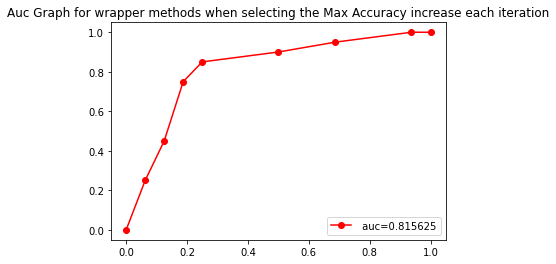

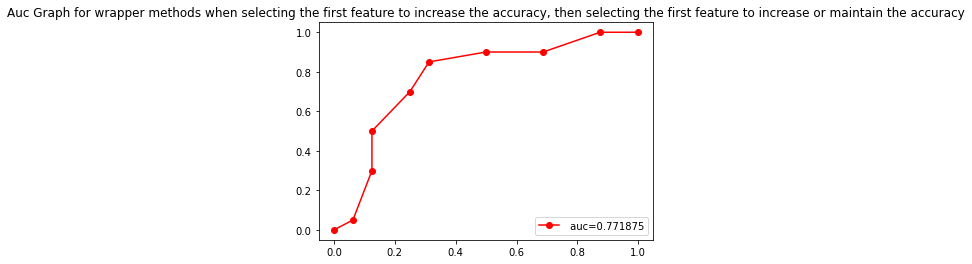

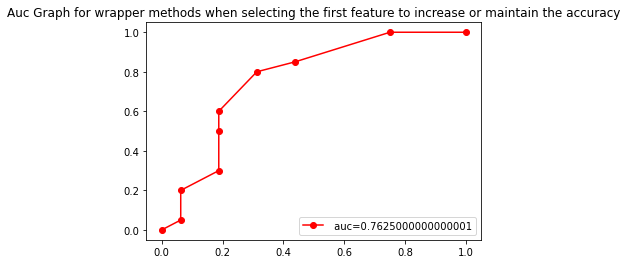

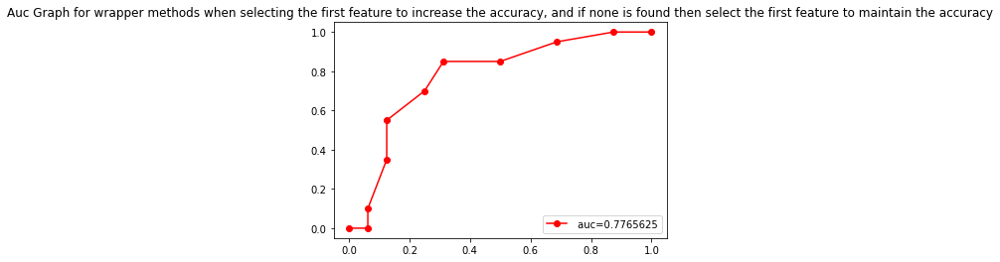

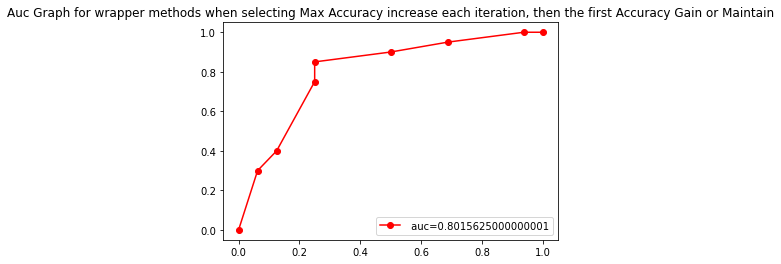

In [33]:
Display_Roc_Auc(data_max, "Auc Graph for wrapper methods when selecting the Max Accuracy increase each iteration", n_n)
Display_Roc_Auc(data_greater_data_equal, "Auc Graph for wrapper methods when selecting the first feature to increase the accuracy, then selecting the first feature to increase or maintain the accuracy", n_n)
Display_Roc_Auc(data_equal, "Auc Graph for wrapper methods when selecting the first feature to increase or maintain the accuracy", n_n)
Display_Roc_Auc(data_greater_equal, "Auc Graph for wrapper methods when selecting the first feature to increase the accuracy, and if none is found then select the first feature to maintain the accuracy", n_n)
Display_Roc_Auc(data_max_then_equal, "Auc Graph for wrapper methods when selecting Max Accuracy increase each iteration, then the first Accuracy Gain or Maintain", n_n)

In [38]:
from sklearn.metrics import confusion_matrix

def Get_Acc_Loss(data):
    X_train, X_test, y_train, y_test = train_test_split(data,y,test_size=0.20, random_state=123)
    reg= KNeighborsClassifier(n_n)
    clf1 = reg.fit(X_train, y_train)
    y_pred1 = clf1.predict(X_test)
    y_pred_proba1 = clf1.predict_proba(X_test)[:,1]
    X_train1 = data
    
    cm = confusion_matrix(y_test, y_pred1)
    print("confusion matrix")
    print(cm)
    sum = 0
    for i in range(cm.shape[0]):
        sum += cm[i][i]
    
    accuracy = sum/X_test.shape[0]
    print("accuracy",accuracy)
    loss = []
    for train_index, test_index in c_v.split(X_train1): # 2nd for loop for cross-validation
        X_train_cv, X_test_cv = X_train1[train_index], X_train1[test_index]
        t_train_cv, t_test_cv = y[train_index], y[test_index] 
        reg.fit(X_train_cv, t_train_cv) # fit a model on the training data 
        loss.append( np.mean(( t_test_cv - reg.predict(X_test_cv) )**2  ) )
        
    print("loss across folds",loss) # print loss across fold
    print("mean loss",np.mean(loss)) # print average loss these number of Folds
    

In [52]:
start = process_time()
print(X.shape)
cur_data, removed = KNN_Remove_One_Equal_AUC(X, c_v, n_n)
while (removed):
    cur_data, removed = KNN_Remove_One_Equal_AUC(cur_data, c_v, n_n)
end = process_time()

data_equal_auc = cur_data
data_equal_auc_time = end - start
print(data_equal_auc_time)

(180, 432)
Base AUC: 0.8140625, New AUC: 0.8140625 at index 0
Removing feature at index:0
Base AUC: 0.8140625, New AUC: 0.8140625 at index 0
Removing feature at index:0
Base AUC: 0.8140625, New AUC: 0.8140625 at index 0
Removing feature at index:0
Base AUC: 0.8140625, New AUC: 0.8140625 at index 0
Removing feature at index:0
Base AUC: 0.8140625, New AUC: 0.8140625 at index 0
Removing feature at index:0
Base AUC: 0.8140625, New AUC: 0.8140625 at index 0
Removing feature at index:0
Base AUC: 0.8140625, New AUC: 0.8046875 at index 0
Base AUC: 0.8140625, New AUC: 0.8046875 at index 1
Base AUC: 0.8140625, New AUC: 0.8046875 at index 2
Base AUC: 0.8140625, New AUC: 0.8046875 at index 3
Base AUC: 0.8140625, New AUC: 0.8140625 at index 4
Removing feature at index:4
Base AUC: 0.8140625, New AUC: 0.8046875 at index 0
Base AUC: 0.8140625, New AUC: 0.8046875 at index 1
Base AUC: 0.8140625, New AUC: 0.8046875 at index 2
Base AUC: 0.8140625, New AUC: 0.8046875 at index 3
Base AUC: 0.8140625, New AUC

Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 10
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 11
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 12
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 13
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 14
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 15
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 16
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 17
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 18
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 19
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 20
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 21
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 22
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 23
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 24
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 25
Base AUC: 0.817

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 48
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 49
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 50
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 51
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 52
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 53
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 54
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 55
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 56
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 57
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 58
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 59
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 60
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 61
Base AUC: 0.8171875000000001, New AUC: 0.8171875000000001 at index 62
Removing feature at index:62
Base AUC: 0.8171875000000001, New AUC: 0.804687

Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 1
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 2
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 3
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 4
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 5
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 6
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 7
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 8
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 9
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 10
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 11
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 12
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 13
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 14
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 15
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 16
Base AUC: 0.8171875000000001, New

Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 18
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 19
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 20
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 21
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 22
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 23
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 24
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 25
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 26
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 27
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 28
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 29
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 30
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 31
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 32
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 33
Base AUC: 0.817187500000

Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 21
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 22
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 23
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 24
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 25
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 26
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 27
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 28
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 29
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 30
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 31
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 32
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 33
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 34
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 35
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 36
Base AUC: 0.817187500000

Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 19
Base AUC: 0.8171875000000001, New AUC: 0.8109375 at index 20
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 21
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 22
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 23
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 24
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 25
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 26
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 27
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 28
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 29
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 30
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 31
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 32
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 33
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 34
Base AUC: 0.817

Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 45
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 46
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 47
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 48
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 49
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 50
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 51
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 52
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 53
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 54
Base AUC: 0.8171875000000001, New AUC: 0.8171875000000001 at index 55
Removing feature at index:55
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 0
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 1
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 2
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 3
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at

Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 27
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 28
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 29
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 30
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 31
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 32
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 33
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 34
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 35
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 36
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 37
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 38
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 39
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 40
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 41
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 46
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 47
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 48
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 49
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 50
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 51
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 52
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 53
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 54
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 55
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 56
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 57
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 58
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 59
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 60
Base AUC: 0.8171875000000001, New AUC: 0.8171875000000001 at index 61
Removing featur

Base AUC: 0.8171875000000001, New AUC: 0.8171875000000001 at index 60
Removing feature at index:60
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 0
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 1
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 2
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 3
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 4
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 5
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 6
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 7
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 8
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 9
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 10
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 11
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 12
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 13
Base AUC: 0.8171875000000001, New AUC: 

Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 11
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 12
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 13
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 14
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 15
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 16
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 17
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 18
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 19
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 20
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 21
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 22
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 23
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 24
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 25
Base AUC: 0.8171875000000001, New AUC: 0

Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 22
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 23
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 24
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 25
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 26
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 27
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 28
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 29
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 30
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 31
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 32
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 33
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 34
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 35
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 36
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 37
Base A

Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 35
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 36
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 37
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 38
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 39
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 40
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 41
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 42
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 43
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 44
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 45
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 46
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 47
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 48
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 49
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 

Base AUC: 0.8171875000000001, New AUC: 0.8109375 at index 53
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 54
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 55
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 56
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 57
Base AUC: 0.8171875000000001, New AUC: 0.8171875000000001 at index 58
Removing feature at index:58
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 0
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 1
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 2
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 3
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 4
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 5
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 6
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 7
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 8
Base AUC: 0.8171875000000001, New AUC: 0.801562500000000

Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 16
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 17
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 18
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 19
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 20
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 21
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 22
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 23
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 24
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 25
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 26
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 27
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 28
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 29
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 30
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 41
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 42
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 43
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 44
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 45
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 46
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 47
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 48
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 49
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 50
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 51
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 52
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 53
Base AUC: 0.8171875000000001, New AUC: 0.8171875000000001 at index 54
Removing feature at index:54
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 0
Base AUC: 0.8171875000000001, New AUC: 0.8046875

Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 10
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 11
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 12
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 13
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 14
Base AUC: 0.8171875000000001, New AUC: 0.8109375 at index 15
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 16
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 17
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 18
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 19
Base AUC: 0.8171875000000001, New AUC: 0.8109375 at index 20
Base AUC: 0.8171875000000001, New AUC: 0.8015625000000001 at index 21
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 22
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 23
Base AUC: 0.8171875000000001, New AUC: 0.8140625 at index 24
Base AUC: 0.8171875000000001, New AUC: 0.8046875 

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 7
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 8
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 9
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 10
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 11
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 12
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 13
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 14
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 15
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 16
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 17
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 18
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 19
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 20
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 21
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 22
Base AUC: 0.817187500000000

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 42
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 43
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 44
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 45
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 46
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 47
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 48
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 49
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 50
Base AUC: 0.8171875000000001, New AUC: 0.8171875000000001 at index 51
Removing feature at index:51
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 0
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 1
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 2
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 3
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 4
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at 

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 34
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 35
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 36
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 37
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 38
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 39
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 40
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 41
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 42
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 43
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 44
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 45
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 46
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 47
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 48
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 49
Base AUC: 0.817187500000

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 28
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 29
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 30
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 31
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 32
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 33
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 34
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 35
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 36
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 37
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 38
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 39
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 40
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 41
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 42
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 43
Base AUC: 0.817187500000

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 2
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 3
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 4
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 5
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 6
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 7
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 8
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 9
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 10
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 11
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 12
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 13
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 14
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 15
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 16
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 17
Base AUC: 0.8171875000000001, Ne

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 1
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 2
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 3
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 4
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 5
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 6
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 7
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 8
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 9
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 10
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 11
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 12
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 13
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 14
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 15
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 16
Base AUC: 0.8171875000000001, New

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 1
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 2
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 3
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 4
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 5
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 6
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 7
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 8
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 9
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 10
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 11
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 12
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 13
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 14
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 15
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 16
Base AUC: 0.8171875000000001, New

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 1
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 2
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 3
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 4
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 5
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 6
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 7
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 8
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 9
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 10
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 11
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 12
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 13
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 14
Base AUC: 0.8171875000000001, New AUC: 0.8046875 at index 15
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 16
Base AUC: 0.8171875000000001, New

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 36
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 37
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 38
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 39
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 40
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 41
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 42
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 43
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 44
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 45
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 46
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 47
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 48
Base AUC: 0.8171875000000001, New AUC: 0.8171875000000001 at index 49
Removing feature at index:49
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 0
Base AUC: 0.8171875000000001, New AUC: 0.8078125

Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 31
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 32
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 33
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 34
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 35
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 36
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 37
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 38
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 39
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 40
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 41
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 42
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 43
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 44
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 45
Base AUC: 0.8171875000000001, New AUC: 0.8078125 at index 46
Base AUC: 0.817187500000

Base AUC: 0.81875, New AUC: 0.81875 at index 0
Removing feature at index:0
Base AUC: 0.81875, New AUC: 0.81875 at index 0
Removing feature at index:0
Base AUC: 0.81875, New AUC: 0.821875 at index 0
Removing feature at index:0
Base AUC: 0.821875, New AUC: 0.8078125 at index 0
Base AUC: 0.821875, New AUC: 0.8046875 at index 1
Base AUC: 0.821875, New AUC: 0.8078125 at index 2
Base AUC: 0.821875, New AUC: 0.8078125 at index 3
Base AUC: 0.821875, New AUC: 0.8078125 at index 4
Base AUC: 0.821875, New AUC: 0.8046875 at index 5
Base AUC: 0.821875, New AUC: 0.8078125 at index 6
Base AUC: 0.821875, New AUC: 0.8078125 at index 7
Base AUC: 0.821875, New AUC: 0.8078125 at index 8
Base AUC: 0.821875, New AUC: 0.8078124999999999 at index 9
Base AUC: 0.821875, New AUC: 0.8078125 at index 10
Base AUC: 0.821875, New AUC: 0.8109375 at index 11
Base AUC: 0.821875, New AUC: 0.821875 at index 12
Removing feature at index:12
Base AUC: 0.821875, New AUC: 0.8078125 at index 0
Base AUC: 0.821875, New AUC: 0.804

Base AUC: 0.821875, New AUC: 0.8078125 at index 4
Base AUC: 0.821875, New AUC: 0.7953125 at index 5
Base AUC: 0.821875, New AUC: 0.7953125 at index 6
Base AUC: 0.821875, New AUC: 0.7984375 at index 7
Base AUC: 0.821875, New AUC: 0.8078125 at index 8
Base AUC: 0.821875, New AUC: 0.7953125 at index 9
Base AUC: 0.821875, New AUC: 0.8015625000000001 at index 10
Base AUC: 0.821875, New AUC: 0.8125 at index 11
Base AUC: 0.821875, New AUC: 0.8125 at index 12
Base AUC: 0.821875, New AUC: 0.8125 at index 13
Base AUC: 0.821875, New AUC: 0.8125 at index 14
Base AUC: 0.821875, New AUC: 0.821875 at index 15
Removing feature at index:15
Base AUC: 0.821875, New AUC: 0.7984375 at index 0
Base AUC: 0.821875, New AUC: 0.7953125 at index 1
Base AUC: 0.821875, New AUC: 0.7984375 at index 2
Base AUC: 0.821875, New AUC: 0.8078125 at index 3
Base AUC: 0.821875, New AUC: 0.8078125 at index 4
Base AUC: 0.821875, New AUC: 0.7953125 at index 5
Base AUC: 0.821875, New AUC: 0.7953125 at index 6
Base AUC: 0.821875,

Base AUC: 0.821875, New AUC: 0.8078125 at index 41
Base AUC: 0.821875, New AUC: 0.8046875 at index 42
Base AUC: 0.821875, New AUC: 0.7984375 at index 43
Base AUC: 0.821875, New AUC: 0.7984375 at index 44
Base AUC: 0.821875, New AUC: 0.7984375 at index 45
Base AUC: 0.821875, New AUC: 0.7984375 at index 46
Base AUC: 0.821875, New AUC: 0.8078125 at index 47
Base AUC: 0.821875, New AUC: 0.7984375 at index 48
Base AUC: 0.821875, New AUC: 0.7984375 at index 49
Base AUC: 0.821875, New AUC: 0.8078125 at index 50
Base AUC: 0.821875, New AUC: 0.8078125 at index 51
Base AUC: 0.821875, New AUC: 0.8078125 at index 52
Base AUC: 0.821875, New AUC: 0.8078125 at index 53
Base AUC: 0.821875, New AUC: 0.8078125 at index 54
Base AUC: 0.821875, New AUC: 0.7953125 at index 55
Base AUC: 0.821875, New AUC: 0.7953125 at index 56
Base AUC: 0.821875, New AUC: 0.7984375 at index 57
Base AUC: 0.821875, New AUC: 0.7984375 at index 58
Base AUC: 0.821875, New AUC: 0.7984375 at index 59
Base AUC: 0.821875, New AUC: 0.

Base AUC: 0.821875, New AUC: 0.8046875 at index 42
Base AUC: 0.821875, New AUC: 0.7984375 at index 43
Base AUC: 0.821875, New AUC: 0.7984375 at index 44
Base AUC: 0.821875, New AUC: 0.7984375 at index 45
Base AUC: 0.821875, New AUC: 0.7984375 at index 46
Base AUC: 0.821875, New AUC: 0.8078125 at index 47
Base AUC: 0.821875, New AUC: 0.7984375 at index 48
Base AUC: 0.821875, New AUC: 0.7984375 at index 49
Base AUC: 0.821875, New AUC: 0.7984375 at index 50
Base AUC: 0.821875, New AUC: 0.8078125 at index 51
Base AUC: 0.821875, New AUC: 0.8078125 at index 52
Base AUC: 0.821875, New AUC: 0.8078125 at index 53
Base AUC: 0.821875, New AUC: 0.7984375 at index 54
Base AUC: 0.821875, New AUC: 0.7953125 at index 55
Base AUC: 0.821875, New AUC: 0.7953125 at index 56
Base AUC: 0.821875, New AUC: 0.7984375 at index 57
Base AUC: 0.821875, New AUC: 0.7984375 at index 58
Base AUC: 0.821875, New AUC: 0.7984375 at index 59
Base AUC: 0.821875, New AUC: 0.8078125 at index 60
Base AUC: 0.821875, New AUC: 0.

Base AUC: 0.821875, New AUC: 0.7984375 at index 36
Base AUC: 0.821875, New AUC: 0.7984375 at index 37
Base AUC: 0.821875, New AUC: 0.7984375 at index 38
Base AUC: 0.821875, New AUC: 0.7984375 at index 39
Base AUC: 0.821875, New AUC: 0.7984375 at index 40
Base AUC: 0.821875, New AUC: 0.8078125 at index 41
Base AUC: 0.821875, New AUC: 0.8046875 at index 42
Base AUC: 0.821875, New AUC: 0.7953125 at index 43
Base AUC: 0.821875, New AUC: 0.7984375 at index 44
Base AUC: 0.821875, New AUC: 0.7984375 at index 45
Base AUC: 0.821875, New AUC: 0.7984375 at index 46
Base AUC: 0.821875, New AUC: 0.8078125 at index 47
Base AUC: 0.821875, New AUC: 0.7953125 at index 48
Base AUC: 0.821875, New AUC: 0.7984375 at index 49
Base AUC: 0.821875, New AUC: 0.8046875 at index 50
Base AUC: 0.821875, New AUC: 0.8046875 at index 51
Base AUC: 0.821875, New AUC: 0.8078125 at index 52
Base AUC: 0.821875, New AUC: 0.8078125 at index 53
Base AUC: 0.821875, New AUC: 0.8078125 at index 54
Base AUC: 0.821875, New AUC: 0.

Base AUC: 0.821875, New AUC: 0.8015625 at index 107
Base AUC: 0.821875, New AUC: 0.8015625 at index 108
Base AUC: 0.821875, New AUC: 0.7875 at index 109
Base AUC: 0.821875, New AUC: 0.8125 at index 110
Base AUC: 0.821875, New AUC: 0.8125 at index 111
Base AUC: 0.821875, New AUC: 0.7875 at index 112
Base AUC: 0.821875, New AUC: 0.8109375 at index 113
Base AUC: 0.821875, New AUC: 0.8015625 at index 114
Base AUC: 0.821875, New AUC: 0.8015625 at index 115
Base AUC: 0.821875, New AUC: 0.8109375 at index 116
Base AUC: 0.821875, New AUC: 0.8109375 at index 117
Base AUC: 0.821875, New AUC: 0.8015625 at index 118
Base AUC: 0.821875, New AUC: 0.8109375 at index 119
Base AUC: 0.821875, New AUC: 0.8109375 at index 120
Base AUC: 0.821875, New AUC: 0.8109375 at index 121
Base AUC: 0.821875, New AUC: 0.8015625 at index 122
Base AUC: 0.821875, New AUC: 0.821875 at index 123
Removing feature at index:123
Base AUC: 0.821875, New AUC: 0.7984375 at index 0
Base AUC: 0.821875, New AUC: 0.7828124999999999 a

Base AUC: 0.821875, New AUC: 0.7828124999999999 at index 9
Base AUC: 0.821875, New AUC: 0.7859375 at index 10
Base AUC: 0.821875, New AUC: 0.8015625 at index 11
Base AUC: 0.821875, New AUC: 0.8015625 at index 12
Base AUC: 0.821875, New AUC: 0.8015625 at index 13
Base AUC: 0.821875, New AUC: 0.8015625 at index 14
Base AUC: 0.821875, New AUC: 0.8015625 at index 15
Base AUC: 0.821875, New AUC: 0.8015625 at index 16
Base AUC: 0.821875, New AUC: 0.8015625 at index 17
Base AUC: 0.821875, New AUC: 0.8015625 at index 18
Base AUC: 0.821875, New AUC: 0.8015625 at index 19
Base AUC: 0.821875, New AUC: 0.8015625 at index 20
Base AUC: 0.821875, New AUC: 0.8015625 at index 21
Base AUC: 0.821875, New AUC: 0.8015625 at index 22
Base AUC: 0.821875, New AUC: 0.8015625 at index 23
Base AUC: 0.821875, New AUC: 0.7875 at index 24
Base AUC: 0.821875, New AUC: 0.7875 at index 25
Base AUC: 0.821875, New AUC: 0.7984375 at index 26
Base AUC: 0.821875, New AUC: 0.7875 at index 27
Base AUC: 0.821875, New AUC: 0.7

Base AUC: 0.853125, New AUC: 0.8390625 at index 2
Base AUC: 0.853125, New AUC: 0.8296875 at index 3
Base AUC: 0.853125, New AUC: 0.8296875 at index 4
Base AUC: 0.853125, New AUC: 0.8296875 at index 5
Base AUC: 0.853125, New AUC: 0.8296875 at index 6
Base AUC: 0.853125, New AUC: 0.8296875 at index 7
Base AUC: 0.853125, New AUC: 0.8296875 at index 8
Base AUC: 0.853125, New AUC: 0.8296875 at index 9
Base AUC: 0.853125, New AUC: 0.8328125000000001 at index 10
Base AUC: 0.853125, New AUC: 0.853125 at index 11
Removing feature at index:11
Base AUC: 0.853125, New AUC: 0.8296875 at index 0
Base AUC: 0.853125, New AUC: 0.84375 at index 1
Base AUC: 0.853125, New AUC: 0.8390625 at index 2
Base AUC: 0.853125, New AUC: 0.8296875 at index 3
Base AUC: 0.853125, New AUC: 0.8296875 at index 4
Base AUC: 0.853125, New AUC: 0.8296875 at index 5
Base AUC: 0.853125, New AUC: 0.8296875 at index 6
Base AUC: 0.853125, New AUC: 0.8296875 at index 7
Base AUC: 0.853125, New AUC: 0.8296875 at index 8
Base AUC: 0.8

Base AUC: 0.853125, New AUC: 0.8296875 at index 60
Base AUC: 0.853125, New AUC: 0.8171875 at index 61
Base AUC: 0.853125, New AUC: 0.8171875 at index 62
Base AUC: 0.853125, New AUC: 0.8171875 at index 63
Base AUC: 0.853125, New AUC: 0.8296875 at index 64
Base AUC: 0.853125, New AUC: 0.8406250000000001 at index 65
Base AUC: 0.853125, New AUC: 0.8265625 at index 66
Base AUC: 0.853125, New AUC: 0.8265625 at index 67
Base AUC: 0.853125, New AUC: 0.8406250000000001 at index 68
Base AUC: 0.853125, New AUC: 0.8390625 at index 69
Base AUC: 0.853125, New AUC: 0.8265625 at index 70
Base AUC: 0.853125, New AUC: 0.83125 at index 71
Base AUC: 0.853125, New AUC: 0.83125 at index 72
Base AUC: 0.853125, New AUC: 0.853125 at index 73
Removing feature at index:73
Base AUC: 0.853125, New AUC: 0.8171875 at index 0
Base AUC: 0.853125, New AUC: 0.8046875 at index 1
Base AUC: 0.853125, New AUC: 0.8296875 at index 2
Base AUC: 0.853125, New AUC: 0.8171875 at index 3
Base AUC: 0.853125, New AUC: 0.8171875 at in

Base AUC: 0.853125, New AUC: 0.8265625 at index 72
Base AUC: 0.853125, New AUC: 0.8265625 at index 73
Base AUC: 0.853125, New AUC: 0.8265625 at index 74
Base AUC: 0.853125, New AUC: 0.8265625 at index 75
Base AUC: 0.853125, New AUC: 0.8265625 at index 76
Base AUC: 0.853125, New AUC: 0.8140625 at index 77
Base AUC: 0.853125, New AUC: 0.8140625 at index 78
Base AUC: 0.853125, New AUC: 0.8265625 at index 79
Base AUC: 0.853125, New AUC: 0.8265625 at index 80
Base AUC: 0.853125, New AUC: 0.8265625 at index 81
Base AUC: 0.853125, New AUC: 0.8140625 at index 82
Base AUC: 0.853125, New AUC: 0.8265625 at index 83
Base AUC: 0.853125, New AUC: 0.8390625 at index 84
Base AUC: 0.853125, New AUC: 0.8265625 at index 85
Base AUC: 0.853125, New AUC: 0.8265625 at index 86
Base AUC: 0.853125, New AUC: 0.8265625 at index 87
Base AUC: 0.853125, New AUC: 0.8265625 at index 88
Base AUC: 0.853125, New AUC: 0.8140625 at index 89
Base AUC: 0.853125, New AUC: 0.8406250000000001 at index 90
Base AUC: 0.853125, Ne

Base AUC: 0.853125, New AUC: 0.8296875 at index 25
Base AUC: 0.853125, New AUC: 0.8171875 at index 26
Base AUC: 0.853125, New AUC: 0.8171875 at index 27
Base AUC: 0.853125, New AUC: 0.8171875 at index 28
Base AUC: 0.853125, New AUC: 0.853125 at index 29
Removing feature at index:29
Base AUC: 0.853125, New AUC: 0.8046875 at index 0
Base AUC: 0.853125, New AUC: 0.8046875 at index 1
Base AUC: 0.853125, New AUC: 0.8171875 at index 2
Base AUC: 0.853125, New AUC: 0.8171875 at index 3
Base AUC: 0.853125, New AUC: 0.8171875 at index 4
Base AUC: 0.853125, New AUC: 0.8171875 at index 5
Base AUC: 0.853125, New AUC: 0.8171875 at index 6
Base AUC: 0.853125, New AUC: 0.8171875 at index 7
Base AUC: 0.853125, New AUC: 0.8171875 at index 8
Base AUC: 0.853125, New AUC: 0.8171875 at index 9
Base AUC: 0.853125, New AUC: 0.8203125 at index 10
Base AUC: 0.853125, New AUC: 0.81875 at index 11
Base AUC: 0.853125, New AUC: 0.81875 at index 12
Base AUC: 0.853125, New AUC: 0.81875 at index 13
Base AUC: 0.853125,

Base AUC: 0.853125, New AUC: 0.81875 at index 12
Base AUC: 0.853125, New AUC: 0.81875 at index 13
Base AUC: 0.853125, New AUC: 0.81875 at index 14
Base AUC: 0.853125, New AUC: 0.81875 at index 15
Base AUC: 0.853125, New AUC: 0.81875 at index 16
Base AUC: 0.853125, New AUC: 0.81875 at index 17
Base AUC: 0.853125, New AUC: 0.81875 at index 18
Base AUC: 0.853125, New AUC: 0.8140625 at index 19
Base AUC: 0.853125, New AUC: 0.8140625 at index 20
Base AUC: 0.853125, New AUC: 0.8171875 at index 21
Base AUC: 0.853125, New AUC: 0.8171875 at index 22
Base AUC: 0.853125, New AUC: 0.8171875 at index 23
Base AUC: 0.853125, New AUC: 0.8171875 at index 24
Base AUC: 0.853125, New AUC: 0.8171875 at index 25
Base AUC: 0.853125, New AUC: 0.8171875 at index 26
Base AUC: 0.853125, New AUC: 0.8171875 at index 27
Base AUC: 0.853125, New AUC: 0.8171875 at index 28
Base AUC: 0.853125, New AUC: 0.8171875 at index 29
Base AUC: 0.853125, New AUC: 0.8046875 at index 30
Base AUC: 0.853125, New AUC: 0.8140625 at ind

Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 1
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 2
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 3
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 4
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 5
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 6
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 7
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 8
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 9
Base AUC: 0.8546874999999999, New AUC: 0.8546874999999999 at index 10
Removing feature at index:10
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 0
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 1
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 2
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 3
Base

Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 28
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 29
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 30
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 31
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 32
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 33
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 34
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 35
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 36
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 37
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 38
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 39
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 40
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 41
Base AUC: 0.8546874999999999, New AUC: 0.81875 at index 42
B

Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 9
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 10
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 11
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 12
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 13
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 14
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 15
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 16
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 17
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 18
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 19
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 20
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 21
Base AUC: 0.8546874999999999, New AUC: 0.83125 at index 22
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 23
Base AUC: 0.

Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 54
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 55
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 56
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 57
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 58
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 59
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 60
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 61
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 62
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 63
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 64
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 65
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 66
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 67
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 68
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 69
Base AUC: 0.8546874999999999, New AUC: 0

Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 19
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 20
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 21
Base AUC: 0.8546874999999999, New AUC: 0.83125 at index 22
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 23
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 24
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 25
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 26
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 27
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 28
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 29
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 30
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 31
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 32
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 33
Base AUC: 0

Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 59
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 60
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 61
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 62
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 63
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 64
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 65
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 66
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 67
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 68
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 69
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 70
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 71
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 72
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 73
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 74
Base AUC: 0.8546874999999999, 

Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 55
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 56
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 57
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 58
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 59
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 60
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 61
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 62
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 63
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 64
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 65
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 66
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 67
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 68
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 69
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 70
Base AUC: 0.8546874999999999, New AUC: 0

Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 41
Base AUC: 0.8546874999999999, New AUC: 0.81875 at index 42
Base AUC: 0.8546874999999999, New AUC: 0.83125 at index 43
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 44
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 45
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 46
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 47
Base AUC: 0.8546874999999999, New AUC: 0.81875 at index 48
Base AUC: 0.8546874999999999, New AUC: 0.83125 at index 49
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 50
Base AUC: 0.8546874999999999, New AUC: 0.81875 at index 51
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 52
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 53
Base AUC: 0.8546874999999999, New AUC: 0.8421875 at index 54
Base AUC: 0.8546874999999999, New AUC: 0.8421875 at index 55
Base AUC: 0.8546874999999999, New AUC: 0.8421875 at index 56
Ba

Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 27
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 28
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 29
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 30
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 31
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 32
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 33
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 34
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 35
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 36
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 37
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 38
Base AUC: 0.8546874999999999, New AUC: 0.8406250000000001 at index 39
Base AUC: 0.8546874999999999, New AUC: 0.828125 at index 40
Base AUC: 0.8546874999999999, New AUC: 0.828125 at

Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 77
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 78
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 79
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 80
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 81
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 82
Base AUC: 0.8578125000000001, New AUC: 0.8453125 at index 83
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 84
Base AUC: 0.8578125000000001, New AUC: 0.8578125000000001 at index 85
Removing feature at index:85
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 0
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 1
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 2
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 3
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 4
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 5
Base AUC: 0.857812500000

Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 51
Base AUC: 0.8578125000000001, New AUC: 0.8578125000000001 at index 52
Removing feature at index:52
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 0
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 1
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 2
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 3
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 4
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 5
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 6
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 7
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 8
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 9
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 10
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 11
Base AUC: 0.8578125000000001, New AUC: 0.834

Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 9
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 10
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 11
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 12
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 13
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 14
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 15
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 16
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 17
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 18
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 19
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 20
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 21
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 22
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 23
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 24
Base AUC: 0.8578125000000001, New A

Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 60
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 61
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 62
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 63
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 64
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 65
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 66
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 67
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 68
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 69
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 70
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 71
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 72
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 73
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 74
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 75
Base AUC: 0.

Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 23
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 24
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 25
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 26
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 27
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 28
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 29
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 30
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 31
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 32
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 33
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 34
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 35
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 36
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 37
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 38
Base AUC: 0.85781250000

Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 71
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 72
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 73
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 74
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 75
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 76
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 77
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 78
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 79
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 80
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 81
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 82
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 83
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 84
Base AUC: 0.8578125000000001, New AUC: 0.8578125000000001 at index 85
Removing feature at index:85
Base AUC: 0.8578125000000001, New AUC: 0.83125 at 

Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 47
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 48
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 49
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 50
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 51
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 52
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 53
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 54
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 55
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 56
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 57
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 58
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 59
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 60
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 61
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 62
Base AUC: 0.8

Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 12
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 13
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 14
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 15
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 16
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 17
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 18
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 19
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 20
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 21
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 22
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 23
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 24
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 25
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 26
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 27
Base AUC: 0.8578125000000001, New 

Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 68
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 69
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 70
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 71
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 72
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 73
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 74
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 75
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 76
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 77
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 78
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 79
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 80
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 81
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 82
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 83
Base A

Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 36
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 37
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 38
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 39
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 40
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 41
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 42
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 43
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 44
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 45
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 46
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 47
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 48
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 49
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 50
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 51
B

Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 6
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 7
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 8
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 9
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 10
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 11
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 12
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 13
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 14
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 15
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 16
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 17
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 18
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 19
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 20
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 21
Base AUC: 0.857812500000000

Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 61
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 62
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 63
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 64
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 65
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 66
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 67
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 68
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 69
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 70
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 71
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 72
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 73
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 74
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 75
Base AUC: 0.8578125000000001, Ne

Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 27
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 28
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 29
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 30
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 31
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 32
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 33
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 34
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 35
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 36
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 37
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 38
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 39
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 40
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 41
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 42
Base AUC: 0.

Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 79
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 80
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 81
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 82
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 83
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 84
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 85
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 86
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 87
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 88
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 89
Base AUC: 0.8578125000000001, New AUC: 0.8578125000000001 at index 90
Removing feature at index:90
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 0
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 1
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 2
Base AU

Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 19
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 20
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 21
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 22
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 23
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 24
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 25
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 26
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 27
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 28
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 29
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 30
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 31
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 32
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 33
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 34
B

Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 62
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 63
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 64
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 65
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 66
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 67
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 68
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 69
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 70
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 71
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 72
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 73
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 74
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 75
Base AUC: 0.8578125000000001, New AUC: 0.8484375 at index 76
Base AUC: 0.8578125000000001, N

Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 19
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 20
Base AUC: 0.8578125000000001, New AUC: 0.8578125000000001 at index 21
Removing feature at index:21
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 0
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 1
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 2
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 3
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 4
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 5
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 6
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 7
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 8
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 9
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 10
Base AUC: 0.8578125000000001, New AUC: 0.8343

Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 9
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 10
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 11
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 12
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 13
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 14
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 15
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 16
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 17
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 18
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 19
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 20
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 21
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 22
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 23
Base AUC: 0.8578125000000001

Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 15
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 16
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 17
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 18
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 19
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 20
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 21
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 22
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 23
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 24
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 25
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 26
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 27
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 28
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 29
Base AUC: 0.8578125000000001, New AUC

Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 0
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 1
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 2
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 3
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 4
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 5
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 6
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 7
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 8
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 9
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 10
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 11
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 12
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 13
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 14
Bas

Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 68
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 69
Base AUC: 0.8578125000000001, New AUC: 0.8453125 at index 70
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 71
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 72
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 73
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 74
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 75
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 76
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 77
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 78
Base AUC: 0.8578125000000001, New AUC: 0.8578125000000001 at index 79
Removing feature at index:79
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 0
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 1
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 2
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at ind

Base AUC: 0.8578125000000001, New AUC: 0.8453125 at index 72
Base AUC: 0.8578125000000001, New AUC: 0.8453125 at index 73
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 74
Base AUC: 0.8578125000000001, New AUC: 0.8578125000000001 at index 75
Removing feature at index:75
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 0
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 1
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 2
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 3
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 4
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 5
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 6
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 7
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 8
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 9
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 10
Bas

Base AUC: 0.8578125000000001, New AUC: 0.8578125000000001 at index 60
Removing feature at index:60
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 0
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 1
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 2
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 3
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 4
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 5
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 6
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 7
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 8
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 9
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 10
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 11
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 12
Base AUC: 0.8578125000000001, New AUC: 0.834

Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 54
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 55
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 56
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 57
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 58
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 59
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 60
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 61
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 62
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 63
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 64
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 65
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 66
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 67
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 68
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 69
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index

Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 44
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 45
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 46
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 47
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 48
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 49
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 50
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 51
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 52
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 53
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 54
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 55
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 56
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 57
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 58
Base AUC: 0.8578125000000001, New AUC: 0.84375 a

Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 57
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 58
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 59
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 60
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 61
Base AUC: 0.8578125000000001, New AUC: 0.8453125 at index 62
Base AUC: 0.8578125000000001, New AUC: 0.8453125 at index 63
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 64
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 65
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 66
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 67
Base AUC: 0.8578125000000001, New AUC: 0.8453125 at index 68
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 69
Base AUC: 0.8578125000000001, New AUC: 0.8453125 at index 70
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 71
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 72
Base AUC: 0.8578125000000001, New AUC: 0.843

Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 51
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 52
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 53
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 54
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 55
Base AUC: 0.8578125000000001, New AUC: 0.8453125 at index 56
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 57
Base AUC: 0.8578125000000001, New AUC: 0.84375 at index 58
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 59
Base AUC: 0.8578125000000001, New AUC: 0.83125 at index 60
Base AUC: 0.8578125000000001, New AUC: 0.8359375 at index 61
Base AUC: 0.8578125000000001, New AUC: 0.8453125 at index 62
Base AUC: 0.8578125000000001, New AUC: 0.8578125000000001 at index 63
Removing feature at index:63
Base AUC: 0.8578125000000001, New AUC: 0.821875 at index 0
Base AUC: 0.8578125000000001, New AUC: 0.8343750000000001 at index 1
Base AUC: 0.8578125000000001, New AUC: 0.83437500000

Base AUC: 0.8625, New AUC: 0.853125 at index 2
Base AUC: 0.8625, New AUC: 0.853125 at index 3
Base AUC: 0.8625, New AUC: 0.853125 at index 4
Base AUC: 0.8625, New AUC: 0.853125 at index 5
Base AUC: 0.8625, New AUC: 0.853125 at index 6
Base AUC: 0.8625, New AUC: 0.853125 at index 7
Base AUC: 0.8625, New AUC: 0.853125 at index 8
Base AUC: 0.8625, New AUC: 0.853125 at index 9
Base AUC: 0.8625, New AUC: 0.8625 at index 10
Removing feature at index:10
Base AUC: 0.8625, New AUC: 0.853125 at index 0
Base AUC: 0.8625, New AUC: 0.853125 at index 1
Base AUC: 0.8625, New AUC: 0.8484375 at index 2
Base AUC: 0.8625, New AUC: 0.853125 at index 3
Base AUC: 0.8625, New AUC: 0.853125 at index 4
Base AUC: 0.8625, New AUC: 0.853125 at index 5
Base AUC: 0.8625, New AUC: 0.853125 at index 6
Base AUC: 0.8625, New AUC: 0.853125 at index 7
Base AUC: 0.8625, New AUC: 0.853125 at index 8
Base AUC: 0.8625, New AUC: 0.853125 at index 9
Base AUC: 0.8625, New AUC: 0.853125 at index 10
Base AUC: 0.8625, New AUC: 0.8

Base AUC: 0.8625, New AUC: 0.84375 at index 35
Base AUC: 0.8625, New AUC: 0.8484375000000001 at index 36
Base AUC: 0.8625, New AUC: 0.84375 at index 37
Base AUC: 0.8625, New AUC: 0.8343750000000001 at index 38
Base AUC: 0.8625, New AUC: 0.8484375000000001 at index 39
Base AUC: 0.8625, New AUC: 0.84375 at index 40
Base AUC: 0.8625, New AUC: 0.8390625 at index 41
Base AUC: 0.8625, New AUC: 0.8390625 at index 42
Base AUC: 0.8625, New AUC: 0.8625 at index 43
Removing feature at index:43
Base AUC: 0.8625, New AUC: 0.8484375000000001 at index 0
Base AUC: 0.8625, New AUC: 0.8390625 at index 1
Base AUC: 0.8625, New AUC: 0.8343750000000001 at index 2
Base AUC: 0.8625, New AUC: 0.8484375000000001 at index 3
Base AUC: 0.8625, New AUC: 0.8484375000000001 at index 4
Base AUC: 0.8625, New AUC: 0.8484375000000001 at index 5
Base AUC: 0.8625, New AUC: 0.84375 at index 6
Base AUC: 0.8625, New AUC: 0.8484375000000001 at index 7
Base AUC: 0.8625, New AUC: 0.84375 at index 8
Base AUC: 0.8625, New AUC: 0.8

Base AUC: 0.8625, New AUC: 0.8265625 at index 103
Base AUC: 0.8625, New AUC: 0.8296874999999999 at index 104
Base AUC: 0.8625, New AUC: 0.8640625 at index 105
Removing feature at index:105
Base AUC: 0.8640625, New AUC: 0.8640625 at index 0
Removing feature at index:0
Base AUC: 0.8640625, New AUC: 0.8515625 at index 0
Base AUC: 0.8640625, New AUC: 0.8515625 at index 1
Base AUC: 0.8640625, New AUC: 0.859375 at index 2
Base AUC: 0.8640625, New AUC: 0.859375 at index 3
Base AUC: 0.8640625, New AUC: 0.859375 at index 4
Base AUC: 0.8640625, New AUC: 0.859375 at index 5
Base AUC: 0.8640625, New AUC: 0.859375 at index 6
Base AUC: 0.8640625, New AUC: 0.859375 at index 7
Base AUC: 0.8640625, New AUC: 0.859375 at index 8
Base AUC: 0.8640625, New AUC: 0.859375 at index 9
Base AUC: 0.8640625, New AUC: 0.859375 at index 10
Base AUC: 0.8640625, New AUC: 0.859375 at index 11
Base AUC: 0.8640625, New AUC: 0.8640625 at index 12
Removing feature at index:12
Base AUC: 0.8640625, New AUC: 0.8515625 at inde

Base AUC: 0.8640625, New AUC: 0.8421875 at index 17
Base AUC: 0.8640625, New AUC: 0.8453124999999999 at index 18
Base AUC: 0.8640625, New AUC: 0.8453124999999999 at index 19
Base AUC: 0.8640625, New AUC: 0.8421875 at index 20
Base AUC: 0.8640625, New AUC: 0.8421875 at index 21
Base AUC: 0.8640625, New AUC: 0.8421875 at index 22
Base AUC: 0.8640625, New AUC: 0.8421875 at index 23
Base AUC: 0.8640625, New AUC: 0.8421875 at index 24
Base AUC: 0.8640625, New AUC: 0.8421875 at index 25
Base AUC: 0.8640625, New AUC: 0.8421875 at index 26
Base AUC: 0.8640625, New AUC: 0.8421875 at index 27
Base AUC: 0.8640625, New AUC: 0.8421875 at index 28
Base AUC: 0.8640625, New AUC: 0.8453124999999999 at index 29
Base AUC: 0.8640625, New AUC: 0.8421875 at index 30
Base AUC: 0.8640625, New AUC: 0.8453124999999999 at index 31
Base AUC: 0.8640625, New AUC: 0.8453124999999999 at index 32
Base AUC: 0.8640625, New AUC: 0.8421875 at index 33
Base AUC: 0.8640625, New AUC: 0.8421875 at index 34
Base AUC: 0.8640625

Base AUC: 0.865625, New AUC: 0.84375 at index 0
Base AUC: 0.865625, New AUC: 0.84375 at index 1
Base AUC: 0.865625, New AUC: 0.846875 at index 2
Base AUC: 0.865625, New AUC: 0.846875 at index 3
Base AUC: 0.865625, New AUC: 0.84375 at index 4
Base AUC: 0.865625, New AUC: 0.846875 at index 5
Base AUC: 0.865625, New AUC: 0.84375 at index 6
Base AUC: 0.865625, New AUC: 0.84375 at index 7
Base AUC: 0.865625, New AUC: 0.84375 at index 8
Base AUC: 0.865625, New AUC: 0.84375 at index 9
Base AUC: 0.865625, New AUC: 0.84375 at index 10
Base AUC: 0.865625, New AUC: 0.84375 at index 11
Base AUC: 0.865625, New AUC: 0.8484375 at index 12
Base AUC: 0.865625, New AUC: 0.8515625 at index 13
Base AUC: 0.865625, New AUC: 0.84375 at index 14
Base AUC: 0.865625, New AUC: 0.84375 at index 15
Base AUC: 0.865625, New AUC: 0.8484375 at index 16
Base AUC: 0.865625, New AUC: 0.84375 at index 17
Base AUC: 0.865625, New AUC: 0.84375 at index 18
Base AUC: 0.865625, New AUC: 0.846875 at index 19
Base AUC: 0.865625, 

Base AUC: 0.865625, New AUC: 0.8484375 at index 41
Base AUC: 0.865625, New AUC: 0.8515625 at index 42
Base AUC: 0.865625, New AUC: 0.8515625 at index 43
Base AUC: 0.865625, New AUC: 0.8484375 at index 44
Base AUC: 0.865625, New AUC: 0.8515625 at index 45
Base AUC: 0.865625, New AUC: 0.8515625 at index 46
Base AUC: 0.865625, New AUC: 0.8515625 at index 47
Base AUC: 0.865625, New AUC: 0.8578124999999999 at index 48
Base AUC: 0.865625, New AUC: 0.8578125 at index 49
Base AUC: 0.865625, New AUC: 0.8296875 at index 50
Base AUC: 0.865625, New AUC: 0.8531249999999999 at index 51
Base AUC: 0.865625, New AUC: 0.8390624999999999 at index 52
Base AUC: 0.865625, New AUC: 0.8140625 at index 53
Base AUC: 0.865625, New AUC: 0.83125 at index 54
Base AUC: 0.865625, New AUC: 0.85 at index 55
Base AUC: 0.865625, New AUC: 0.853125 at index 56
Base AUC: 0.865625, New AUC: 0.8453125 at index 57
Base AUC: 0.865625, New AUC: 0.8421875 at index 58
Base AUC: 0.865625, New AUC: 0.84375 at index 59
Base AUC: 0.86

Base AUC: 0.865625, New AUC: 0.84375 at index 29
Base AUC: 0.865625, New AUC: 0.846875 at index 30
Base AUC: 0.865625, New AUC: 0.846875 at index 31
Base AUC: 0.865625, New AUC: 0.84375 at index 32
Base AUC: 0.865625, New AUC: 0.84375 at index 33
Base AUC: 0.865625, New AUC: 0.8484375 at index 34
Base AUC: 0.865625, New AUC: 0.8515625 at index 35
Base AUC: 0.865625, New AUC: 0.8484375 at index 36
Base AUC: 0.865625, New AUC: 0.8484375 at index 37
Base AUC: 0.865625, New AUC: 0.8515625 at index 38
Base AUC: 0.865625, New AUC: 0.8515625 at index 39
Base AUC: 0.865625, New AUC: 0.8515625 at index 40
Base AUC: 0.865625, New AUC: 0.8515625 at index 41
Base AUC: 0.865625, New AUC: 0.8515625 at index 42
Base AUC: 0.865625, New AUC: 0.8515625 at index 43
Base AUC: 0.865625, New AUC: 0.865625 at index 44
Removing feature at index:44
Base AUC: 0.865625, New AUC: 0.84375 at index 0
Base AUC: 0.865625, New AUC: 0.84375 at index 1
Base AUC: 0.865625, New AUC: 0.84375 at index 2
Base AUC: 0.865625, 

Base AUC: 0.8703125, New AUC: 0.8484375 at index 40
Base AUC: 0.8703125, New AUC: 0.8625 at index 41
Base AUC: 0.8703125, New AUC: 0.8562500000000001 at index 42
Base AUC: 0.8703125, New AUC: 0.8625 at index 43
Base AUC: 0.8703125, New AUC: 0.8531249999999999 at index 44
Base AUC: 0.8703125, New AUC: 0.859375 at index 45
Base AUC: 0.8703125, New AUC: 0.84375 at index 46
Base AUC: 0.8703125, New AUC: 0.8484375 at index 47
Base AUC: 0.8703125, New AUC: 0.8546875 at index 48
Base AUC: 0.8703125, New AUC: 0.8499999999999999 at index 49
Base AUC: 0.8703125, New AUC: 0.8515625 at index 50
Base AUC: 0.8703125, New AUC: 0.8531249999999999 at index 51
Base AUC: 0.8703125, New AUC: 0.8515625 at index 52
Base AUC: 0.8703125, New AUC: 0.8328125 at index 53
Base AUC: 0.8703125, New AUC: 0.8109374999999999 at index 54
Base AUC: 0.8703125, New AUC: 0.8374999999999999 at index 55
Base AUC: 0.8703125, New AUC: 0.840625 at index 56
Base AUC: 0.8703125, New AUC: 0.85 at index 57
Base AUC: 0.8703125, New 

Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 30
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 31
Base AUC: 0.8734375000000001, New AUC: 0.8734375000000001 at index 32
Removing feature at index:32
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 0
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 1
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 2
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 3
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 4
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 5
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 6
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 7
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 8
Base AUC: 0.8734375000000001, New AUC: 0.8515625 at index 9
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 10
Base AUC: 

Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 15
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 16
Base AUC: 0.8734375000000001, New AUC: 0.8515625 at index 17
Base AUC: 0.8734375000000001, New AUC: 0.8515625 at index 18
Base AUC: 0.8734375000000001, New AUC: 0.8515625 at index 19
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 20
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 21
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 22
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 23
Base AUC: 0.8734375000000001, New AUC: 0.8515625 at index 24
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 25
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 26
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 27
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 28
Base AUC: 0.8734375000000001, New AUC: 0.859375000000000

Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 19
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 20
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 21
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 22
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 23
Base AUC: 0.8734375000000001, New AUC: 0.8546875 at index 24
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 25
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 26
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 27
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 28
Base AUC: 0.8734375000000001, New AUC: 0.8734375000000001 at index 29
Removing feature at index:29
Base AUC: 0.8734375000000001, New AUC: 0.8546875 at index 0
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 1
Base AUC: 0.8734375000000001, New AUC: 0.8593750000000001 at index 2
Base AUC: 0.

Base AUC: 0.875, New AUC: 0.8546875 at index 37
Base AUC: 0.875, New AUC: 0.809375 at index 38
Base AUC: 0.875, New AUC: 0.84375 at index 39
Base AUC: 0.875, New AUC: 0.853125 at index 40
Base AUC: 0.875, New AUC: 0.825 at index 41
Base AUC: 0.875, New AUC: 0.8125 at index 42
Base AUC: 0.875, New AUC: 0.8375 at index 43
Base AUC: 0.875, New AUC: 0.8328125 at index 44
Base AUC: 0.875, New AUC: 0.8578125 at index 45
Base AUC: 0.875, New AUC: 0.8609374999999999 at index 46
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 47
Base AUC: 0.875, New AUC: 0.796875 at index 48
Base AUC: 0.875, New AUC: 0.8328125 at index 49
Base AUC: 0.875, New AUC: 0.8703124999999999 at index 50
Base AUC: 0.875, New AUC: 0.8484375 at index 51
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 52
Base AUC: 0.875, New AUC: 0.8390624999999999 at index 53
Base AUC: 0.875, New AUC: 0.846875 at index 54
Base AUC: 0.875, New AUC: 0.815625 at index 55
Base AUC: 0.875, New AUC: 0.828125 at index 56
Base AUC: 0.8

Base AUC: 0.875, New AUC: 0.8546874999999999 at index 11
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 12
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 13
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 14
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 15
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 16
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 17
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 18
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 19
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 20
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 21
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 22
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 23
Base AUC: 0.875, New AUC: 0.86875 at index 24
Base AUC: 0.875, New AUC: 0.8265625 at index 25
Base AUC: 0.875, New AUC: 0.8484375 at index 26
Base AUC: 0.875, New AUC: 0.8468749999999999 at index 27
Base AUC: 0.875, New AUC: 0.85625 at index 28
Base AUC: 0.87

Base AUC: 0.875, New AUC: 0.8609374999999999 at index 92
Base AUC: 0.875, New AUC: 0.85 at index 93
Base AUC: 0.875, New AUC: 0.8609375 at index 94
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 95
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 96
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 97
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 98
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 99
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 100
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 101
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 102
Base AUC: 0.875, New AUC: 0.85 at index 103
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 104
Base AUC: 0.875, New AUC: 0.8421875 at index 105
Base AUC: 0.875, New AUC: 0.8374999999999999 at index 106
Base AUC: 0.875, New AUC: 0.8671875 at index 107
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 108
Base AUC: 0.875, New AUC: 0.8484375 at index 109
Base AUC: 0.875, New AUC: 0.

Base AUC: 0.875, New AUC: 0.8546874999999999 at index 14
Base AUC: 0.875, New AUC: 0.8671875 at index 15
Base AUC: 0.875, New AUC: 0.875 at index 16
Removing feature at index:16
Base AUC: 0.875, New AUC: 0.8421875 at index 0
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 1
Base AUC: 0.875, New AUC: 0.846875 at index 2
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 3
Base AUC: 0.875, New AUC: 0.8671875 at index 4
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 5
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 6
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 7
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 8
Base AUC: 0.875, New AUC: 0.846875 at index 9
Base AUC: 0.875, New AUC: 0.8671875 at index 10
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 11
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 12
Base AUC: 0.875, New AUC: 0.8671875 at index 13
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 14
Base AUC: 0.875, New AUC: 0.85468

Base AUC: 0.875, New AUC: 0.865625 at index 36
Base AUC: 0.875, New AUC: 0.8546875 at index 37
Base AUC: 0.875, New AUC: 0.8375 at index 38
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 39
Base AUC: 0.875, New AUC: 0.853125 at index 40
Base AUC: 0.875, New AUC: 0.8625 at index 41
Base AUC: 0.875, New AUC: 0.8203125 at index 42
Base AUC: 0.875, New AUC: 0.8203125 at index 43
Base AUC: 0.875, New AUC: 0.846875 at index 44
Base AUC: 0.875, New AUC: 0.8515624999999999 at index 45
Base AUC: 0.875, New AUC: 0.8499999999999999 at index 46
Base AUC: 0.875, New AUC: 0.8515624999999999 at index 47
Base AUC: 0.875, New AUC: 0.8375 at index 48
Base AUC: 0.875, New AUC: 0.8390625 at index 49
Base AUC: 0.875, New AUC: 0.840625 at index 50
Base AUC: 0.875, New AUC: 0.8515625 at index 51
Base AUC: 0.875, New AUC: 0.8625 at index 52
Base AUC: 0.875, New AUC: 0.8515625000000001 at index 53
Base AUC: 0.875, New AUC: 0.85 at index 54
Base AUC: 0.875, New AUC: 0.846875 at index 55
Base AUC: 0.875, 

Base AUC: 0.875, New AUC: 0.846875 at index 2
Base AUC: 0.875, New AUC: 0.859375 at index 3
Base AUC: 0.875, New AUC: 0.846875 at index 4
Base AUC: 0.875, New AUC: 0.8515625 at index 5
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 6
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 7
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 8
Base AUC: 0.875, New AUC: 0.846875 at index 9
Base AUC: 0.875, New AUC: 0.8671875 at index 10
Base AUC: 0.875, New AUC: 0.840625 at index 11
Base AUC: 0.875, New AUC: 0.8609374999999999 at index 12
Base AUC: 0.875, New AUC: 0.8531249999999999 at index 13
Base AUC: 0.875, New AUC: 0.85625 at index 14
Base AUC: 0.875, New AUC: 0.8624999999999999 at index 15
Base AUC: 0.875, New AUC: 0.8515625 at index 16
Base AUC: 0.875, New AUC: 0.865625 at index 17
Base AUC: 0.875, New AUC: 0.84375 at index 18
Base AUC: 0.875, New AUC: 0.8359375 at index 19
Base AUC: 0.875, New AUC: 0.8343750000000001 at index 20
Base AUC: 0.875, New AUC: 0.8390625 at inde

Base AUC: 0.8796875000000001, New AUC: 0.8609374999999999 at index 57
Base AUC: 0.8796875000000001, New AUC: 0.84375 at index 58
Base AUC: 0.8796875000000001, New AUC: 0.8484375000000001 at index 59
Base AUC: 0.8796875000000001, New AUC: 0.8546875 at index 60
Base AUC: 0.8796875000000001, New AUC: 0.8562500000000001 at index 61
Base AUC: 0.8796875000000001, New AUC: 0.8593750000000001 at index 62
Base AUC: 0.8796875000000001, New AUC: 0.853125 at index 63
Base AUC: 0.8796875000000001, New AUC: 0.840625 at index 64
Base AUC: 0.8796875000000001, New AUC: 0.8703124999999999 at index 65
Base AUC: 0.8796875000000001, New AUC: 0.8703124999999999 at index 66
Base AUC: 0.8796875000000001, New AUC: 0.8578125 at index 67
Base AUC: 0.8796875000000001, New AUC: 0.83125 at index 68
Base AUC: 0.8796875000000001, New AUC: 0.8640625000000001 at index 69
Base AUC: 0.8796875000000001, New AUC: 0.8500000000000001 at index 70
Base AUC: 0.8796875000000001, New AUC: 0.8531249999999999 at index 71
Base AUC: 

Base AUC: 0.8796875000000001, New AUC: 0.853125 at index 88
Base AUC: 0.8796875000000001, New AUC: 0.8671874999999999 at index 89
Base AUC: 0.8796875000000001, New AUC: 0.8671874999999999 at index 90
Base AUC: 0.8796875000000001, New AUC: 0.871875 at index 91
Base AUC: 0.8796875000000001, New AUC: 0.8531250000000001 at index 92
Base AUC: 0.8796875000000001, New AUC: 0.84375 at index 93
Base AUC: 0.8796875000000001, New AUC: 0.859375 at index 94
Base AUC: 0.8796875000000001, New AUC: 0.86875 at index 95
Base AUC: 0.8796875000000001, New AUC: 0.8609375 at index 96
Base AUC: 0.8796875000000001, New AUC: 0.8484375000000001 at index 97
Base AUC: 0.8796875000000001, New AUC: 0.8703124999999999 at index 98
Base AUC: 0.8796875000000001, New AUC: 0.8625 at index 99
Base AUC: 0.8796875000000001, New AUC: 0.8578125 at index 100
Base AUC: 0.8796875000000001, New AUC: 0.859375 at index 101
Base AUC: 0.8796875000000001, New AUC: 0.8781249999999999 at index 102
Base AUC: 0.8796875000000001, New AUC: 

Base AUC: 0.8796875000000001, New AUC: 0.85 at index 16
Base AUC: 0.8796875000000001, New AUC: 0.8328125000000001 at index 17
Base AUC: 0.8796875000000001, New AUC: 0.865625 at index 18
Base AUC: 0.8796875000000001, New AUC: 0.8640625 at index 19
Base AUC: 0.8796875000000001, New AUC: 0.8750000000000001 at index 20
Base AUC: 0.8796875000000001, New AUC: 0.8531249999999999 at index 21
Base AUC: 0.8796875000000001, New AUC: 0.8609375 at index 22
Base AUC: 0.8796875000000001, New AUC: 0.8437499999999999 at index 23
Base AUC: 0.8796875000000001, New AUC: 0.84375 at index 24
Base AUC: 0.8796875000000001, New AUC: 0.8546874999999999 at index 25
Base AUC: 0.8796875000000001, New AUC: 0.84375 at index 26
Base AUC: 0.8796875000000001, New AUC: 0.8468749999999999 at index 27
Base AUC: 0.8796875000000001, New AUC: 0.8718750000000001 at index 28
Base AUC: 0.8796875000000001, New AUC: 0.8593749999999999 at index 29
Base AUC: 0.8796875000000001, New AUC: 0.8546874999999999 at index 30
Base AUC: 0.87

Base AUC: 0.8796875000000001, New AUC: 0.8515624999999999 at index 11
Base AUC: 0.8796875000000001, New AUC: 0.8671875 at index 12
Base AUC: 0.8796875000000001, New AUC: 0.8546874999999999 at index 13
Base AUC: 0.8796875000000001, New AUC: 0.85625 at index 14
Base AUC: 0.8796875000000001, New AUC: 0.840625 at index 15
Base AUC: 0.8796875000000001, New AUC: 0.85 at index 16
Base AUC: 0.8796875000000001, New AUC: 0.85 at index 17
Base AUC: 0.8796875000000001, New AUC: 0.8406250000000001 at index 18
Base AUC: 0.8796875000000001, New AUC: 0.83125 at index 19
Base AUC: 0.8796875000000001, New AUC: 0.875 at index 20
Base AUC: 0.8796875000000001, New AUC: 0.8546875 at index 21
Base AUC: 0.8796875000000001, New AUC: 0.8609375 at index 22
Base AUC: 0.8796875000000001, New AUC: 0.8453125 at index 23
Base AUC: 0.8796875000000001, New AUC: 0.84375 at index 24
Base AUC: 0.8796875000000001, New AUC: 0.8546874999999999 at index 25
Base AUC: 0.8796875000000001, New AUC: 0.8515625 at index 26
Base AUC:

confusion matrix
[[15  1]
 [10 10]]
accuracy 0.6944444444444444
loss across folds [0.3333333333333333, 0.3888888888888889, 0.2222222222222222, 0.3888888888888889, 0.2222222222222222, 0.2222222222222222, 0.3333333333333333, 0.2777777777777778, 0.5, 0.6111111111111112]
mean loss 0.35000000000000003


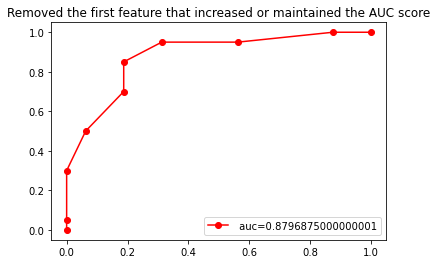

In [55]:
Get_Acc_Loss(data_equal_auc)
Display_Roc_Auc(data_equal_auc, "Removed the first feature that increased or maintained the AUC score", n_n)

In [59]:
start = process_time()
cur_data, removed = KNN_Remove_One_Greater_AUC(X, c_v, n_n)
while (removed):
    cur_data, removed = KNN_Remove_One_Greater_AUC(cur_data, c_v, n_n)
    
cur_data, removed = KNN_Remove_One_Equal_AUC(cur_data, c_v, n_n)
while (removed):
    cur_data, removed = KNN_Remove_One_Equal_AUC(cur_data, c_v, n_n)
end = process_time()

data_greater_then_equal_auc = cur_data
data_greater_then_equal_auc_time = end - start
print(data_equal_auc_time)

Base AUC: 0.8140625, New AUC: 0.8140625 at index 0
Base AUC: 0.8140625, New AUC: 0.8140625 at index 1
Base AUC: 0.8140625, New AUC: 0.8140625 at index 2
Base AUC: 0.8140625, New AUC: 0.8140625 at index 3
Base AUC: 0.8140625, New AUC: 0.8140625 at index 4
Base AUC: 0.8140625, New AUC: 0.8140625 at index 5
Base AUC: 0.8140625, New AUC: 0.8140625 at index 6
Base AUC: 0.8140625, New AUC: 0.8140625 at index 7
Base AUC: 0.8140625, New AUC: 0.8140625 at index 8
Base AUC: 0.8140625, New AUC: 0.8140625 at index 9
Base AUC: 0.8140625, New AUC: 0.8140625 at index 10
Base AUC: 0.8140625, New AUC: 0.8140625 at index 11
Base AUC: 0.8140625, New AUC: 0.8140625 at index 12
Base AUC: 0.8140625, New AUC: 0.8140625 at index 13
Base AUC: 0.8140625, New AUC: 0.8140625 at index 14
Base AUC: 0.8140625, New AUC: 0.8140625 at index 15
Base AUC: 0.8140625, New AUC: 0.8140625 at index 16
Base AUC: 0.8140625, New AUC: 0.8140625 at index 17
Base AUC: 0.8140625, New AUC: 0.8140625 at index 18
Base AUC: 0.8140625, N

Base AUC: 0.8140625, New AUC: 0.8140625 at index 168
Base AUC: 0.8140625, New AUC: 0.8140625 at index 169
Base AUC: 0.8140625, New AUC: 0.8140625 at index 170
Base AUC: 0.8140625, New AUC: 0.8140625 at index 171
Base AUC: 0.8140625, New AUC: 0.8140625 at index 172
Base AUC: 0.8140625, New AUC: 0.8140625 at index 173
Base AUC: 0.8140625, New AUC: 0.8140625 at index 174
Base AUC: 0.8140625, New AUC: 0.8140625 at index 175
Base AUC: 0.8140625, New AUC: 0.8140625 at index 176
Base AUC: 0.8140625, New AUC: 0.8140625 at index 177
Base AUC: 0.8140625, New AUC: 0.8140625 at index 178
Base AUC: 0.8140625, New AUC: 0.8140625 at index 179
Base AUC: 0.8140625, New AUC: 0.8140625 at index 180
Base AUC: 0.8140625, New AUC: 0.8140625 at index 181
Base AUC: 0.8140625, New AUC: 0.8140625 at index 182
Base AUC: 0.8140625, New AUC: 0.8140625 at index 183
Base AUC: 0.8140625, New AUC: 0.8140625 at index 184
Base AUC: 0.8140625, New AUC: 0.8140625 at index 185
Base AUC: 0.8140625, New AUC: 0.8140625 at ind

Base AUC: 0.81875, New AUC: 0.81875 at index 47
Base AUC: 0.81875, New AUC: 0.81875 at index 48
Base AUC: 0.81875, New AUC: 0.81875 at index 49
Base AUC: 0.81875, New AUC: 0.81875 at index 50
Base AUC: 0.81875, New AUC: 0.81875 at index 51
Base AUC: 0.81875, New AUC: 0.81875 at index 52
Base AUC: 0.81875, New AUC: 0.81875 at index 53
Base AUC: 0.81875, New AUC: 0.81875 at index 54
Base AUC: 0.81875, New AUC: 0.81875 at index 55
Base AUC: 0.81875, New AUC: 0.81875 at index 56
Base AUC: 0.81875, New AUC: 0.81875 at index 57
Base AUC: 0.81875, New AUC: 0.81875 at index 58
Base AUC: 0.81875, New AUC: 0.81875 at index 59
Base AUC: 0.81875, New AUC: 0.81875 at index 60
Base AUC: 0.81875, New AUC: 0.81875 at index 61
Base AUC: 0.81875, New AUC: 0.81875 at index 62
Base AUC: 0.81875, New AUC: 0.81875 at index 63
Base AUC: 0.81875, New AUC: 0.81875 at index 64
Base AUC: 0.81875, New AUC: 0.81875 at index 65
Base AUC: 0.81875, New AUC: 0.81875 at index 66
Base AUC: 0.81875, New AUC: 0.81875 at i

Base AUC: 0.81875, New AUC: 0.81875 at index 224
Base AUC: 0.81875, New AUC: 0.81875 at index 225
Base AUC: 0.81875, New AUC: 0.81875 at index 226
Base AUC: 0.81875, New AUC: 0.81875 at index 227
Base AUC: 0.81875, New AUC: 0.81875 at index 228
Base AUC: 0.81875, New AUC: 0.81875 at index 229
Base AUC: 0.81875, New AUC: 0.81875 at index 230
Base AUC: 0.81875, New AUC: 0.81875 at index 231
Base AUC: 0.81875, New AUC: 0.81875 at index 232
Base AUC: 0.81875, New AUC: 0.81875 at index 233
Base AUC: 0.81875, New AUC: 0.81875 at index 234
Base AUC: 0.81875, New AUC: 0.81875 at index 235
Base AUC: 0.81875, New AUC: 0.81875 at index 236
Base AUC: 0.81875, New AUC: 0.81875 at index 237
Base AUC: 0.81875, New AUC: 0.81875 at index 238
Base AUC: 0.81875, New AUC: 0.81875 at index 239
Base AUC: 0.81875, New AUC: 0.81875 at index 240
Base AUC: 0.81875, New AUC: 0.81875 at index 241
Base AUC: 0.81875, New AUC: 0.81875 at index 242
Base AUC: 0.81875, New AUC: 0.81875 at index 243
Base AUC: 0.81875, N

Base AUC: 0.825, New AUC: 0.825 at index 113
Base AUC: 0.825, New AUC: 0.825 at index 114
Base AUC: 0.825, New AUC: 0.825 at index 115
Base AUC: 0.825, New AUC: 0.825 at index 116
Base AUC: 0.825, New AUC: 0.825 at index 117
Base AUC: 0.825, New AUC: 0.825 at index 118
Base AUC: 0.825, New AUC: 0.825 at index 119
Base AUC: 0.825, New AUC: 0.825 at index 120
Base AUC: 0.825, New AUC: 0.825 at index 121
Base AUC: 0.825, New AUC: 0.825 at index 122
Base AUC: 0.825, New AUC: 0.825 at index 123
Base AUC: 0.825, New AUC: 0.825 at index 124
Base AUC: 0.825, New AUC: 0.825 at index 125
Base AUC: 0.825, New AUC: 0.825 at index 126
Base AUC: 0.825, New AUC: 0.825 at index 127
Base AUC: 0.825, New AUC: 0.825 at index 128
Base AUC: 0.825, New AUC: 0.825 at index 129
Base AUC: 0.825, New AUC: 0.825 at index 130
Base AUC: 0.825, New AUC: 0.825 at index 131
Base AUC: 0.825, New AUC: 0.825 at index 132
Base AUC: 0.825, New AUC: 0.825 at index 133
Base AUC: 0.825, New AUC: 0.825 at index 134
Base AUC: 

Base AUC: 0.828125, New AUC: 0.828125 at index 15
Base AUC: 0.828125, New AUC: 0.828125 at index 16
Base AUC: 0.828125, New AUC: 0.828125 at index 17
Base AUC: 0.828125, New AUC: 0.825 at index 18
Base AUC: 0.828125, New AUC: 0.825 at index 19
Base AUC: 0.828125, New AUC: 0.825 at index 20
Base AUC: 0.828125, New AUC: 0.828125 at index 21
Base AUC: 0.828125, New AUC: 0.828125 at index 22
Base AUC: 0.828125, New AUC: 0.828125 at index 23
Base AUC: 0.828125, New AUC: 0.828125 at index 24
Base AUC: 0.828125, New AUC: 0.828125 at index 25
Base AUC: 0.828125, New AUC: 0.828125 at index 26
Base AUC: 0.828125, New AUC: 0.825 at index 27
Base AUC: 0.828125, New AUC: 0.825 at index 28
Base AUC: 0.828125, New AUC: 0.825 at index 29
Base AUC: 0.828125, New AUC: 0.828125 at index 30
Base AUC: 0.828125, New AUC: 0.828125 at index 31
Base AUC: 0.828125, New AUC: 0.828125 at index 32
Base AUC: 0.828125, New AUC: 0.828125 at index 33
Base AUC: 0.828125, New AUC: 0.828125 at index 34
Base AUC: 0.828125

Base AUC: 0.828125, New AUC: 0.828125 at index 191
Base AUC: 0.828125, New AUC: 0.828125 at index 192
Base AUC: 0.828125, New AUC: 0.828125 at index 193
Base AUC: 0.828125, New AUC: 0.828125 at index 194
Base AUC: 0.828125, New AUC: 0.828125 at index 195
Base AUC: 0.828125, New AUC: 0.828125 at index 196
Base AUC: 0.828125, New AUC: 0.828125 at index 197
Base AUC: 0.828125, New AUC: 0.828125 at index 198
Base AUC: 0.828125, New AUC: 0.828125 at index 199
Base AUC: 0.828125, New AUC: 0.828125 at index 200
Base AUC: 0.828125, New AUC: 0.828125 at index 201
Base AUC: 0.828125, New AUC: 0.828125 at index 202
Base AUC: 0.828125, New AUC: 0.828125 at index 203
Base AUC: 0.828125, New AUC: 0.828125 at index 204
Base AUC: 0.828125, New AUC: 0.828125 at index 205
Base AUC: 0.828125, New AUC: 0.828125 at index 206
Base AUC: 0.828125, New AUC: 0.828125 at index 207
Base AUC: 0.828125, New AUC: 0.828125 at index 208
Base AUC: 0.828125, New AUC: 0.828125 at index 209
Base AUC: 0.828125, New AUC: 0.

Base AUC: 0.8328125, New AUC: 0.8328125 at index 56
Base AUC: 0.8328125, New AUC: 0.8328125 at index 57
Base AUC: 0.8328125, New AUC: 0.8328125 at index 58
Base AUC: 0.8328125, New AUC: 0.8328125 at index 59
Base AUC: 0.8328125, New AUC: 0.8328125 at index 60
Base AUC: 0.8328125, New AUC: 0.8328125 at index 61
Base AUC: 0.8328125, New AUC: 0.8328125 at index 62
Base AUC: 0.8328125, New AUC: 0.8328125 at index 63
Base AUC: 0.8328125, New AUC: 0.8328125 at index 64
Base AUC: 0.8328125, New AUC: 0.8328125 at index 65
Base AUC: 0.8328125, New AUC: 0.8328125 at index 66
Base AUC: 0.8328125, New AUC: 0.8328125 at index 67
Base AUC: 0.8328125, New AUC: 0.8328125 at index 68
Base AUC: 0.8328125, New AUC: 0.8328125 at index 69
Base AUC: 0.8328125, New AUC: 0.8328125 at index 70
Base AUC: 0.8328125, New AUC: 0.8328125 at index 71
Base AUC: 0.8328125, New AUC: 0.8328125 at index 72
Base AUC: 0.8328125, New AUC: 0.8328125 at index 73
Base AUC: 0.8328125, New AUC: 0.8328125 at index 74
Base AUC: 0.

Base AUC: 0.8328125, New AUC: 0.8328125 at index 214
Base AUC: 0.8328125, New AUC: 0.8328125 at index 215
Base AUC: 0.8328125, New AUC: 0.8328125 at index 216
Base AUC: 0.8328125, New AUC: 0.8328125 at index 217
Base AUC: 0.8328125, New AUC: 0.8328125 at index 218
Base AUC: 0.8328125, New AUC: 0.8328125 at index 219
Base AUC: 0.8328125, New AUC: 0.8328125 at index 220
Base AUC: 0.8328125, New AUC: 0.8328125 at index 221
Base AUC: 0.8328125, New AUC: 0.8328125 at index 222
Base AUC: 0.8328125, New AUC: 0.8328125 at index 223
Base AUC: 0.8328125, New AUC: 0.8328125 at index 224
Base AUC: 0.8328125, New AUC: 0.83125 at index 225
Base AUC: 0.8328125, New AUC: 0.83125 at index 226
Base AUC: 0.8328125, New AUC: 0.8328125 at index 227
Base AUC: 0.8328125, New AUC: 0.8328125 at index 228
Base AUC: 0.8328125, New AUC: 0.8328125 at index 229
Base AUC: 0.8328125, New AUC: 0.8328125 at index 230
Base AUC: 0.8328125, New AUC: 0.8328125 at index 231
Base AUC: 0.8328125, New AUC: 0.8328125 at index 2

Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 69
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 70
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 71
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 72
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 73
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 74
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 75
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 76
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 77
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 78
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 79
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 80
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 81
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 82
Base AUC: 0.83437499

Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 199
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 200
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 201
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 202
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 203
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 204
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 205
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 206
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 207
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 208
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 209
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 210
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 211
Base AUC: 0.8343749999999999, New AUC: 0.8343749999999999 at index 212
Base A

Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 35
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 36
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 37
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 38
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 39
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 40
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 41
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 42
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 43
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 44
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 45
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 46
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 47
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 48
Base AUC: 0.83749999

Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 152
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 153
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 154
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 155
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 156
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 157
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 158
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 159
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 160
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 161
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 162
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 163
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 164
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 165
Base A

Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 282
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 283
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 284
Base AUC: 0.8374999999999999, New AUC: 0.8374999999999999 at index 285
Base AUC: 0.8374999999999999, New AUC: 0.825 at index 286
Base AUC: 0.8374999999999999, New AUC: 0.81875 at index 287
Base AUC: 0.8374999999999999, New AUC: 0.8375 at index 288
Removing feature at index:288
Base AUC: 0.8375, New AUC: 0.8375 at index 0
Base AUC: 0.8375, New AUC: 0.8375 at index 1
Base AUC: 0.8375, New AUC: 0.8390625 at index 2
Removing feature at index:2
Base AUC: 0.8390625, New AUC: 0.8390625 at index 0
Base AUC: 0.8390625, New AUC: 0.8390625 at index 1
Base AUC: 0.8390625, New AUC: 0.8390625 at index 2
Base AUC: 0.8390625, New AUC: 0.8390625 at index 3
Base AUC: 0.8390625, New AUC: 0.8390625 at index 4
Base AUC: 0.8390625, New AUC: 0.8390625 at index 5
Base AUC: 0.8390625, New AUC: 0.83906

Base AUC: 0.8390625, New AUC: 0.8390625 at index 150
Base AUC: 0.8390625, New AUC: 0.8390625 at index 151
Base AUC: 0.8390625, New AUC: 0.8390625 at index 152
Base AUC: 0.8390625, New AUC: 0.8390625 at index 153
Base AUC: 0.8390625, New AUC: 0.8390625 at index 154
Base AUC: 0.8390625, New AUC: 0.8390625 at index 155
Base AUC: 0.8390625, New AUC: 0.8390625 at index 156
Base AUC: 0.8390625, New AUC: 0.8390625 at index 157
Base AUC: 0.8390625, New AUC: 0.8390625 at index 158
Base AUC: 0.8390625, New AUC: 0.8390625 at index 159
Base AUC: 0.8390625, New AUC: 0.8390625 at index 160
Base AUC: 0.8390625, New AUC: 0.8390625 at index 161
Base AUC: 0.8390625, New AUC: 0.8390625 at index 162
Base AUC: 0.8390625, New AUC: 0.8390625 at index 163
Base AUC: 0.8390625, New AUC: 0.8390625 at index 164
Base AUC: 0.8390625, New AUC: 0.8390625 at index 165
Base AUC: 0.8390625, New AUC: 0.8390625 at index 166
Base AUC: 0.8390625, New AUC: 0.8390625 at index 167
Base AUC: 0.8390625, New AUC: 0.8390625 at ind

Base AUC: 0.8453125, New AUC: 0.8453125 at index 21
Base AUC: 0.8453125, New AUC: 0.8453125 at index 22
Base AUC: 0.8453125, New AUC: 0.8453125 at index 23
Base AUC: 0.8453125, New AUC: 0.8453125 at index 24
Base AUC: 0.8453125, New AUC: 0.8453125 at index 25
Base AUC: 0.8453125, New AUC: 0.8453125 at index 26
Base AUC: 0.8453125, New AUC: 0.8453125 at index 27
Base AUC: 0.8453125, New AUC: 0.8453125 at index 28
Base AUC: 0.8453125, New AUC: 0.8453125 at index 29
Base AUC: 0.8453125, New AUC: 0.8453125 at index 30
Base AUC: 0.8453125, New AUC: 0.8453125 at index 31
Base AUC: 0.8453125, New AUC: 0.8453125 at index 32
Base AUC: 0.8453125, New AUC: 0.8453125 at index 33
Base AUC: 0.8453125, New AUC: 0.8453125 at index 34
Base AUC: 0.8453125, New AUC: 0.8453125 at index 35
Base AUC: 0.8453125, New AUC: 0.8453125 at index 36
Base AUC: 0.8453125, New AUC: 0.8453125 at index 37
Base AUC: 0.8453125, New AUC: 0.8453125 at index 38
Base AUC: 0.8453125, New AUC: 0.8453125 at index 39
Base AUC: 0.

Base AUC: 0.8453125, New AUC: 0.8453125 at index 180
Base AUC: 0.8453125, New AUC: 0.8453125 at index 181
Base AUC: 0.8453125, New AUC: 0.8453125 at index 182
Base AUC: 0.8453125, New AUC: 0.8453125 at index 183
Base AUC: 0.8453125, New AUC: 0.8453125 at index 184
Base AUC: 0.8453125, New AUC: 0.8453125 at index 185
Base AUC: 0.8453125, New AUC: 0.8453125 at index 186
Base AUC: 0.8453125, New AUC: 0.8453125 at index 187
Base AUC: 0.8453125, New AUC: 0.8453125 at index 188
Base AUC: 0.8453125, New AUC: 0.8453125 at index 189
Base AUC: 0.8453125, New AUC: 0.8453125 at index 190
Base AUC: 0.8453125, New AUC: 0.8453125 at index 191
Base AUC: 0.8453125, New AUC: 0.8453125 at index 192
Base AUC: 0.8453125, New AUC: 0.8453125 at index 193
Base AUC: 0.8453125, New AUC: 0.8453125 at index 194
Base AUC: 0.8453125, New AUC: 0.8453125 at index 195
Base AUC: 0.8453125, New AUC: 0.8453125 at index 196
Base AUC: 0.8453125, New AUC: 0.8453125 at index 197
Base AUC: 0.8453125, New AUC: 0.8453125 at ind

Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 47
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 48
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 49
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 50
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 51
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 52
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 53
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 54
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 55
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 56
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 57
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 58
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 59
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 60
Base AUC: 0.85000000

Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 166
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 167
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 168
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 169
Base AUC: 0.8500000000000001, New AUC: 0.846875 at index 170
Base AUC: 0.8500000000000001, New AUC: 0.846875 at index 171
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 172
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 173
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 174
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 175
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 176
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 177
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 178
Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 179
Base AUC: 0.85000000000000

Base AUC: 0.8500000000000001, New AUC: 0.8500000000000001 at index 284
Base AUC: 0.8500000000000001, New AUC: 0.84375 at index 285
Base AUC: 0.8500000000000001, New AUC: 0.8390625 at index 286
Base AUC: 0.8500000000000001, New AUC: 0.8453125 at index 287
Base AUC: 0.8500000000000001, New AUC: 0.8484375 at index 288
Base AUC: 0.8500000000000001, New AUC: 0.840625 at index 289
Base AUC: 0.8500000000000001, New AUC: 0.840625 at index 290
Base AUC: 0.8500000000000001, New AUC: 0.840625 at index 291
Base AUC: 0.8500000000000001, New AUC: 0.8374999999999999 at index 292
Base AUC: 0.8500000000000001, New AUC: 0.840625 at index 293
Base AUC: 0.8500000000000001, New AUC: 0.853125 at index 294
Removing feature at index:294
Base AUC: 0.853125, New AUC: 0.853125 at index 0
Base AUC: 0.853125, New AUC: 0.853125 at index 1
Base AUC: 0.853125, New AUC: 0.853125 at index 2
Base AUC: 0.853125, New AUC: 0.853125 at index 3
Base AUC: 0.853125, New AUC: 0.853125 at index 4
Base AUC: 0.853125, New AUC: 0.8

Base AUC: 0.853125, New AUC: 0.853125 at index 159
Base AUC: 0.853125, New AUC: 0.853125 at index 160
Base AUC: 0.853125, New AUC: 0.853125 at index 161
Base AUC: 0.853125, New AUC: 0.8500000000000001 at index 162
Base AUC: 0.853125, New AUC: 0.853125 at index 163
Base AUC: 0.853125, New AUC: 0.853125 at index 164
Base AUC: 0.853125, New AUC: 0.853125 at index 165
Base AUC: 0.853125, New AUC: 0.853125 at index 166
Base AUC: 0.853125, New AUC: 0.853125 at index 167
Base AUC: 0.853125, New AUC: 0.853125 at index 168
Base AUC: 0.853125, New AUC: 0.853125 at index 169
Base AUC: 0.853125, New AUC: 0.8500000000000001 at index 170
Base AUC: 0.853125, New AUC: 0.8500000000000001 at index 171
Base AUC: 0.853125, New AUC: 0.853125 at index 172
Base AUC: 0.853125, New AUC: 0.853125 at index 173
Base AUC: 0.853125, New AUC: 0.853125 at index 174
Base AUC: 0.853125, New AUC: 0.853125 at index 175
Base AUC: 0.853125, New AUC: 0.853125 at index 176
Base AUC: 0.853125, New AUC: 0.853125 at index 177
B

Base AUC: 0.853125, New AUC: 0.8203125 at index 319
Base AUC: 0.853125, New AUC: 0.846875 at index 320
Base AUC: 0.853125, New AUC: 0.8359375 at index 321
Base AUC: 0.853125, New AUC: 0.83125 at index 322
Base AUC: 0.853125, New AUC: 0.853125 at index 323
Base AUC: 0.853125, New AUC: 0.853125 at index 324
Base AUC: 0.853125, New AUC: 0.8390625 at index 325
Base AUC: 0.853125, New AUC: 0.8500000000000001 at index 326
Base AUC: 0.853125, New AUC: 0.853125 at index 327
Base AUC: 0.853125, New AUC: 0.853125 at index 328
Base AUC: 0.853125, New AUC: 0.853125 at index 329
Base AUC: 0.853125, New AUC: 0.853125 at index 330
Base AUC: 0.853125, New AUC: 0.853125 at index 331
Base AUC: 0.853125, New AUC: 0.834375 at index 332
Base AUC: 0.853125, New AUC: 0.853125 at index 333
Base AUC: 0.853125, New AUC: 0.853125 at index 334
Base AUC: 0.853125, New AUC: 0.853125 at index 335
Base AUC: 0.853125, New AUC: 0.853125 at index 336
Base AUC: 0.853125, New AUC: 0.853125 at index 337
Base AUC: 0.853125,

Base AUC: 0.86875, New AUC: 0.86875 at index 92
Base AUC: 0.86875, New AUC: 0.86875 at index 93
Base AUC: 0.86875, New AUC: 0.86875 at index 94
Base AUC: 0.86875, New AUC: 0.86875 at index 95
Base AUC: 0.86875, New AUC: 0.86875 at index 96
Base AUC: 0.86875, New AUC: 0.86875 at index 97
Base AUC: 0.86875, New AUC: 0.86875 at index 98
Base AUC: 0.86875, New AUC: 0.86875 at index 99
Base AUC: 0.86875, New AUC: 0.86875 at index 100
Base AUC: 0.86875, New AUC: 0.86875 at index 101
Base AUC: 0.86875, New AUC: 0.86875 at index 102
Base AUC: 0.86875, New AUC: 0.86875 at index 103
Base AUC: 0.86875, New AUC: 0.86875 at index 104
Base AUC: 0.86875, New AUC: 0.86875 at index 105
Base AUC: 0.86875, New AUC: 0.86875 at index 106
Base AUC: 0.86875, New AUC: 0.86875 at index 107
Base AUC: 0.86875, New AUC: 0.86875 at index 108
Base AUC: 0.86875, New AUC: 0.86875 at index 109
Base AUC: 0.86875, New AUC: 0.86875 at index 110
Base AUC: 0.86875, New AUC: 0.86875 at index 111
Base AUC: 0.86875, New AUC: 

Base AUC: 0.86875, New AUC: 0.86875 at index 265
Base AUC: 0.86875, New AUC: 0.86875 at index 266
Base AUC: 0.86875, New AUC: 0.86875 at index 267
Base AUC: 0.86875, New AUC: 0.86875 at index 268
Base AUC: 0.86875, New AUC: 0.86875 at index 269
Base AUC: 0.86875, New AUC: 0.86875 at index 270
Base AUC: 0.86875, New AUC: 0.86875 at index 271
Base AUC: 0.86875, New AUC: 0.86875 at index 272
Base AUC: 0.86875, New AUC: 0.86875 at index 273
Base AUC: 0.86875, New AUC: 0.86875 at index 274
Base AUC: 0.86875, New AUC: 0.86875 at index 275
Base AUC: 0.86875, New AUC: 0.86875 at index 276
Base AUC: 0.86875, New AUC: 0.86875 at index 277
Base AUC: 0.86875, New AUC: 0.86875 at index 278
Base AUC: 0.86875, New AUC: 0.86875 at index 279
Base AUC: 0.86875, New AUC: 0.86875 at index 280
Base AUC: 0.86875, New AUC: 0.86875 at index 281
Base AUC: 0.86875, New AUC: 0.86875 at index 282
Base AUC: 0.86875, New AUC: 0.86875 at index 283
Base AUC: 0.86875, New AUC: 0.86875 at index 284
Base AUC: 0.86875, N

Base AUC: 0.875, New AUC: 0.875 at index 36
Base AUC: 0.875, New AUC: 0.875 at index 37
Base AUC: 0.875, New AUC: 0.875 at index 38
Base AUC: 0.875, New AUC: 0.875 at index 39
Base AUC: 0.875, New AUC: 0.875 at index 40
Base AUC: 0.875, New AUC: 0.875 at index 41
Base AUC: 0.875, New AUC: 0.875 at index 42
Base AUC: 0.875, New AUC: 0.875 at index 43
Base AUC: 0.875, New AUC: 0.875 at index 44
Base AUC: 0.875, New AUC: 0.875 at index 45
Base AUC: 0.875, New AUC: 0.875 at index 46
Base AUC: 0.875, New AUC: 0.875 at index 47
Base AUC: 0.875, New AUC: 0.875 at index 48
Base AUC: 0.875, New AUC: 0.875 at index 49
Base AUC: 0.875, New AUC: 0.8656250000000001 at index 50
Base AUC: 0.875, New AUC: 0.8656250000000001 at index 51
Base AUC: 0.875, New AUC: 0.8656250000000001 at index 52
Base AUC: 0.875, New AUC: 0.875 at index 53
Base AUC: 0.875, New AUC: 0.875 at index 54
Base AUC: 0.875, New AUC: 0.8656250000000001 at index 55
Base AUC: 0.875, New AUC: 0.8656250000000001 at index 56
Base AUC: 0

Base AUC: 0.8796875, New AUC: 0.8796875 at index 68
Base AUC: 0.8796875, New AUC: 0.8796875 at index 69
Base AUC: 0.8796875, New AUC: 0.8796875 at index 70
Base AUC: 0.8796875, New AUC: 0.8796875 at index 71
Base AUC: 0.8796875, New AUC: 0.8796875 at index 72
Base AUC: 0.8796875, New AUC: 0.8796875 at index 73
Base AUC: 0.8796875, New AUC: 0.875 at index 74
Base AUC: 0.8796875, New AUC: 0.875 at index 75
Base AUC: 0.8796875, New AUC: 0.8796875 at index 76
Base AUC: 0.8796875, New AUC: 0.8796875 at index 77
Base AUC: 0.8796875, New AUC: 0.8796875 at index 78
Base AUC: 0.8796875, New AUC: 0.8796875 at index 79
Base AUC: 0.8796875, New AUC: 0.8796875 at index 80
Base AUC: 0.8796875, New AUC: 0.875 at index 81
Base AUC: 0.8796875, New AUC: 0.875 at index 82
Base AUC: 0.8796875, New AUC: 0.8796875 at index 83
Base AUC: 0.8796875, New AUC: 0.8796875 at index 84
Base AUC: 0.8796875, New AUC: 0.8796875 at index 85
Base AUC: 0.8796875, New AUC: 0.8796875 at index 86
Base AUC: 0.8796875, New AUC

Base AUC: 0.8796875, New AUC: 0.8796875 at index 229
Base AUC: 0.8796875, New AUC: 0.8796875 at index 230
Base AUC: 0.8796875, New AUC: 0.8796875 at index 231
Base AUC: 0.8796875, New AUC: 0.8796875 at index 232
Base AUC: 0.8796875, New AUC: 0.8796875 at index 233
Base AUC: 0.8796875, New AUC: 0.8796875 at index 234
Base AUC: 0.8796875, New AUC: 0.8796875 at index 235
Base AUC: 0.8796875, New AUC: 0.8796875 at index 236
Base AUC: 0.8796875, New AUC: 0.8796875 at index 237
Base AUC: 0.8796875, New AUC: 0.8796875 at index 238
Base AUC: 0.8796875, New AUC: 0.8796875 at index 239
Base AUC: 0.8796875, New AUC: 0.8796875 at index 240
Base AUC: 0.8796875, New AUC: 0.8796875 at index 241
Base AUC: 0.8796875, New AUC: 0.8796875 at index 242
Base AUC: 0.8796875, New AUC: 0.8796875 at index 243
Base AUC: 0.8796875, New AUC: 0.8796875 at index 244
Base AUC: 0.8796875, New AUC: 0.8796875 at index 245
Base AUC: 0.8796875, New AUC: 0.8796875 at index 246
Base AUC: 0.8796875, New AUC: 0.8796875 at ind

Base AUC: 0.8828125, New AUC: 0.8828125 at index 66
Base AUC: 0.8828125, New AUC: 0.8734375 at index 67
Base AUC: 0.8828125, New AUC: 0.8734375 at index 68
Base AUC: 0.8828125, New AUC: 0.8828125 at index 69
Base AUC: 0.8828125, New AUC: 0.8734375 at index 70
Base AUC: 0.8828125, New AUC: 0.8734375 at index 71
Base AUC: 0.8828125, New AUC: 0.8734375 at index 72
Base AUC: 0.8828125, New AUC: 0.8828125 at index 73
Base AUC: 0.8828125, New AUC: 0.8828125 at index 74
Base AUC: 0.8828125, New AUC: 0.8734375 at index 75
Base AUC: 0.8828125, New AUC: 0.8734375 at index 76
Base AUC: 0.8828125, New AUC: 0.8828125 at index 77
Base AUC: 0.8828125, New AUC: 0.8828125 at index 78
Base AUC: 0.8828125, New AUC: 0.8828125 at index 79
Base AUC: 0.8828125, New AUC: 0.8828125 at index 80
Base AUC: 0.8828125, New AUC: 0.878125 at index 81
Base AUC: 0.8828125, New AUC: 0.8828125 at index 82
Base AUC: 0.8828125, New AUC: 0.8734375 at index 83
Base AUC: 0.8828125, New AUC: 0.8734375 at index 84
Base AUC: 0.8

Base AUC: 0.8828125, New AUC: 0.8734375 at index 227
Base AUC: 0.8828125, New AUC: 0.8734375 at index 228
Base AUC: 0.8828125, New AUC: 0.8734375 at index 229
Base AUC: 0.8828125, New AUC: 0.8734375 at index 230
Base AUC: 0.8828125, New AUC: 0.8734375 at index 231
Base AUC: 0.8828125, New AUC: 0.8734375 at index 232
Base AUC: 0.8828125, New AUC: 0.8734375 at index 233
Base AUC: 0.8828125, New AUC: 0.8734375 at index 234
Base AUC: 0.8828125, New AUC: 0.8828125 at index 235
Base AUC: 0.8828125, New AUC: 0.8734375 at index 236
Base AUC: 0.8828125, New AUC: 0.8734375 at index 237
Base AUC: 0.8828125, New AUC: 0.8828125 at index 238
Base AUC: 0.8828125, New AUC: 0.8828125 at index 239
Base AUC: 0.8828125, New AUC: 0.8734375 at index 240
Base AUC: 0.8828125, New AUC: 0.8734375 at index 241
Base AUC: 0.8828125, New AUC: 0.8734375 at index 242
Base AUC: 0.8828125, New AUC: 0.8734375 at index 243
Base AUC: 0.8828125, New AUC: 0.8734375 at index 244
Base AUC: 0.8828125, New AUC: 0.8828125 at ind

Base AUC: 0.8843749999999999, New AUC: 0.8796875 at index 41
Base AUC: 0.8843749999999999, New AUC: 0.8734375 at index 42
Base AUC: 0.8843749999999999, New AUC: 0.8781249999999999 at index 43
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 44
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 45
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 46
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 47
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 48
Base AUC: 0.8843749999999999, New AUC: 0.8781249999999999 at index 49
Base AUC: 0.8843749999999999, New AUC: 0.8781249999999999 at index 50
Base AUC: 0.8843749999999999, New AUC: 0.8781249999999999 at index 51
Base AUC: 0.8843749999999999, New AUC: 0.8781249999999999 at index 52
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 53
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 54
Base AUC: 0.8843749999999999, New AUC:

Base AUC: 0.8843749999999999, New AUC: 0.8796875 at index 169
Base AUC: 0.8843749999999999, New AUC: 0.8796875 at index 170
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 171
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 172
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 173
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 174
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 175
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 176
Base AUC: 0.8843749999999999, New AUC: 0.8796875 at index 177
Base AUC: 0.8843749999999999, New AUC: 0.8796875 at index 178
Base AUC: 0.8843749999999999, New AUC: 0.8796875 at index 179
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 180
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 181
Base AUC: 0.8843749999999999, New AUC: 0.8843749999999999 at index 182
Base AUC: 0.8843749999999999, New AUC: 0.8843749999

Base AUC: 0.8843749999999999, New AUC: 0.8640625 at index 286
Base AUC: 0.8843749999999999, New AUC: 0.8499999999999999 at index 287
Base AUC: 0.8843749999999999, New AUC: 0.8515625 at index 288
Base AUC: 0.8843749999999999, New AUC: 0.8718750000000001 at index 289
Base AUC: 0.8843749999999999, New AUC: 0.8625 at index 290
Base AUC: 0.8843749999999999, New AUC: 0.85 at index 291
Base AUC: 0.8843749999999999, New AUC: 0.8546874999999999 at index 292
Base AUC: 0.8843749999999999, New AUC: 0.8468749999999999 at index 293
Base AUC: 0.8843749999999999, New AUC: 0.8453125 at index 294
Base AUC: 0.8843749999999999, New AUC: 0.8515625 at index 295
Base AUC: 0.8843749999999999, New AUC: 0.88125 at index 296
Base AUC: 0.8843749999999999, New AUC: 0.875 at index 297
Base AUC: 0.8843749999999999, New AUC: 0.8624999999999999 at index 298
Base AUC: 0.8843749999999999, New AUC: 0.834375 at index 299
Base AUC: 0.8843749999999999, New AUC: 0.84375 at index 300
Base AUC: 0.8843749999999999, New AUC: 0.8

Base AUC: 0.890625, New AUC: 0.8890625 at index 5
Base AUC: 0.890625, New AUC: 0.8890625 at index 6
Base AUC: 0.890625, New AUC: 0.890625 at index 7
Base AUC: 0.890625, New AUC: 0.890625 at index 8
Base AUC: 0.890625, New AUC: 0.890625 at index 9
Base AUC: 0.890625, New AUC: 0.890625 at index 10
Base AUC: 0.890625, New AUC: 0.890625 at index 11
Base AUC: 0.890625, New AUC: 0.8890625 at index 12
Base AUC: 0.890625, New AUC: 0.890625 at index 13
Base AUC: 0.890625, New AUC: 0.890625 at index 14
Base AUC: 0.890625, New AUC: 0.890625 at index 15
Base AUC: 0.890625, New AUC: 0.890625 at index 16
Base AUC: 0.890625, New AUC: 0.890625 at index 17
Base AUC: 0.890625, New AUC: 0.890625 at index 18
Base AUC: 0.890625, New AUC: 0.890625 at index 19
Base AUC: 0.890625, New AUC: 0.8890625 at index 20
Base AUC: 0.890625, New AUC: 0.8890625 at index 21
Base AUC: 0.890625, New AUC: 0.8890625 at index 22
Base AUC: 0.890625, New AUC: 0.8890625 at index 23
Base AUC: 0.890625, New AUC: 0.890625 at index 2

Base AUC: 0.890625, New AUC: 0.8875 at index 168
Base AUC: 0.890625, New AUC: 0.8875 at index 169
Base AUC: 0.890625, New AUC: 0.890625 at index 170
Base AUC: 0.890625, New AUC: 0.890625 at index 171
Base AUC: 0.890625, New AUC: 0.890625 at index 172
Base AUC: 0.890625, New AUC: 0.890625 at index 173
Base AUC: 0.890625, New AUC: 0.890625 at index 174
Base AUC: 0.890625, New AUC: 0.890625 at index 175
Base AUC: 0.890625, New AUC: 0.8796875 at index 176
Base AUC: 0.890625, New AUC: 0.890625 at index 177
Base AUC: 0.890625, New AUC: 0.890625 at index 178
Base AUC: 0.890625, New AUC: 0.8890625 at index 179
Base AUC: 0.890625, New AUC: 0.8890625 at index 180
Base AUC: 0.890625, New AUC: 0.890625 at index 181
Base AUC: 0.890625, New AUC: 0.890625 at index 182
Base AUC: 0.890625, New AUC: 0.8890625 at index 183
Base AUC: 0.890625, New AUC: 0.890625 at index 184
Base AUC: 0.890625, New AUC: 0.890625 at index 185
Base AUC: 0.890625, New AUC: 0.8890625 at index 186
Base AUC: 0.890625, New AUC: 0

Base AUC: 0.890625, New AUC: 0.8609374999999999 at index 331
Base AUC: 0.890625, New AUC: 0.8671875 at index 332
Base AUC: 0.890625, New AUC: 0.8609374999999999 at index 333
Base AUC: 0.890625, New AUC: 0.86875 at index 334
Base AUC: 0.890625, New AUC: 0.875 at index 335
Base AUC: 0.890625, New AUC: 0.8765624999999999 at index 336
Base AUC: 0.890625, New AUC: 0.8765624999999999 at index 337
Base AUC: 0.890625, New AUC: 0.8890625 at index 338
Base AUC: 0.890625, New AUC: 0.875 at index 339
Base AUC: 0.890625, New AUC: 0.875 at index 340
Base AUC: 0.890625, New AUC: 0.871875 at index 341
Base AUC: 0.890625, New AUC: 0.8812499999999999 at index 342
Base AUC: 0.890625, New AUC: 0.8781249999999999 at index 343
Base AUC: 0.890625, New AUC: 0.8703124999999999 at index 344
Base AUC: 0.890625, New AUC: 0.875 at index 345
Base AUC: 0.890625, New AUC: 0.8624999999999999 at index 346
Base AUC: 0.890625, New AUC: 0.8624999999999999 at index 347
Base AUC: 0.890625, New AUC: 0.8765624999999999 at ind

Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 63
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 64
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 65
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 66
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 67
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 68
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 69
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 70
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 71
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 72
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 73
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 74
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 75
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 76
Base AUC: 0.89843749

Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 182
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 183
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 184
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 185
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 186
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 187
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 188
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 189
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 190
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 191
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 192
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 193
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 194
Base AUC: 0.8984374999999999, New AUC: 0.8984374999999999 at index 195
Base A

Base AUC: 0.8984374999999999, New AUC: 0.8890625 at index 300
Base AUC: 0.8984374999999999, New AUC: 0.884375 at index 301
Base AUC: 0.8984374999999999, New AUC: 0.88125 at index 302
Base AUC: 0.8984374999999999, New AUC: 0.890625 at index 303
Base AUC: 0.8984374999999999, New AUC: 0.8734375 at index 304
Base AUC: 0.8984374999999999, New AUC: 0.8765625 at index 305
Base AUC: 0.8984374999999999, New AUC: 0.8640625 at index 306
Base AUC: 0.8984374999999999, New AUC: 0.89375 at index 307
Base AUC: 0.8984374999999999, New AUC: 0.88125 at index 308
Base AUC: 0.8984374999999999, New AUC: 0.878125 at index 309
Base AUC: 0.8984374999999999, New AUC: 0.8765625 at index 310
Base AUC: 0.8984374999999999, New AUC: 0.8656249999999999 at index 311
Base AUC: 0.8984374999999999, New AUC: 0.85625 at index 312
Base AUC: 0.8984374999999999, New AUC: 0.8718750000000001 at index 313
Base AUC: 0.8984374999999999, New AUC: 0.8890625 at index 314
Base AUC: 0.8984374999999999, New AUC: 0.8828125 at index 315
B

Base AUC: 0.9046875, New AUC: 0.9046875 at index 102
Base AUC: 0.9046875, New AUC: 0.9046875 at index 103
Base AUC: 0.9046875, New AUC: 0.9046875 at index 104
Base AUC: 0.9046875, New AUC: 0.9046875 at index 105
Base AUC: 0.9046875, New AUC: 0.9046875 at index 106
Base AUC: 0.9046875, New AUC: 0.9046875 at index 107
Base AUC: 0.9046875, New AUC: 0.9046875 at index 108
Base AUC: 0.9046875, New AUC: 0.9046875 at index 109
Base AUC: 0.9046875, New AUC: 0.9046875 at index 110
Base AUC: 0.9046875, New AUC: 0.9046875 at index 111
Base AUC: 0.9046875, New AUC: 0.9046875 at index 112
Base AUC: 0.9046875, New AUC: 0.9046875 at index 113
Base AUC: 0.9046875, New AUC: 0.9046875 at index 114
Base AUC: 0.9046875, New AUC: 0.9046875 at index 115
Base AUC: 0.9046875, New AUC: 0.9046875 at index 116
Base AUC: 0.9046875, New AUC: 0.9046875 at index 117
Base AUC: 0.9046875, New AUC: 0.9046875 at index 118
Base AUC: 0.9046875, New AUC: 0.9046875 at index 119
Base AUC: 0.9046875, New AUC: 0.9046875 at ind

Base AUC: 0.9046875, New AUC: 0.9046875 at index 268
Base AUC: 0.9046875, New AUC: 0.9046875 at index 269
Base AUC: 0.9046875, New AUC: 0.9046875 at index 270
Base AUC: 0.9046875, New AUC: 0.9046875 at index 271
Base AUC: 0.9046875, New AUC: 0.9046875 at index 272
Base AUC: 0.9046875, New AUC: 0.9046875 at index 273
Base AUC: 0.9046875, New AUC: 0.9046875 at index 274
Base AUC: 0.9046875, New AUC: 0.9046875 at index 275
Base AUC: 0.9046875, New AUC: 0.9046875 at index 276
Base AUC: 0.9046875, New AUC: 0.9046875 at index 277
Base AUC: 0.9046875, New AUC: 0.9046875 at index 278
Base AUC: 0.9046875, New AUC: 0.9046875 at index 279
Base AUC: 0.9046875, New AUC: 0.9046875 at index 280
Base AUC: 0.9046875, New AUC: 0.9046875 at index 281
Base AUC: 0.9046875, New AUC: 0.9 at index 282
Base AUC: 0.9046875, New AUC: 0.896875 at index 283
Base AUC: 0.9046875, New AUC: 0.8921874999999999 at index 284
Base AUC: 0.9046875, New AUC: 0.8796875 at index 285
Base AUC: 0.9046875, New AUC: 0.8828125 at i

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 0
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 1
Base AUC: 0.9046875, New AUC: 0.89375 at index 2
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 3
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 4
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 5
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 6
Base AUC: 0.9046875, New AUC: 0.8921875 at index 7
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 8
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 9
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 10
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 11
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 12
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 13
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 14
Base AUC: 0.9046875, New AUC: 0.903125 at index 15
Base AUC: 0.9046875, New AUC: 0.89375 at index 16
Base AUC: 0.90

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 69
Base AUC: 0.9046875, New AUC: 0.89375 at index 70
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 71
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 72
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 73
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 74
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 75
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 76
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 77
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 78
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 79
Base AUC: 0.9046875, New AUC: 0.9046875 at index 80
Removing feature at index:80
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 0
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 1
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 2
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 3
Base AUC: 0.9046875

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 47
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 48
Base AUC: 0.9046875, New AUC: 0.89375 at index 49
Base AUC: 0.9046875, New AUC: 0.89375 at index 50
Base AUC: 0.9046875, New AUC: 0.89375 at index 51
Base AUC: 0.9046875, New AUC: 0.89375 at index 52
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 53
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 54
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 55
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 56
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 57
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 58
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 59
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 60
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 61
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 62
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 63
Base AU

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 30
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 31
Base AUC: 0.9046875, New AUC: 0.89375 at index 32
Base AUC: 0.9046875, New AUC: 0.89375 at index 33
Base AUC: 0.9046875, New AUC: 0.89375 at index 34
Base AUC: 0.9046875, New AUC: 0.89375 at index 35
Base AUC: 0.9046875, New AUC: 0.89375 at index 36
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 37
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 38
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 39
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 40
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 41
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 42
Base AUC: 0.9046875, New AUC: 0.89375 at index 43
Base AUC: 0.9046875, New AUC: 0.89375 at index 44
Base AUC: 0.9046875, New AUC: 0.89375 at index 45
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 46
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 81
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 82
Base AUC: 0.9046875, New AUC: 0.9046875 at index 83
Removing feature at index:83
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 0
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 1
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 2
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 3
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 4
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 5
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 6
Base AUC: 0.9046875, New AUC: 0.89375 at index 7
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 8
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 9
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 10
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 11
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 12
Base AUC: 0.9046875, New 

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 61
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 62
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 63
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 64
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 65
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 66
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 67
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 68
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 69
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 70
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 71
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 72
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 73
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 74
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 75
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 76
Base AUC: 0.9046875, New

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 26
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 27
Base AUC: 0.9046875, New AUC: 0.89375 at index 28
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 29
Base AUC: 0.9046875, New AUC: 0.89375 at index 30
Base AUC: 0.9046875, New AUC: 0.89375 at index 31
Base AUC: 0.9046875, New AUC: 0.89375 at index 32
Base AUC: 0.9046875, New AUC: 0.89375 at index 33
Base AUC: 0.9046875, New AUC: 0.89375 at index 34
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 35
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 36
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 37
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 38
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 39
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 40
Base AUC: 0.9046875, New AUC: 0.89375 at index 41
Base AUC: 0.9046875, New AUC: 0.89375 at index 42
Base AUC: 0.9046875, New AUC: 0.89375 at index 43
B

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 9
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 10
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 11
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 12
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 13
Base AUC: 0.9046875, New AUC: 0.903125 at index 14
Base AUC: 0.9046875, New AUC: 0.89375 at index 15
Base AUC: 0.9046875, New AUC: 0.89375 at index 16
Base AUC: 0.9046875, New AUC: 0.89375 at index 17
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 18
Base AUC: 0.9046875, New AUC: 0.89375 at index 19
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 20
Base AUC: 0.9046875, New AUC: 0.89375 at index 21
Base AUC: 0.9046875, New AUC: 0.89375 at index 22
Base AUC: 0.9046875, New AUC: 0.89375 at index 23
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 24
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 25
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 53
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 54
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 55
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 56
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 57
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 58
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 59
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 60
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 61
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 62
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 63
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 64
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 65
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 66
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 67
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 68
Base AUC: 0.9046875, New

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 37
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 38
Base AUC: 0.9046875, New AUC: 0.89375 at index 39
Base AUC: 0.9046875, New AUC: 0.89375 at index 40
Base AUC: 0.9046875, New AUC: 0.89375 at index 41
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 42
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 43
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 44
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 45
Base AUC: 0.9046875, New AUC: 0.89375 at index 46
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 47
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 48
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 49
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 50
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 51
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 52
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 53
Base AU

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 27
Base AUC: 0.9046875, New AUC: 0.89375 at index 28
Base AUC: 0.9046875, New AUC: 0.89375 at index 29
Base AUC: 0.9046875, New AUC: 0.89375 at index 30
Base AUC: 0.9046875, New AUC: 0.89375 at index 31
Base AUC: 0.9046875, New AUC: 0.89375 at index 32
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 33
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 34
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 35
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 36
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 37
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 38
Base AUC: 0.9046875, New AUC: 0.89375 at index 39
Base AUC: 0.9046875, New AUC: 0.89375 at index 40
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 41
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 42
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 43
Base AUC: 0.9046875, New AUC: 0.89687499

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 0
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 1
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 2
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 3
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 4
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 5
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 6
Base AUC: 0.9046875, New AUC: 0.89375 at index 7
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 8
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 9
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 10
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 11
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 12
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 13
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 14
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 15
Base AUC: 0.9046875, New AUC: 0.8968749999999

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 59
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 60
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 61
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 62
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 63
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 64
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 65
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 66
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 67
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 68
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 69
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 70
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 71
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 72
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 73
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 74
Base AUC: 0.9046875, New

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 32
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 33
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 34
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 35
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 36
Base AUC: 0.9046875, New AUC: 0.89375 at index 37
Base AUC: 0.9046875, New AUC: 0.89375 at index 38
Base AUC: 0.9046875, New AUC: 0.89375 at index 39
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 40
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 41
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 42
Base AUC: 0.9046875, New AUC: 0.89375 at index 43
Base AUC: 0.9046875, New AUC: 0.89375 at index 44
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 45
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 46
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 47
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 48
Base AUC: 0.904687

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 12
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 13
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 14
Base AUC: 0.9046875, New AUC: 0.89375 at index 15
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 16
Base AUC: 0.9046875, New AUC: 0.89375 at index 17
Base AUC: 0.9046875, New AUC: 0.89375 at index 18
Base AUC: 0.9046875, New AUC: 0.89375 at index 19
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 20
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 21
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 22
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 23
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 24
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 25
Base AUC: 0.9046875, New AUC: 0.89375 at index 26
Base AUC: 0.9046875, New AUC: 0.89375 at index 27
Base AUC: 0.9046875, New AUC: 0.89375 at index 28
Base AUC: 0.9046875, New AUC: 0.89375 at

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 75
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 76
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 77
Base AUC: 0.9046875, New AUC: 0.9046875 at index 78
Removing feature at index:78
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 0
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 1
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 2
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 3
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 4
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 5
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 6
Base AUC: 0.9046875, New AUC: 0.89375 at index 7
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 8
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 9
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 10
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 11
Base AUC: 0.9046875, New 

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 24
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 25
Base AUC: 0.9046875, New AUC: 0.89375 at index 26
Base AUC: 0.9046875, New AUC: 0.89375 at index 27
Base AUC: 0.9046875, New AUC: 0.89375 at index 28
Base AUC: 0.9046875, New AUC: 0.89375 at index 29
Base AUC: 0.9046875, New AUC: 0.89375 at index 30
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 31
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 32
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 33
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 34
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 35
Base AUC: 0.9046875, New AUC: 0.89375 at index 36
Base AUC: 0.9046875, New AUC: 0.89375 at index 37
Base AUC: 0.9046875, New AUC: 0.89375 at index 38
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 39
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 40
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 43
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 44
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 45
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 46
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 47
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 48
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 49
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 50
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 51
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 52
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 53
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 54
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 55
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 56
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 57
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 58
Base AUC: 0.9046875, New

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 33
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 34
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 35
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 36
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 37
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 38
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 39
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 40
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 41
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 42
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 43
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 44
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 45
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 46
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 47
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 48
Base AUC: 0.9046875, New

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 34
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 35
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 36
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 37
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 38
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 39
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 40
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 41
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 42
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 43
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 44
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 45
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 46
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 47
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 48
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 49
Base AUC: 0.9046875, New

Base AUC: 0.9046875, New AUC: 0.88125 at index 26
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 27
Base AUC: 0.9046875, New AUC: 0.89375 at index 28
Base AUC: 0.9046875, New AUC: 0.89375 at index 29
Base AUC: 0.9046875, New AUC: 0.89375 at index 30
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 31
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 32
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 33
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 34
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 35
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 36
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 37
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 38
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 39
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 40
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 41
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 42
Base AU

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 37
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 38
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 39
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 40
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 41
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 42
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 43
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 44
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 45
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 46
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 47
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 48
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 49
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 50
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 51
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 52
Base AUC: 0.9046875, New

Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 13
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 14
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 15
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 16
Base AUC: 0.9046875, New AUC: 0.88125 at index 17
Base AUC: 0.9046875, New AUC: 0.88125 at index 18
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 19
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 20
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 21
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 22
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 23
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 24
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 25
Base AUC: 0.9046875, New AUC: 0.88125 at index 26
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 27
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 28
Base AUC: 0.9046875, New AUC: 0.88125 at index 29
Base AU

Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 65
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 66
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 67
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 68
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 69
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 70
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 71
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 72
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 73
Base AUC: 0.9046875, New AUC: 0.890625 at index 74
Base AUC: 0.9046875, New AUC: 0.890625 at index 75
Base AUC: 0.9046875, New AUC: 0.890625 at index 76
Base AUC: 0.9046875, New AUC: 0.890625 at index 77
Base AUC: 0.9046875, New AUC: 0.890625 at index 78
Base AUC: 0.9046875, New AUC: 0.890625 at index 79
Base AUC: 0.9046875, New AUC: 0.890625 at index 80
Base AUC: 0.9046875, New AUC: 0.890625 at index 81
Base AUC: 0.9046875, New AUC: 0.890625 at i

Base AUC: 0.9046875, New AUC: 0.890625 at index 78
Base AUC: 0.9046875, New AUC: 0.890625 at index 79
Base AUC: 0.9046875, New AUC: 0.890625 at index 80
Base AUC: 0.9046875, New AUC: 0.890625 at index 81
Base AUC: 0.9046875, New AUC: 0.890625 at index 82
Base AUC: 0.9046875, New AUC: 0.890625 at index 83
Base AUC: 0.9046875, New AUC: 0.890625 at index 84
Base AUC: 0.9046875, New AUC: 0.890625 at index 85
Base AUC: 0.9046875, New AUC: 0.890625 at index 86
Base AUC: 0.9046875, New AUC: 0.890625 at index 87
Base AUC: 0.9046875, New AUC: 0.890625 at index 88
Base AUC: 0.9046875, New AUC: 0.890625 at index 89
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 90
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 91
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 92
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 93
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 94
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 95
Base AUC: 0.9046875, N

Base AUC: 0.9046875, New AUC: 0.9046875 at index 228
Removing feature at index:228
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 0
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 1
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 2
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 3
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 4
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 5
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 6
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 7
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 8
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 9
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 10
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 11
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 12
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 13
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 14
Base AUC: 0.

Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 142
Base AUC: 0.9046875, New AUC: 0.890625 at index 143
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 144
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 145
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 146
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 147
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 148
Base AUC: 0.9046875, New AUC: 0.890625 at index 149
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 150
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 151
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 152
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 153
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 154
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 155
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 156
Base AUC: 0.9046875, New AUC: 0.890625 at index 157
Base AUC: 0.9046875, New AUC: 0.884374

Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 5
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 6
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 7
Base AUC: 0.9046875, New AUC: 0.890625 at index 8
Base AUC: 0.9046875, New AUC: 0.890625 at index 9
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 10
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 11
Base AUC: 0.9046875, New AUC: 0.890625 at index 12
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 13
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 14
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 15
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 16
Base AUC: 0.9046875, New AUC: 0.88125 at index 17
Base AUC: 0.9046875, New AUC: 0.88125 at index 18
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 19
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 20
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 21
Base AUC: 0.9046875,

Base AUC: 0.9046875, New AUC: 0.890625 at index 85
Base AUC: 0.9046875, New AUC: 0.890625 at index 86
Base AUC: 0.9046875, New AUC: 0.890625 at index 87
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 88
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 89
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 90
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 91
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 92
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 93
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 94
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 95
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 96
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 97
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 98
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 99
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 100
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at i

Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 104
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 105
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 106
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 107
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 108
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 109
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 110
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 111
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 112
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 113
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 114
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 115
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 116
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 117
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 118
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 119
Base AUC

Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 67
Base AUC: 0.9046875, New AUC: 0.8875 at index 68
Base AUC: 0.9046875, New AUC: 0.8875 at index 69
Base AUC: 0.9046875, New AUC: 0.8875 at index 70
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 71
Base AUC: 0.9046875, New AUC: 0.9046875 at index 72
Removing feature at index:72
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 0
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 1
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 2
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 3
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 4
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 5
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 6
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 7
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 8
Base AUC: 0.9046875, New AUC: 0.875 at index 9
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 10
Ba

Base AUC: 0.9046875, New AUC: 0.875 at index 140
Base AUC: 0.9046875, New AUC: 0.875 at index 141
Base AUC: 0.9046875, New AUC: 0.875 at index 142
Base AUC: 0.9046875, New AUC: 0.875 at index 143
Base AUC: 0.9046875, New AUC: 0.875 at index 144
Base AUC: 0.9046875, New AUC: 0.88125 at index 145
Base AUC: 0.9046875, New AUC: 0.875 at index 146
Base AUC: 0.9046875, New AUC: 0.875 at index 147
Base AUC: 0.9046875, New AUC: 0.875 at index 148
Base AUC: 0.9046875, New AUC: 0.875 at index 149
Base AUC: 0.9046875, New AUC: 0.875 at index 150
Base AUC: 0.9046875, New AUC: 0.875 at index 151
Base AUC: 0.9046875, New AUC: 0.88125 at index 152
Base AUC: 0.9046875, New AUC: 0.88125 at index 153
Base AUC: 0.9046875, New AUC: 0.875 at index 154
Base AUC: 0.9046875, New AUC: 0.875 at index 155
Base AUC: 0.9046875, New AUC: 0.88125 at index 156
Base AUC: 0.9046875, New AUC: 0.875 at index 157
Base AUC: 0.9046875, New AUC: 0.875 at index 158
Base AUC: 0.9046875, New AUC: 0.875 at index 159
Base AUC: 0.

Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 25
Base AUC: 0.9046875, New AUC: 0.88125 at index 26
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 27
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 28
Base AUC: 0.9046875, New AUC: 0.88125 at index 29
Base AUC: 0.9046875, New AUC: 0.88125 at index 30
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 31
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 32
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 33
Base AUC: 0.9046875, New AUC: 0.875 at index 34
Base AUC: 0.9046875, New AUC: 0.875 at index 35
Base AUC: 0.9046875, New AUC: 0.875 at index 36
Base AUC: 0.9046875, New AUC: 0.875 at index 37
Base AUC: 0.9046875, New AUC: 0.875 at index 38
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 39
Base AUC: 0.9046875, New AUC: 0.875 at index 40
Base AUC: 0.9046875, New AUC: 0.875 at index 41
Base AUC: 0.9046875, New AUC: 0.875 at index 42
Base AUC: 0.9046875, New AUC: 0.875 at 

Base AUC: 0.9046875, New AUC: 0.890625 at index 188
Base AUC: 0.9046875, New AUC: 0.890625 at index 189
Base AUC: 0.9046875, New AUC: 0.890625 at index 190
Base AUC: 0.9046875, New AUC: 0.890625 at index 191
Base AUC: 0.9046875, New AUC: 0.890625 at index 192
Base AUC: 0.9046875, New AUC: 0.890625 at index 193
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 194
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 195
Base AUC: 0.9046875, New AUC: 0.890625 at index 196
Base AUC: 0.9046875, New AUC: 0.890625 at index 197
Base AUC: 0.9046875, New AUC: 0.890625 at index 198
Base AUC: 0.9046875, New AUC: 0.9046875 at index 199
Removing feature at index:199
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 0
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 1
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 2
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 3
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 4
Base AUC: 0.9046875, New 

Base AUC: 0.9046875, New AUC: 0.875 at index 139
Base AUC: 0.9046875, New AUC: 0.875 at index 140
Base AUC: 0.9046875, New AUC: 0.875 at index 141
Base AUC: 0.9046875, New AUC: 0.875 at index 142
Base AUC: 0.9046875, New AUC: 0.875 at index 143
Base AUC: 0.9046875, New AUC: 0.88125 at index 144
Base AUC: 0.9046875, New AUC: 0.875 at index 145
Base AUC: 0.9046875, New AUC: 0.875 at index 146
Base AUC: 0.9046875, New AUC: 0.875 at index 147
Base AUC: 0.9046875, New AUC: 0.875 at index 148
Base AUC: 0.9046875, New AUC: 0.875 at index 149
Base AUC: 0.9046875, New AUC: 0.875 at index 150
Base AUC: 0.9046875, New AUC: 0.875 at index 151
Base AUC: 0.9046875, New AUC: 0.88125 at index 152
Base AUC: 0.9046875, New AUC: 0.875 at index 153
Base AUC: 0.9046875, New AUC: 0.875 at index 154
Base AUC: 0.9046875, New AUC: 0.875 at index 155
Base AUC: 0.9046875, New AUC: 0.875 at index 156
Base AUC: 0.9046875, New AUC: 0.875 at index 157
Base AUC: 0.9046875, New AUC: 0.875 at index 158
Base AUC: 0.9046

Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 108
Base AUC: 0.9046875, New AUC: 0.875 at index 109
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 110
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 111
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 112
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 113
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 114
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 115
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 116
Base AUC: 0.9046875, New AUC: 0.875 at index 117
Base AUC: 0.9046875, New AUC: 0.875 at index 118
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 119
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 120
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 121
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 122
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 123
Base AUC: 0.9046875, New AUC: 0.896874999999999

Base AUC: 0.9046875, New AUC: 0.890625 at index 77
Base AUC: 0.9046875, New AUC: 0.890625 at index 78
Base AUC: 0.9046875, New AUC: 0.890625 at index 79
Base AUC: 0.9046875, New AUC: 0.890625 at index 80
Base AUC: 0.9046875, New AUC: 0.890625 at index 81
Base AUC: 0.9046875, New AUC: 0.890625 at index 82
Base AUC: 0.9046875, New AUC: 0.890625 at index 83
Base AUC: 0.9046875, New AUC: 0.890625 at index 84
Base AUC: 0.9046875, New AUC: 0.890625 at index 85
Base AUC: 0.9046875, New AUC: 0.890625 at index 86
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 87
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 88
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 89
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 90
Base AUC: 0.9046875, New AUC: 0.8968749999999999 at index 91
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 92
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 93
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 94
Ba

Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 25
Base AUC: 0.9046875, New AUC: 0.88125 at index 26
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 27
Base AUC: 0.9046875, New AUC: 0.88125 at index 28
Base AUC: 0.9046875, New AUC: 0.88125 at index 29
Base AUC: 0.9046875, New AUC: 0.88125 at index 30
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 31
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 32
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 33
Base AUC: 0.9046875, New AUC: 0.875 at index 34
Base AUC: 0.9046875, New AUC: 0.875 at index 35
Base AUC: 0.9046875, New AUC: 0.875 at index 36
Base AUC: 0.9046875, New AUC: 0.875 at index 37
Base AUC: 0.9046875, New AUC: 0.875 at index 38
Base AUC: 0.9046875, New AUC: 0.8843749999999999 at index 39
Base AUC: 0.9046875, New AUC: 0.875 at index 40
Base AUC: 0.9046875, New AUC: 0.875 at index 41
Base AUC: 0.9046875, New AUC: 0.875 at index 42
Base AUC: 0.9046875, New AUC: 0.875 at index 43
Ba

Base AUC: 0.9046875, New AUC: 0.88125 at index 184
Base AUC: 0.9046875, New AUC: 0.890625 at index 185
Base AUC: 0.9046875, New AUC: 0.88125 at index 186
Base AUC: 0.9046875, New AUC: 0.88125 at index 187
Base AUC: 0.9046875, New AUC: 0.890625 at index 188
Base AUC: 0.9046875, New AUC: 0.890625 at index 189
Base AUC: 0.9046875, New AUC: 0.890625 at index 190
Base AUC: 0.9046875, New AUC: 0.890625 at index 191
Base AUC: 0.9046875, New AUC: 0.890625 at index 192
Base AUC: 0.9046875, New AUC: 0.890625 at index 193
Base AUC: 0.9046875, New AUC: 0.890625 at index 194
Base AUC: 0.9046875, New AUC: 0.890625 at index 195
Base AUC: 0.9046875, New AUC: 0.890625 at index 196
Base AUC: 0.9046875, New AUC: 0.890625 at index 197
Base AUC: 0.9046875, New AUC: 0.890625 at index 198
Base AUC: 0.9046875, New AUC: 0.890625 at index 199
Base AUC: 0.9046875, New AUC: 0.890625 at index 200
Base AUC: 0.9046875, New AUC: 0.890625 at index 201
Base AUC: 0.9046875, New AUC: 0.890625 at index 202
Base AUC: 0.904

confusion matrix
[[15  1]
 [11  9]]
accuracy 0.6666666666666666
loss across folds [0.3888888888888889, 0.3333333333333333, 0.2222222222222222, 0.3333333333333333, 0.16666666666666666, 0.2777777777777778, 0.4444444444444444, 0.3888888888888889, 0.6666666666666666, 0.6111111111111112]
mean loss 0.3833333333333333


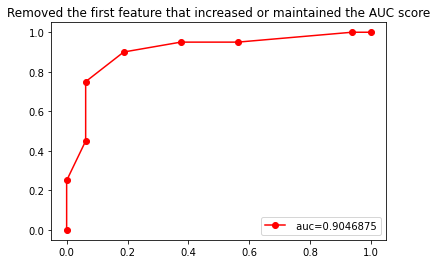

confusion matrix
[[15  1]
 [11  9]]
accuracy 0.6666666666666666
loss across folds [0.3888888888888889, 0.3333333333333333, 0.2222222222222222, 0.3333333333333333, 0.16666666666666666, 0.2777777777777778, 0.4444444444444444, 0.3888888888888889, 0.6666666666666666, 0.6111111111111112]
mean loss 0.3833333333333333


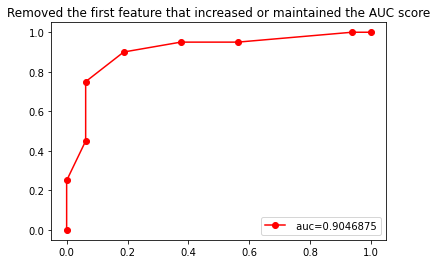

confusion matrix
[[13  3]
 [10 10]]
accuracy 0.6388888888888888
loss across folds [0.1111111111111111, 0.3333333333333333, 0.16666666666666666, 0.3888888888888889, 0.16666666666666666, 0.1111111111111111, 0.2222222222222222, 0.16666666666666666, 0.4444444444444444, 0.6111111111111112]
mean loss 0.2722222222222222


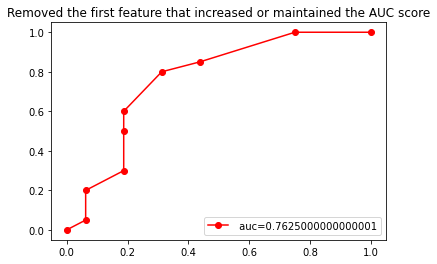

In [61]:
Get_Acc_Loss(data_greater_then_equal_auc)
Display_Roc_Auc(data_greater_then_equal_auc, "Removed the first feature that increased or maintained the AUC score", n_n)
Get_Acc_Loss(cur_data)
Display_Roc_Auc(cur_data, "Removed the first feature that increased or maintained the AUC score", n_n)
Get_Acc_Loss(data_equal)
Display_Roc_Auc(data_equal, "Removed the first feature that increased or maintained the AUC score", n_n)

In [62]:
start = process_time()
cur_data, removed = KNN_Remove_One_Greater_AUC(data_equal, c_v, n_n)
while (removed):
    cur_data, removed = KNN_Remove_One_Greater_AUC(cur_data, c_v, n_n)

data_equal_norm_greater_auc = cur_data
cur_data, removed = KNN_Remove_One_Equal_AUC(cur_data, c_v, n_n)
while (removed):
    cur_data, removed = KNN_Remove_One_Equal_AUC(cur_data, c_v, n_n)
end = process_time()

data_equal_norm_greater_then_equal_auc = cur_data
data_equal_norm_greater_then_equal_auc_time = end - start
print(data_equal_norm_greater_then_equal_auc_time)

Base AUC: 0.7625000000000001, New AUC: 0.753125 at index 0
Base AUC: 0.7625000000000001, New AUC: 0.7625000000000001 at index 1
Base AUC: 0.7625000000000001, New AUC: 0.75 at index 2
Base AUC: 0.7625000000000001, New AUC: 0.7718750000000001 at index 3
Removing feature at index:3
Base AUC: 0.7718750000000001, New AUC: 0.7421875 at index 0
Base AUC: 0.7718750000000001, New AUC: 0.759375 at index 1
Base AUC: 0.7718750000000001, New AUC: 0.7765624999999999 at index 2
Removing feature at index:2
Base AUC: 0.7765624999999999, New AUC: 0.7390625000000001 at index 0
Base AUC: 0.7765624999999999, New AUC: 0.7765625 at index 1
Removing feature at index:1
Base AUC: 0.7765625, New AUC: 0.7203124999999999 at index 0
Base AUC: 0.7765625, New AUC: 0.8078124999999999 at index 1
Removing feature at index:1
Base AUC: 0.8078124999999999, New AUC: 0.7265625 at index 0
Base AUC: 0.8078124999999999, New AUC: 0.7765624999999999 at index 1
Base AUC: 0.8078124999999999, New AUC: 0.7859375 at index 2
Base AUC: 

Base AUC: 0.84375, New AUC: 0.78125 at index 0
Base AUC: 0.84375, New AUC: 0.8046875 at index 1
Base AUC: 0.84375, New AUC: 0.8296874999999999 at index 2
Base AUC: 0.84375, New AUC: 0.8109375000000001 at index 3
Base AUC: 0.84375, New AUC: 0.8078124999999999 at index 4
Base AUC: 0.84375, New AUC: 0.8078125 at index 5
Base AUC: 0.84375, New AUC: 0.8234375 at index 6
Base AUC: 0.84375, New AUC: 0.8031250000000001 at index 7
Base AUC: 0.84375, New AUC: 0.8359375 at index 8
Base AUC: 0.84375, New AUC: 0.809375 at index 9
Base AUC: 0.84375, New AUC: 0.8078125 at index 10
Base AUC: 0.84375, New AUC: 0.8234375 at index 11
Base AUC: 0.84375, New AUC: 0.8140624999999999 at index 12
Base AUC: 0.84375, New AUC: 0.840625 at index 13
Base AUC: 0.84375, New AUC: 0.8421875 at index 14
Base AUC: 0.84375, New AUC: 0.8421875 at index 15
Base AUC: 0.84375, New AUC: 0.828125 at index 16
Base AUC: 0.84375, New AUC: 0.8265625 at index 17
Base AUC: 0.84375, New AUC: 0.840625 at index 18
Base AUC: 0.84375, Ne

Base AUC: 0.859375, New AUC: 0.840625 at index 43
Base AUC: 0.859375, New AUC: 0.8484375 at index 44
Base AUC: 0.859375, New AUC: 0.840625 at index 45
Base AUC: 0.859375, New AUC: 0.84375 at index 46
Base AUC: 0.859375, New AUC: 0.8453124999999999 at index 47
Base AUC: 0.859375, New AUC: 0.85 at index 48
Base AUC: 0.859375, New AUC: 0.85 at index 49
Base AUC: 0.859375, New AUC: 0.8484375 at index 50
Base AUC: 0.859375, New AUC: 0.8531249999999999 at index 51
Base AUC: 0.859375, New AUC: 0.834375 at index 52
Base AUC: 0.859375, New AUC: 0.8421875 at index 53
Base AUC: 0.859375, New AUC: 0.8359375000000001 at index 54
Base AUC: 0.859375, New AUC: 0.83125 at index 55
Base AUC: 0.859375, New AUC: 0.8515624999999999 at index 56
Base AUC: 0.859375, New AUC: 0.8515625 at index 57
Base AUC: 0.859375, New AUC: 0.859375 at index 58
Base AUC: 0.859375, New AUC: 0.853125 at index 59
Base AUC: 0.859375, New AUC: 0.8421875 at index 60
Base AUC: 0.859375, New AUC: 0.8453124999999999 at index 61
Base 

Base AUC: 0.8656250000000001, New AUC: 0.834375 at index 6
Base AUC: 0.8656250000000001, New AUC: 0.7687499999999999 at index 7
Base AUC: 0.8656250000000001, New AUC: 0.8328125 at index 8
Base AUC: 0.8656250000000001, New AUC: 0.809375 at index 9
Base AUC: 0.8656250000000001, New AUC: 0.7984375000000001 at index 10
Base AUC: 0.8656250000000001, New AUC: 0.85 at index 11
Base AUC: 0.8656250000000001, New AUC: 0.85625 at index 12
Base AUC: 0.8656250000000001, New AUC: 0.8406250000000001 at index 13
Base AUC: 0.8656250000000001, New AUC: 0.828125 at index 14
Base AUC: 0.8656250000000001, New AUC: 0.8343750000000001 at index 15
Base AUC: 0.8656250000000001, New AUC: 0.85 at index 16
Base AUC: 0.8656250000000001, New AUC: 0.8390625 at index 17
Base AUC: 0.8656250000000001, New AUC: 0.846875 at index 18
Base AUC: 0.8656250000000001, New AUC: 0.8421875 at index 19
Base AUC: 0.8656250000000001, New AUC: 0.8546875 at index 20
Base AUC: 0.8656250000000001, New AUC: 0.840625 at index 21
Base AUC:

Base AUC: 0.875, New AUC: 0.8624999999999999 at index 38
Base AUC: 0.875, New AUC: 0.8625 at index 39
Base AUC: 0.875, New AUC: 0.8546874999999999 at index 40
Base AUC: 0.875, New AUC: 0.8609375 at index 41
Base AUC: 0.875, New AUC: 0.8640625 at index 42
Base AUC: 0.875, New AUC: 0.85625 at index 43
Base AUC: 0.875, New AUC: 0.8500000000000001 at index 44
Base AUC: 0.875, New AUC: 0.834375 at index 45
Base AUC: 0.875, New AUC: 0.878125 at index 46
Removing feature at index:46
Base AUC: 0.878125, New AUC: 0.8140624999999999 at index 0
Base AUC: 0.878125, New AUC: 0.8421874999999999 at index 1
Base AUC: 0.878125, New AUC: 0.840625 at index 2
Base AUC: 0.878125, New AUC: 0.8421875000000001 at index 3
Base AUC: 0.878125, New AUC: 0.8531249999999999 at index 4
Base AUC: 0.878125, New AUC: 0.85625 at index 5
Base AUC: 0.878125, New AUC: 0.846875 at index 6
Base AUC: 0.878125, New AUC: 0.8265625 at index 7
Base AUC: 0.878125, New AUC: 0.8484375 at index 8
Base AUC: 0.878125, New AUC: 0.84375 

confusion matrix
[[14  2]
 [12  8]]
accuracy 0.6111111111111112
loss across folds [0.2222222222222222, 0.3333333333333333, 0.16666666666666666, 0.3333333333333333, 0.2222222222222222, 0.2222222222222222, 0.5555555555555556, 0.2777777777777778, 0.5, 0.6666666666666666]
mean loss 0.35


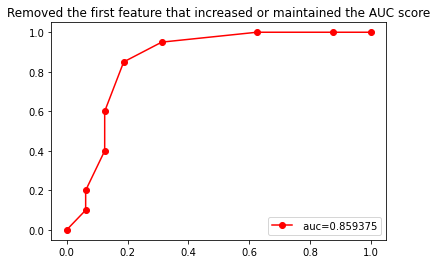

confusion matrix
[[15  1]
 [11  9]]
accuracy 0.6666666666666666
loss across folds [0.16666666666666666, 0.3333333333333333, 0.2222222222222222, 0.3333333333333333, 0.16666666666666666, 0.2777777777777778, 0.5, 0.3888888888888889, 0.6111111111111112, 0.7222222222222222]
mean loss 0.37222222222222223


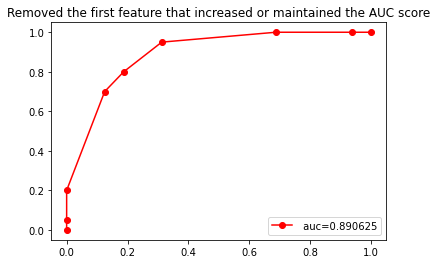

In [63]:
Get_Acc_Loss(data_equal_norm_greater_auc)
Display_Roc_Auc(data_equal_norm_greater_auc, "Removed the first feature that increased or maintained the AUC score", n_n)
Get_Acc_Loss(data_equal_norm_greater_then_equal_auc)
Display_Roc_Auc(data_equal_norm_greater_then_equal_auc, "Removed the first feature that increased or maintained the AUC score", n_n)